# Face Generation

In this project, you'll define and train a DCGAN on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **loading in data to defining and training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset is more complex than the number datasets (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed_celeba_small/`

In [1]:
# can comment out after executing
!unzip processed_celeba_small.zip

Archive:  processed_celeba_small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

In [2]:
data_dir = 'processed_celeba_small/'

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import pickle as pkl
import matplotlib.pyplot as plt
import numpy as np
import problem_unittests as tests
import helper

%matplotlib inline

## Visualize the CelebA Data

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA data.

> There are a few other steps that you'll need to **transform** this data and create a **DataLoader**.

#### Exercise: Complete the following `get_dataloader` function, such that it satisfies these requirements:

* Your images should be square, Tensor images of size `image_size x image_size` in the x and y dimension.
* Your function should return a DataLoader that shuffles and batches these Tensor images.

#### ImageFolder

To create a dataset given a directory of images, it's recommended that you use PyTorch's [ImageFolder](https://pytorch.org/docs/stable/torchvision/datasets.html#imagefolder) wrapper, with a root directory `processed_celeba_small/` and data transformation passed in.

In [3]:
# necessary imports
import torch
import torchvision
from torchvision import datasets
from torchvision import transforms
from torch.utils.data import DataLoader

In [4]:
def get_dataloader(batch_size, image_size, data_dir='processed_celeba_small/'):
    """
    Batch the neural network data using DataLoader
    :param batch_size: The size of each batch; the number of images in a batch
    :param img_size: The square size of the image data (x, y)
    :param data_dir: Directory where image data is located
    :return: DataLoader with batched data
    """
    
     # Resize and normalize the images
    transform = transforms.Compose([transforms.Resize(image_size),
                                    transforms.ToTensor()])
    
    # Define dataset using ImageFolder
    data = datasets.ImageFolder(data_dir, transform)
    
    # Create dataLoader
    data_loader = DataLoader(dataset=data, batch_size=batch_size, shuffle=True)
    
    # Return the dataloader
    return data_loader


## Create a DataLoader

#### Exercise: Create a DataLoader `celeba_train_loader` with appropriate hyperparameters.

Call the above function and create a dataloader to view images. 
* You can decide on any reasonable `batch_size` parameter
* Your `image_size` **must be** `32`. Resizing the data to a smaller size will make for faster training, while still creating convincing images of faces!

In [5]:
# Define function hyperparameters
batch_size = 128
img_size = 32

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Call your function and get a dataloader
celeba_train_loader = get_dataloader(batch_size, img_size)


Next, you can view some images! You should seen square images of somewhat-centered faces.

Note: You'll need to convert the Tensor images into a NumPy type and transpose the dimensions to correctly display an image, suggested `imshow` code is below, but it may not be perfect.

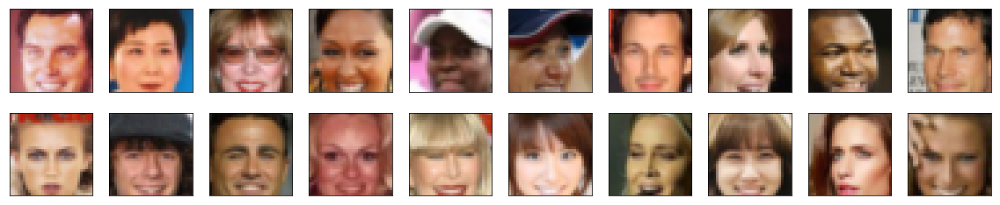

In [6]:
# helper display function
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# obtain one batch of training images
dataiter = iter(celeba_train_loader)
images, _ = dataiter.next() # _ for no labels

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, plot_size/2, idx+1, xticks=[], yticks=[])
    imshow(images[idx])

#### Exercise: Pre-process your image data and scale it to a pixel range of -1 to 1

You need to do a bit of pre-processing; you know that the output of a `tanh` activated generator will contain pixel values in a range from -1 to 1, and so, we need to rescale our training images to a range of -1 to 1. (Right now, they are in a range from 0-1.)

In [7]:
# Complete the scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x
    min, max = feature_range
    x = x * (max - min) + min
    
    return x


In [8]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# check scaled range
# should be close to -1 to 1
img = images[0]
scaled_img = scale(img)

print('Min: ', scaled_img.min())
print('Max: ', scaled_img.max())

Min:  tensor(-0.8353)
Max:  tensor(0.9608)


---
# Define the Model

A GAN is comprised of two adversarial networks, a discriminator and a generator.

## Discriminator

Your first task will be to define the discriminator. This is a convolutional classifier like you've built before, only without any maxpooling layers. To deal with this complex data, it's suggested you use a deep network with **normalization**. You are also allowed to create any helper functions that may be useful.

#### Exercise: Complete the Discriminator class
* The inputs to the discriminator are 32x32x3 tensor images
* The output should be a single value that will indicate whether a given image is real or fake


In [9]:
import torch.nn as nn
import torch.nn.functional as F
from helper import conv, deconv

In [10]:
class Discriminator(nn.Module):

    def __init__(self, conv_dim):
        """
        Initialize the Discriminator Module
        :param conv_dim: The depth of the first convolutional layer
        """
        super(Discriminator, self).__init__()

        self.conv_dim = conv_dim

        # 32x32 input
        self.conv1 = conv(3, conv_dim, 4, batch_norm=False) # first layer, no batch_norm
        # 16x16 out
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        # 8x8 out
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)
        # 4x4 out
        
        # Final, fully-connected layer
        self.fc = nn.Linear(conv_dim*4*4*4, 1)

        # Dropout layer
        self.dropout = nn.Dropout2d(p=0.4) 
        

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: Discriminator logits; the output of the neural network
        """
        # Define feedforward behavior
       
        # All hidden layers + leaky relu activation + dropout
        x = F.leaky_relu(self.conv1(x), 0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.conv2(x), 0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.conv3(x), 0.2)
        x = self.dropout(x)
        
        # Flatten
        x = x.view(-1, self.conv_dim*4*4*4)
        
        # Final output layer
        x = self.fc(x) 
        
        return x


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(Discriminator)

Tests Passed


## Generator

The generator should upsample an input and generate a *new* image of the same size as our training data `32x32x3`. This should be mostly transpose convolutional layers with normalization applied to the outputs.

#### Exercise: Complete the Generator class
* The inputs to the generator are vectors of some length `z_size`
* The output should be a image of shape `32x32x3`

In [11]:
class Generator(nn.Module):
    
    def __init__(self, z_size, conv_dim):
        """
        Initialize the Generator Module
        :param z_size: The length of the input latent vector, z
        :param conv_dim: The depth of the inputs to the *last* transpose convolutional layer
        """
        super(Generator, self).__init__()

        self.conv_dim = conv_dim
        
        # First, fully-connected layer
        self.fc = nn.Linear(z_size, conv_dim*4*4*4)
        
        # Transpose conv layers
        self.t_conv1 = deconv(conv_dim*4, conv_dim*2, 4)
        self.t_conv2 = deconv(conv_dim*2, conv_dim, 4)
        self.t_conv3 = deconv(conv_dim, 3, 4, batch_norm=False)

        # Dropout layer
        self.dropout = nn.Dropout2d(p=0.4)     

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: A 32x32x3 Tensor image as output
        """
        # Define feedforward behavior
        
        # Fully-connected + reshape 
        x = self.fc(x)
        x = x.view(-1, self.conv_dim*4, 4, 4) # (batch_size, depth, 4, 4)
        
        # hidden transpose conv layers + relu + dropout
        x = F.relu(self.t_conv1(x))
        x = self.dropout(x)
        x = F.relu(self.t_conv2(x))
        x = self.dropout(x)
        
        # last layer + tanh activation
        x = self.t_conv3(x)
        x = F.tanh(x)
        
        return x

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(Generator)

Tests Passed


## Initialize the weights of your networks

To help your models converge, you should initialize the weights of the convolutional and linear layers in your model. From reading the [original DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf), they say:
> All weights were initialized from a zero-centered Normal distribution with standard deviation 0.02.

So, your next task will be to define a weight initialization function that does just this!

You can refer back to the lesson on weight initialization or even consult existing model code, such as that from [the `networks.py` file in CycleGAN Github repository](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/models/networks.py) to help you complete this function.

#### Exercise: Complete the weight initialization function

* This should initialize only **convolutional** and **linear** layers
* Initialize the weights to a normal distribution, centered around 0, with a standard deviation of 0.02.
* The bias terms, if they exist, may be left alone or set to 0.

In [12]:
def weights_init_normal(m):
    """
    Applies initial weights to certain layers in a model .
    The weights are taken from a normal distribution 
    with mean = 0, std dev = 0.02.
    :param m: A module or layer in a network    
    """
    # classname will be something like:
    # `Conv`, `BatchNorm2d`, `Linear`, etc.
    classname = m.__class__.__name__
    
    # Apply initial weights to convolutional and linear layers
    if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
        m.weight.data.normal_(0, 0.02)
    
        # Set the bias terms to 0, if they exist 
        if hasattr(m, 'bias') and m.bias is not None:
            m.bias.data.fill_(0)
    

## Build complete network

Define your models' hyperparameters and instantiate the discriminator and generator from the classes defined above. Make sure you've passed in the correct input arguments.

In [13]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
def build_network(d_conv_dim, g_conv_dim, z_size):
    # define discriminator and generator
    D = Discriminator(d_conv_dim)
    G = Generator(z_size=z_size, conv_dim=g_conv_dim)

    # initialize model weights
    D.apply(weights_init_normal)
    G.apply(weights_init_normal)

    print(D)
    print()
    print(G)
    
    return D, G


#### Exercise: Define model hyperparameters

In [14]:
# Define model hyperparams
d_conv_dim = 64
g_conv_dim = 64
z_size = 100

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
D, G = build_network(d_conv_dim, g_conv_dim, z_size)

Discriminator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (fc): Linear(in_features=4096, out_features=1, bias=True)
  (dropout): Dropout2d(p=0.4)
)

Generator(
  (fc): Linear(in_features=100, out_features=4096, bias=True)
  (t_conv1): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (t_conv2): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4),

### Training on GPU

Check if you can train on GPU. Here, we'll set this as a boolean variable `train_on_gpu`. Later, you'll be responsible for making sure that 
>* Models,
* Model inputs, and
* Loss function arguments

Are moved to GPU, where appropriate.

In [15]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import torch

# Check for a GPU
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Training on GPU!')

Training on GPU!


---
## Discriminator and Generator Losses

Now we need to calculate the losses for both types of adversarial networks.

### Discriminator Losses

> * For the discriminator, the total loss is the sum of the losses for real and fake images, `d_loss = d_real_loss + d_fake_loss`. 
* Remember that we want the discriminator to output 1 for real images and 0 for fake images, so we need to set up the losses to reflect that.


### Generator Loss

The generator loss will look similar only with flipped labels. The generator's goal is to get the discriminator to *think* its generated images are *real*.

#### Exercise: Complete real and fake loss functions

**You may choose to use either cross entropy or a least squares error loss to complete the following `real_loss` and `fake_loss` functions.**

In [16]:
def real_loss(D_out):
    '''Calculates how close discriminator outputs are to being real.
       param, D_out: discriminator logits
       return: real loss'''
    
    batch_size = D_out.size(0)
  
    # Real labels = 1
    labels = torch.ones(batch_size) 
    
    # Move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    
    # Binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    
    # Calculate loss
    loss = criterion(D_out.squeeze(), labels)
    
    return loss

def fake_loss(D_out):
    '''Calculates how close discriminator outputs are to being fake.
       param, D_out: discriminator logits
       return: fake loss'''
    batch_size = D_out.size(0)
    
    # Fake labels = 0
    labels = torch.zeros(batch_size) 
    
    # Move labels to GPU if available
    if train_on_gpu:
        labels = labels.cuda()
    
    # Binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    
    # Calculate loss
    loss = criterion(D_out.squeeze(), labels)
    
    return loss

## Optimizers

#### Exercise: Define optimizers for your Discriminator (D) and Generator (G)

Define optimizers for your models with appropriate hyperparameters.

In [17]:
import torch.optim as optim

# params
lr = 0.00002
beta1=0.5
beta2=0.999 # default value

# Create optimizers for the discriminator D and generator G
d_optimizer = optim.Adam(D.parameters(), lr, [beta1, beta2])
g_optimizer = optim.Adam(G.parameters(), lr, [beta1, beta2])

---
## Training

Training will involve alternating between training the discriminator and the generator. You'll use your functions `real_loss` and `fake_loss` to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function


#### Saving Samples

You've been given some code to print out some loss statistics and save some generated "fake" samples.

#### Exercise: Complete the training function

Keep in mind that, if you've moved your models to GPU, you'll also have to move any model inputs to GPU.

In [18]:
def train(D, G, n_epochs, print_every=50):
    '''Trains adversarial networks for some number of epochs
       param, D: the discriminator network
       param, G: the generator network
       param, n_epochs: number of epochs to train for
       param, print_every: when to print and record the models' losses
       return: D and G losses'''
    
    # move models to GPU
    if train_on_gpu:
        D.cuda()
        G.cuda()

    # keep track of loss and generated, "fake" samples
    samples = []
    losses = []

    # Get some fixed data for sampling. These are images that are held
    # constant throughout training, and allow us to inspect the model's performance
    sample_size=16
    fixed_z = np.random.uniform(-1, 1, size=(sample_size, z_size))
    fixed_z = torch.from_numpy(fixed_z).float()
    # move z to GPU if available
    if train_on_gpu:
        fixed_z = fixed_z.cuda()

    # epoch training loop
    for epoch in range(n_epochs):

        # batch training loop
        for batch_i, (real_images, _) in enumerate(celeba_train_loader):

            batch_size = real_images.size(0)
            real_images = scale(real_images)

            # ===============================================
            #              TRAIN THE NETWORKS
            # ===============================================
            # 1. Train the discriminator on real and fake images
            d_optimizer.zero_grad()
            
            ## Train with real images ##
            # Compute the discriminator losses on real images 
            if train_on_gpu:
                real_images = real_images.cuda()
        
            D_real = D(real_images)
            d_real_loss = real_loss(D_real)
        
            ## Train with fake images ##
        
            # Generate fake images
            z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z = torch.from_numpy(z).float()
            
            # move x to GPU, if available
            if train_on_gpu:
                z = z.cuda()
            fake_images = G(z)
        
            # Compute the discriminator losses on fake images            
            D_fake = D(fake_images)
            d_fake_loss = fake_loss(D_fake)
        
            # add up loss and perform backprop
            d_loss = d_real_loss + d_fake_loss
            d_loss.backward()
            d_optimizer.step()

            # 2. Train the generator with an adversarial loss
            g_optimizer.zero_grad()

            # Generate fake images
            z = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z = torch.from_numpy(z).float()
            if train_on_gpu:
                z = z.cuda()
            fake_images = G(z)
        
            # Compute the discriminator losses on fake images 
            # using flipped labels!
            D_fake = D(fake_images)
            g_loss = real_loss(D_fake) # use real loss to flip labels
        
            # perform backprop
            g_loss.backward()
            g_optimizer.step()
            # ===============================================

            # Print some loss stats
            if batch_i % print_every == 0:
                # append discriminator loss and generator loss
                losses.append((d_loss.item(), g_loss.item()))
                # print discriminator and generator loss
                print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                        epoch+1, n_epochs, d_loss.item(), g_loss.item()))


        ## AFTER EACH EPOCH##    
        # this code assumes your generator is named G, feel free to change the name
        # generate and save sample, fake images
        G.eval() # for generating samples
        samples_z = G(fixed_z)
        samples.append(samples_z)
        
        img = torchvision.utils.make_grid(samples_z)
        img = img.cpu().detach().numpy()
        img = ((img + 1)*255 / (2)).astype(np.uint8)
        plt.figure(figsize = (12,10))
        plt.imshow(np.transpose(img, (1,2,0)))
        plt.axis('off')
        plt.show()
        
        G.train() # back to training mode

    # Save training generator samples
    with open('train_samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    # finally return losses
    return losses

Set your number of training epochs and train your GAN!

Epoch [    1/  150] | d_loss: 1.5496 | g_loss: 0.9232
Epoch [    1/  150] | d_loss: 0.7715 | g_loss: 1.2438
Epoch [    1/  150] | d_loss: 0.5348 | g_loss: 1.5437
Epoch [    1/  150] | d_loss: 0.4500 | g_loss: 1.9582
Epoch [    1/  150] | d_loss: 0.3207 | g_loss: 2.0177
Epoch [    1/  150] | d_loss: 0.3262 | g_loss: 2.1818
Epoch [    1/  150] | d_loss: 0.2224 | g_loss: 2.3312
Epoch [    1/  150] | d_loss: 0.2551 | g_loss: 2.4958
Epoch [    1/  150] | d_loss: 0.2732 | g_loss: 2.3489
Epoch [    1/  150] | d_loss: 0.2632 | g_loss: 2.4653
Epoch [    1/  150] | d_loss: 0.2107 | g_loss: 2.6568
Epoch [    1/  150] | d_loss: 0.2311 | g_loss: 2.6452
Epoch [    1/  150] | d_loss: 0.3180 | g_loss: 2.6864
Epoch [    1/  150] | d_loss: 0.2414 | g_loss: 2.7678
Epoch [    1/  150] | d_loss: 0.2837 | g_loss: 2.7514


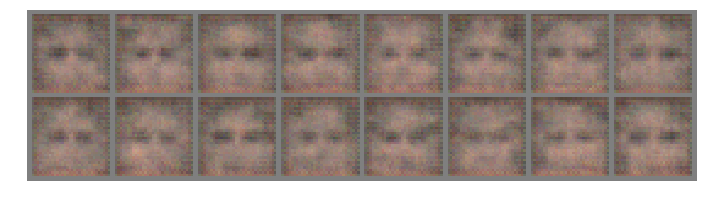

Epoch [    2/  150] | d_loss: 0.2303 | g_loss: 2.9690
Epoch [    2/  150] | d_loss: 0.1980 | g_loss: 3.0326
Epoch [    2/  150] | d_loss: 0.2536 | g_loss: 3.1210
Epoch [    2/  150] | d_loss: 0.2527 | g_loss: 2.9962
Epoch [    2/  150] | d_loss: 0.1675 | g_loss: 3.1480
Epoch [    2/  150] | d_loss: 0.1665 | g_loss: 3.5766
Epoch [    2/  150] | d_loss: 0.1458 | g_loss: 3.5734
Epoch [    2/  150] | d_loss: 0.1812 | g_loss: 3.8492
Epoch [    2/  150] | d_loss: 0.1606 | g_loss: 3.9210
Epoch [    2/  150] | d_loss: 0.1479 | g_loss: 3.8993
Epoch [    2/  150] | d_loss: 0.1359 | g_loss: 3.9495
Epoch [    2/  150] | d_loss: 0.1138 | g_loss: 4.0954
Epoch [    2/  150] | d_loss: 0.1396 | g_loss: 4.3267
Epoch [    2/  150] | d_loss: 0.2076 | g_loss: 4.5988
Epoch [    2/  150] | d_loss: 0.1480 | g_loss: 4.3451


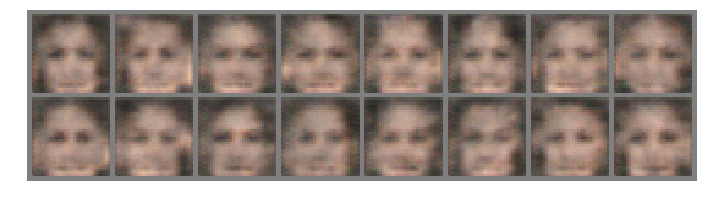

Epoch [    3/  150] | d_loss: 0.0858 | g_loss: 4.8458
Epoch [    3/  150] | d_loss: 0.1130 | g_loss: 4.8626
Epoch [    3/  150] | d_loss: 0.1202 | g_loss: 4.0675
Epoch [    3/  150] | d_loss: 0.1414 | g_loss: 4.5137
Epoch [    3/  150] | d_loss: 0.1543 | g_loss: 3.3716
Epoch [    3/  150] | d_loss: 0.2067 | g_loss: 4.3700
Epoch [    3/  150] | d_loss: 0.2526 | g_loss: 4.1145
Epoch [    3/  150] | d_loss: 0.2637 | g_loss: 4.1250
Epoch [    3/  150] | d_loss: 0.2483 | g_loss: 3.9494
Epoch [    3/  150] | d_loss: 0.2751 | g_loss: 3.4249
Epoch [    3/  150] | d_loss: 0.1785 | g_loss: 3.8901
Epoch [    3/  150] | d_loss: 0.2478 | g_loss: 3.5682
Epoch [    3/  150] | d_loss: 0.2990 | g_loss: 3.4197
Epoch [    3/  150] | d_loss: 0.2858 | g_loss: 3.5894
Epoch [    3/  150] | d_loss: 0.3147 | g_loss: 3.1824


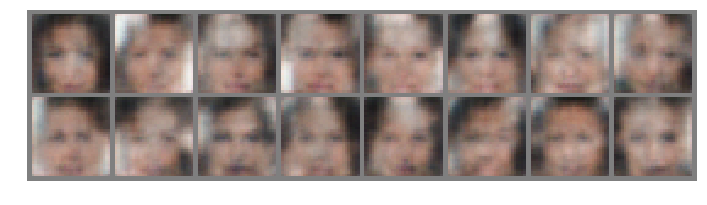

Epoch [    4/  150] | d_loss: 0.2893 | g_loss: 3.4441
Epoch [    4/  150] | d_loss: 0.3006 | g_loss: 3.2213
Epoch [    4/  150] | d_loss: 0.2666 | g_loss: 3.3500
Epoch [    4/  150] | d_loss: 0.3934 | g_loss: 3.3397
Epoch [    4/  150] | d_loss: 0.2851 | g_loss: 3.3042
Epoch [    4/  150] | d_loss: 0.2238 | g_loss: 3.3725
Epoch [    4/  150] | d_loss: 0.2714 | g_loss: 3.5488
Epoch [    4/  150] | d_loss: 0.3660 | g_loss: 2.7924
Epoch [    4/  150] | d_loss: 0.2690 | g_loss: 3.2833
Epoch [    4/  150] | d_loss: 0.3713 | g_loss: 2.9933
Epoch [    4/  150] | d_loss: 0.4286 | g_loss: 3.4306
Epoch [    4/  150] | d_loss: 0.3251 | g_loss: 2.7603
Epoch [    4/  150] | d_loss: 0.3781 | g_loss: 2.9934
Epoch [    4/  150] | d_loss: 0.5153 | g_loss: 3.3749
Epoch [    4/  150] | d_loss: 0.2682 | g_loss: 3.6965


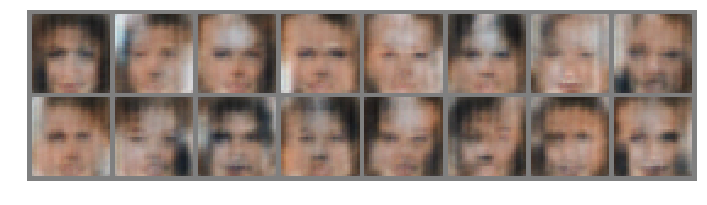

Epoch [    5/  150] | d_loss: 0.3253 | g_loss: 3.0442
Epoch [    5/  150] | d_loss: 0.3643 | g_loss: 3.0090
Epoch [    5/  150] | d_loss: 0.2716 | g_loss: 3.5135
Epoch [    5/  150] | d_loss: 0.3188 | g_loss: 3.4506
Epoch [    5/  150] | d_loss: 0.3000 | g_loss: 2.9797
Epoch [    5/  150] | d_loss: 0.5182 | g_loss: 2.8523
Epoch [    5/  150] | d_loss: 0.3359 | g_loss: 3.5678
Epoch [    5/  150] | d_loss: 0.4440 | g_loss: 3.5053
Epoch [    5/  150] | d_loss: 0.4563 | g_loss: 2.6418
Epoch [    5/  150] | d_loss: 0.2837 | g_loss: 3.1891
Epoch [    5/  150] | d_loss: 0.3465 | g_loss: 3.1294
Epoch [    5/  150] | d_loss: 0.3858 | g_loss: 2.8614
Epoch [    5/  150] | d_loss: 0.4336 | g_loss: 2.3721
Epoch [    5/  150] | d_loss: 0.4874 | g_loss: 2.5800
Epoch [    5/  150] | d_loss: 0.4568 | g_loss: 2.3214


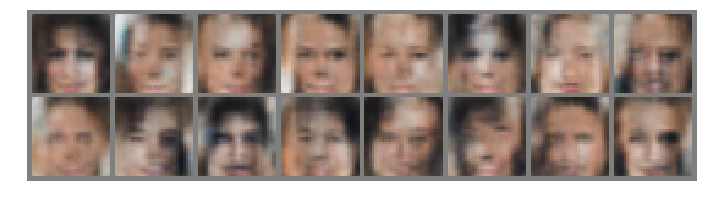

Epoch [    6/  150] | d_loss: 0.5201 | g_loss: 3.0629
Epoch [    6/  150] | d_loss: 0.4006 | g_loss: 2.6147
Epoch [    6/  150] | d_loss: 0.4053 | g_loss: 2.9080
Epoch [    6/  150] | d_loss: 0.4822 | g_loss: 2.0634
Epoch [    6/  150] | d_loss: 0.4511 | g_loss: 2.3707
Epoch [    6/  150] | d_loss: 0.3882 | g_loss: 3.1568
Epoch [    6/  150] | d_loss: 0.4888 | g_loss: 2.3025
Epoch [    6/  150] | d_loss: 0.3926 | g_loss: 2.4701
Epoch [    6/  150] | d_loss: 0.4768 | g_loss: 2.5442
Epoch [    6/  150] | d_loss: 0.4226 | g_loss: 2.8311
Epoch [    6/  150] | d_loss: 0.5617 | g_loss: 2.7830
Epoch [    6/  150] | d_loss: 0.3811 | g_loss: 2.5830
Epoch [    6/  150] | d_loss: 0.4048 | g_loss: 1.9922
Epoch [    6/  150] | d_loss: 0.5327 | g_loss: 2.7565
Epoch [    6/  150] | d_loss: 0.5020 | g_loss: 2.4352


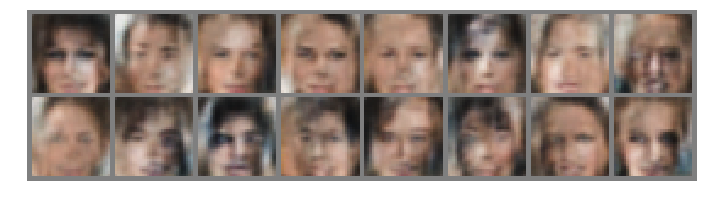

Epoch [    7/  150] | d_loss: 0.5141 | g_loss: 2.3508
Epoch [    7/  150] | d_loss: 0.5074 | g_loss: 2.5769
Epoch [    7/  150] | d_loss: 0.5956 | g_loss: 2.0195
Epoch [    7/  150] | d_loss: 0.5258 | g_loss: 2.9561
Epoch [    7/  150] | d_loss: 0.5549 | g_loss: 2.3856
Epoch [    7/  150] | d_loss: 0.4067 | g_loss: 2.2790
Epoch [    7/  150] | d_loss: 0.5356 | g_loss: 2.7900
Epoch [    7/  150] | d_loss: 0.5641 | g_loss: 2.4484
Epoch [    7/  150] | d_loss: 0.4680 | g_loss: 2.3125
Epoch [    7/  150] | d_loss: 0.5512 | g_loss: 2.1543
Epoch [    7/  150] | d_loss: 0.5236 | g_loss: 2.1019
Epoch [    7/  150] | d_loss: 0.5226 | g_loss: 2.3387
Epoch [    7/  150] | d_loss: 0.4887 | g_loss: 2.5790
Epoch [    7/  150] | d_loss: 0.6203 | g_loss: 2.7433
Epoch [    7/  150] | d_loss: 0.5184 | g_loss: 2.1870


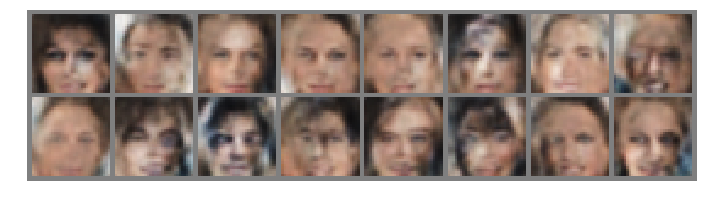

Epoch [    8/  150] | d_loss: 0.3940 | g_loss: 2.4518
Epoch [    8/  150] | d_loss: 0.4850 | g_loss: 2.5494
Epoch [    8/  150] | d_loss: 0.4871 | g_loss: 2.2569
Epoch [    8/  150] | d_loss: 0.5663 | g_loss: 2.0360
Epoch [    8/  150] | d_loss: 0.4600 | g_loss: 2.1881
Epoch [    8/  150] | d_loss: 0.5715 | g_loss: 1.9968
Epoch [    8/  150] | d_loss: 0.5681 | g_loss: 2.0118
Epoch [    8/  150] | d_loss: 0.7097 | g_loss: 2.0869
Epoch [    8/  150] | d_loss: 0.6633 | g_loss: 2.0041
Epoch [    8/  150] | d_loss: 0.6472 | g_loss: 2.1643
Epoch [    8/  150] | d_loss: 0.7553 | g_loss: 1.7567
Epoch [    8/  150] | d_loss: 0.6404 | g_loss: 1.7205
Epoch [    8/  150] | d_loss: 0.5866 | g_loss: 2.4668
Epoch [    8/  150] | d_loss: 0.6573 | g_loss: 2.1793
Epoch [    8/  150] | d_loss: 0.5701 | g_loss: 2.0987


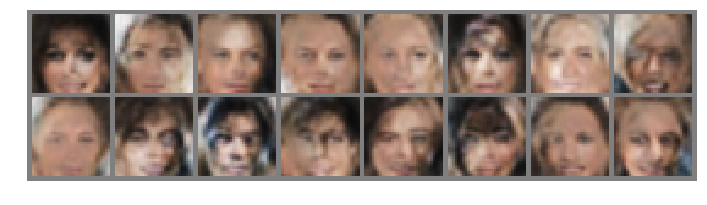

Epoch [    9/  150] | d_loss: 0.5774 | g_loss: 2.2193
Epoch [    9/  150] | d_loss: 0.8278 | g_loss: 1.7730
Epoch [    9/  150] | d_loss: 0.4789 | g_loss: 2.0907
Epoch [    9/  150] | d_loss: 0.7494 | g_loss: 1.9783
Epoch [    9/  150] | d_loss: 0.5666 | g_loss: 1.7254
Epoch [    9/  150] | d_loss: 0.6515 | g_loss: 2.1143
Epoch [    9/  150] | d_loss: 0.6642 | g_loss: 2.1028
Epoch [    9/  150] | d_loss: 0.7923 | g_loss: 2.3180
Epoch [    9/  150] | d_loss: 0.6829 | g_loss: 2.0452
Epoch [    9/  150] | d_loss: 0.6070 | g_loss: 1.3575
Epoch [    9/  150] | d_loss: 0.7865 | g_loss: 1.6977
Epoch [    9/  150] | d_loss: 0.9502 | g_loss: 1.6978
Epoch [    9/  150] | d_loss: 0.6022 | g_loss: 1.7790
Epoch [    9/  150] | d_loss: 0.7060 | g_loss: 2.0023
Epoch [    9/  150] | d_loss: 0.7093 | g_loss: 1.4500


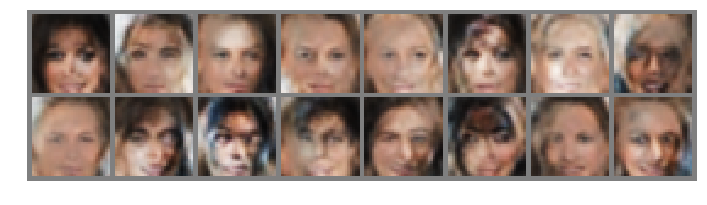

Epoch [   10/  150] | d_loss: 0.7271 | g_loss: 1.7952
Epoch [   10/  150] | d_loss: 0.7605 | g_loss: 1.8895
Epoch [   10/  150] | d_loss: 0.6996 | g_loss: 2.1842
Epoch [   10/  150] | d_loss: 0.7121 | g_loss: 2.2448
Epoch [   10/  150] | d_loss: 0.7889 | g_loss: 1.7987
Epoch [   10/  150] | d_loss: 0.7778 | g_loss: 2.1800
Epoch [   10/  150] | d_loss: 0.6446 | g_loss: 1.9913
Epoch [   10/  150] | d_loss: 0.7641 | g_loss: 2.1018
Epoch [   10/  150] | d_loss: 0.7097 | g_loss: 2.3033
Epoch [   10/  150] | d_loss: 0.8268 | g_loss: 1.9193
Epoch [   10/  150] | d_loss: 0.7652 | g_loss: 1.6840
Epoch [   10/  150] | d_loss: 0.8616 | g_loss: 1.6442
Epoch [   10/  150] | d_loss: 0.7626 | g_loss: 1.4199
Epoch [   10/  150] | d_loss: 0.7618 | g_loss: 2.3491
Epoch [   10/  150] | d_loss: 0.7628 | g_loss: 1.7009


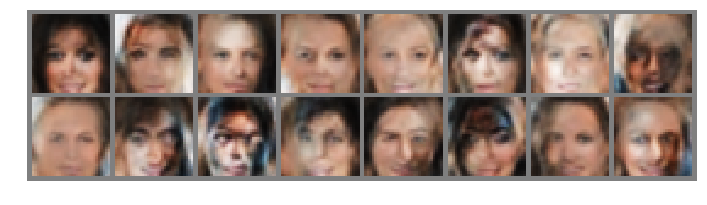

Epoch [   11/  150] | d_loss: 0.8928 | g_loss: 2.0300
Epoch [   11/  150] | d_loss: 1.0089 | g_loss: 1.4615
Epoch [   11/  150] | d_loss: 0.9400 | g_loss: 1.7255
Epoch [   11/  150] | d_loss: 0.7215 | g_loss: 1.5794
Epoch [   11/  150] | d_loss: 0.7767 | g_loss: 1.5101
Epoch [   11/  150] | d_loss: 0.9178 | g_loss: 1.9398
Epoch [   11/  150] | d_loss: 0.9477 | g_loss: 1.5131
Epoch [   11/  150] | d_loss: 0.7020 | g_loss: 2.0444
Epoch [   11/  150] | d_loss: 0.7652 | g_loss: 1.7125
Epoch [   11/  150] | d_loss: 0.7922 | g_loss: 1.9461
Epoch [   11/  150] | d_loss: 0.8413 | g_loss: 1.9429
Epoch [   11/  150] | d_loss: 0.6956 | g_loss: 1.7411
Epoch [   11/  150] | d_loss: 0.7601 | g_loss: 1.9279
Epoch [   11/  150] | d_loss: 0.8979 | g_loss: 1.5118
Epoch [   11/  150] | d_loss: 1.0222 | g_loss: 1.9203


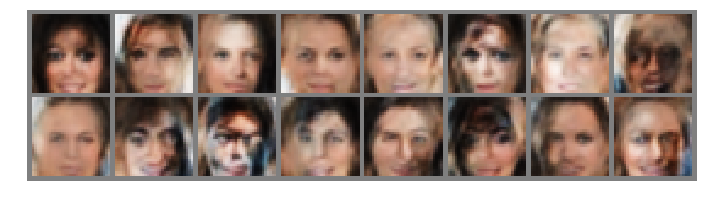

Epoch [   12/  150] | d_loss: 0.8925 | g_loss: 1.5780
Epoch [   12/  150] | d_loss: 0.8868 | g_loss: 1.7798
Epoch [   12/  150] | d_loss: 1.0127 | g_loss: 2.1813
Epoch [   12/  150] | d_loss: 0.9685 | g_loss: 1.4764
Epoch [   12/  150] | d_loss: 0.8702 | g_loss: 1.8812
Epoch [   12/  150] | d_loss: 0.6447 | g_loss: 2.0389
Epoch [   12/  150] | d_loss: 1.0824 | g_loss: 2.1937
Epoch [   12/  150] | d_loss: 0.7660 | g_loss: 1.3774
Epoch [   12/  150] | d_loss: 0.8088 | g_loss: 1.4901
Epoch [   12/  150] | d_loss: 0.9000 | g_loss: 1.7329
Epoch [   12/  150] | d_loss: 0.9619 | g_loss: 1.3589
Epoch [   12/  150] | d_loss: 1.1504 | g_loss: 1.3187
Epoch [   12/  150] | d_loss: 0.8455 | g_loss: 1.8978
Epoch [   12/  150] | d_loss: 0.9659 | g_loss: 1.4199
Epoch [   12/  150] | d_loss: 0.6702 | g_loss: 1.3085


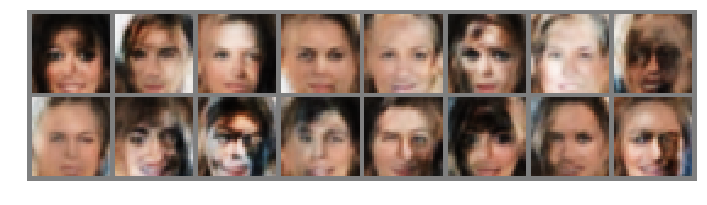

Epoch [   13/  150] | d_loss: 0.9964 | g_loss: 2.0110
Epoch [   13/  150] | d_loss: 1.0584 | g_loss: 1.3245
Epoch [   13/  150] | d_loss: 0.6896 | g_loss: 1.5332
Epoch [   13/  150] | d_loss: 0.9864 | g_loss: 1.6119
Epoch [   13/  150] | d_loss: 0.7546 | g_loss: 1.1016
Epoch [   13/  150] | d_loss: 0.7265 | g_loss: 2.0158
Epoch [   13/  150] | d_loss: 0.7375 | g_loss: 1.6620
Epoch [   13/  150] | d_loss: 0.8765 | g_loss: 1.4928
Epoch [   13/  150] | d_loss: 1.0401 | g_loss: 1.2701
Epoch [   13/  150] | d_loss: 0.8636 | g_loss: 1.7193
Epoch [   13/  150] | d_loss: 1.0243 | g_loss: 1.5166
Epoch [   13/  150] | d_loss: 0.9978 | g_loss: 1.4876
Epoch [   13/  150] | d_loss: 0.9606 | g_loss: 2.0202
Epoch [   13/  150] | d_loss: 0.8902 | g_loss: 1.4135
Epoch [   13/  150] | d_loss: 0.7356 | g_loss: 1.1886


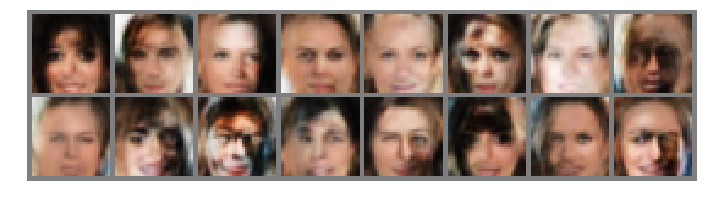

Epoch [   14/  150] | d_loss: 1.0323 | g_loss: 1.5753
Epoch [   14/  150] | d_loss: 1.1115 | g_loss: 1.6200
Epoch [   14/  150] | d_loss: 1.2882 | g_loss: 1.2253
Epoch [   14/  150] | d_loss: 0.9000 | g_loss: 1.2971
Epoch [   14/  150] | d_loss: 0.9332 | g_loss: 1.4090
Epoch [   14/  150] | d_loss: 1.1007 | g_loss: 1.3775
Epoch [   14/  150] | d_loss: 0.8970 | g_loss: 1.2598
Epoch [   14/  150] | d_loss: 0.7516 | g_loss: 1.4760
Epoch [   14/  150] | d_loss: 0.8645 | g_loss: 1.4344
Epoch [   14/  150] | d_loss: 0.9959 | g_loss: 1.2783
Epoch [   14/  150] | d_loss: 0.9416 | g_loss: 1.4588
Epoch [   14/  150] | d_loss: 0.9819 | g_loss: 1.5364
Epoch [   14/  150] | d_loss: 1.0496 | g_loss: 1.5065
Epoch [   14/  150] | d_loss: 1.0839 | g_loss: 1.5088
Epoch [   14/  150] | d_loss: 0.9436 | g_loss: 1.6294


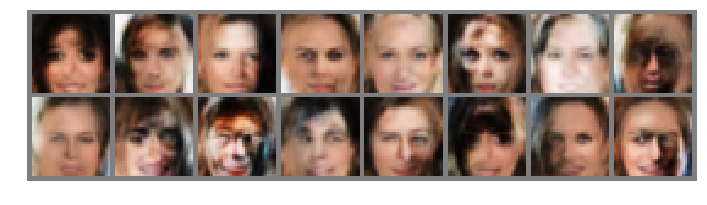

Epoch [   15/  150] | d_loss: 1.1364 | g_loss: 1.3031
Epoch [   15/  150] | d_loss: 0.8896 | g_loss: 1.3700
Epoch [   15/  150] | d_loss: 1.0553 | g_loss: 1.3470
Epoch [   15/  150] | d_loss: 1.0630 | g_loss: 1.2832
Epoch [   15/  150] | d_loss: 0.8931 | g_loss: 1.3046
Epoch [   15/  150] | d_loss: 0.9534 | g_loss: 1.4087
Epoch [   15/  150] | d_loss: 0.8402 | g_loss: 1.5002
Epoch [   15/  150] | d_loss: 0.8162 | g_loss: 1.2019
Epoch [   15/  150] | d_loss: 1.0042 | g_loss: 1.1066
Epoch [   15/  150] | d_loss: 0.9020 | g_loss: 1.5691
Epoch [   15/  150] | d_loss: 1.1540 | g_loss: 1.2914
Epoch [   15/  150] | d_loss: 0.9346 | g_loss: 1.3555
Epoch [   15/  150] | d_loss: 1.0294 | g_loss: 1.6293
Epoch [   15/  150] | d_loss: 1.1474 | g_loss: 1.3561
Epoch [   15/  150] | d_loss: 0.6287 | g_loss: 1.3343


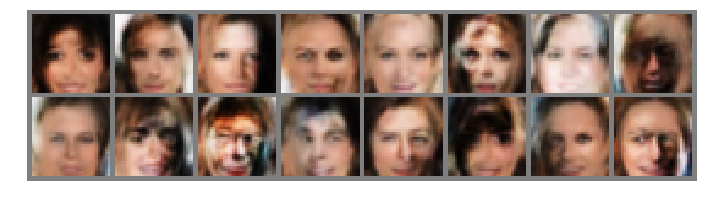

Epoch [   16/  150] | d_loss: 1.1467 | g_loss: 1.2129
Epoch [   16/  150] | d_loss: 1.0607 | g_loss: 1.5838
Epoch [   16/  150] | d_loss: 0.8589 | g_loss: 1.1894
Epoch [   16/  150] | d_loss: 0.8724 | g_loss: 1.5639
Epoch [   16/  150] | d_loss: 0.8868 | g_loss: 1.5944
Epoch [   16/  150] | d_loss: 0.9715 | g_loss: 1.4846
Epoch [   16/  150] | d_loss: 0.9334 | g_loss: 1.3246
Epoch [   16/  150] | d_loss: 1.0445 | g_loss: 1.6655
Epoch [   16/  150] | d_loss: 0.9224 | g_loss: 1.5602
Epoch [   16/  150] | d_loss: 1.0131 | g_loss: 1.1392
Epoch [   16/  150] | d_loss: 0.8769 | g_loss: 1.2705
Epoch [   16/  150] | d_loss: 1.0231 | g_loss: 1.4713
Epoch [   16/  150] | d_loss: 1.1809 | g_loss: 0.9039
Epoch [   16/  150] | d_loss: 0.9741 | g_loss: 1.4452
Epoch [   16/  150] | d_loss: 0.9323 | g_loss: 1.3601


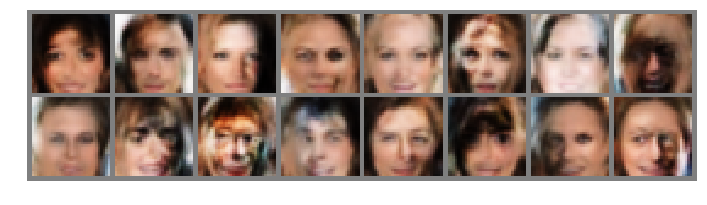

Epoch [   17/  150] | d_loss: 1.0127 | g_loss: 1.1589
Epoch [   17/  150] | d_loss: 1.0118 | g_loss: 1.3873
Epoch [   17/  150] | d_loss: 0.9638 | g_loss: 1.4518
Epoch [   17/  150] | d_loss: 0.9707 | g_loss: 1.2855
Epoch [   17/  150] | d_loss: 0.9969 | g_loss: 1.1079
Epoch [   17/  150] | d_loss: 0.7805 | g_loss: 1.0672
Epoch [   17/  150] | d_loss: 1.0439 | g_loss: 1.5001
Epoch [   17/  150] | d_loss: 0.7604 | g_loss: 1.5005
Epoch [   17/  150] | d_loss: 0.9995 | g_loss: 1.4609
Epoch [   17/  150] | d_loss: 1.0032 | g_loss: 1.1751
Epoch [   17/  150] | d_loss: 1.2018 | g_loss: 1.7071
Epoch [   17/  150] | d_loss: 0.9830 | g_loss: 1.1837
Epoch [   17/  150] | d_loss: 0.8186 | g_loss: 1.4603
Epoch [   17/  150] | d_loss: 1.2613 | g_loss: 1.1735
Epoch [   17/  150] | d_loss: 0.8570 | g_loss: 1.0622


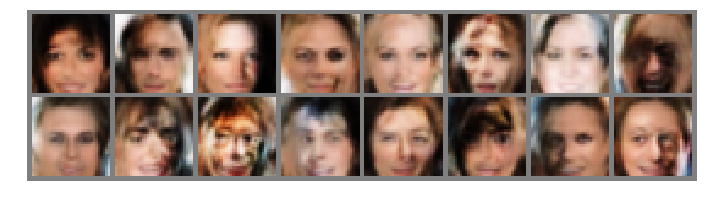

Epoch [   18/  150] | d_loss: 1.0854 | g_loss: 1.0904
Epoch [   18/  150] | d_loss: 1.2161 | g_loss: 1.1061
Epoch [   18/  150] | d_loss: 0.8887 | g_loss: 1.3181
Epoch [   18/  150] | d_loss: 0.8758 | g_loss: 1.4672
Epoch [   18/  150] | d_loss: 0.9817 | g_loss: 1.4166
Epoch [   18/  150] | d_loss: 0.9806 | g_loss: 1.1895
Epoch [   18/  150] | d_loss: 0.8307 | g_loss: 1.2542
Epoch [   18/  150] | d_loss: 0.9978 | g_loss: 1.8989
Epoch [   18/  150] | d_loss: 1.2985 | g_loss: 1.3179
Epoch [   18/  150] | d_loss: 0.7531 | g_loss: 1.3016
Epoch [   18/  150] | d_loss: 0.9660 | g_loss: 1.1978
Epoch [   18/  150] | d_loss: 1.1879 | g_loss: 1.3141
Epoch [   18/  150] | d_loss: 0.9559 | g_loss: 1.3691
Epoch [   18/  150] | d_loss: 1.1871 | g_loss: 1.5294
Epoch [   18/  150] | d_loss: 0.8898 | g_loss: 1.2238


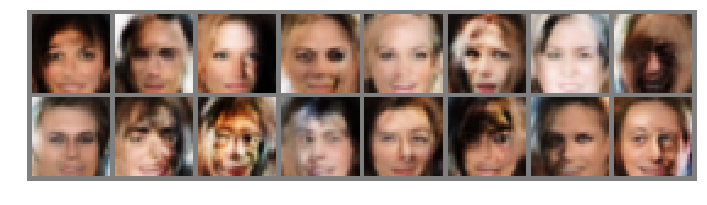

Epoch [   19/  150] | d_loss: 1.1815 | g_loss: 0.9121
Epoch [   19/  150] | d_loss: 1.2680 | g_loss: 1.6227
Epoch [   19/  150] | d_loss: 1.0025 | g_loss: 1.5673
Epoch [   19/  150] | d_loss: 1.1028 | g_loss: 1.7726
Epoch [   19/  150] | d_loss: 0.8089 | g_loss: 1.3845
Epoch [   19/  150] | d_loss: 1.1592 | g_loss: 1.6764
Epoch [   19/  150] | d_loss: 0.9636 | g_loss: 1.8485
Epoch [   19/  150] | d_loss: 0.9514 | g_loss: 1.2508
Epoch [   19/  150] | d_loss: 0.9308 | g_loss: 1.4069
Epoch [   19/  150] | d_loss: 1.0081 | g_loss: 1.1412
Epoch [   19/  150] | d_loss: 1.1075 | g_loss: 1.3499
Epoch [   19/  150] | d_loss: 1.0471 | g_loss: 1.0868
Epoch [   19/  150] | d_loss: 1.2593 | g_loss: 1.3103
Epoch [   19/  150] | d_loss: 1.2417 | g_loss: 1.5796
Epoch [   19/  150] | d_loss: 0.9036 | g_loss: 1.1216


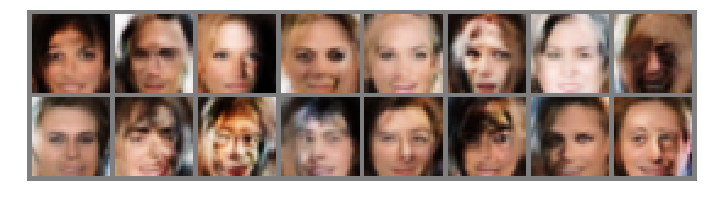

Epoch [   20/  150] | d_loss: 1.1674 | g_loss: 1.2962
Epoch [   20/  150] | d_loss: 0.9529 | g_loss: 1.5450
Epoch [   20/  150] | d_loss: 0.9411 | g_loss: 1.4324
Epoch [   20/  150] | d_loss: 1.2655 | g_loss: 1.0100
Epoch [   20/  150] | d_loss: 0.9303 | g_loss: 1.3865
Epoch [   20/  150] | d_loss: 0.9693 | g_loss: 1.2976
Epoch [   20/  150] | d_loss: 1.2905 | g_loss: 1.5293
Epoch [   20/  150] | d_loss: 0.8774 | g_loss: 1.5125
Epoch [   20/  150] | d_loss: 0.8498 | g_loss: 1.1669
Epoch [   20/  150] | d_loss: 0.9717 | g_loss: 1.4816
Epoch [   20/  150] | d_loss: 0.9378 | g_loss: 1.2113
Epoch [   20/  150] | d_loss: 1.2519 | g_loss: 1.2539
Epoch [   20/  150] | d_loss: 0.9353 | g_loss: 1.7089
Epoch [   20/  150] | d_loss: 0.9123 | g_loss: 1.0149
Epoch [   20/  150] | d_loss: 0.9158 | g_loss: 1.1969


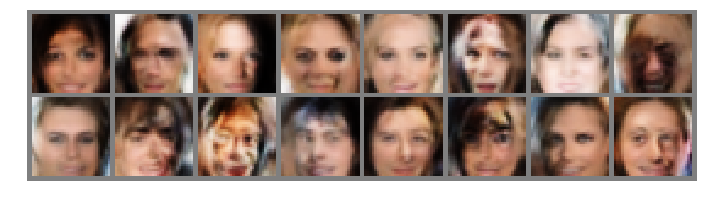

Epoch [   21/  150] | d_loss: 1.0596 | g_loss: 1.7369
Epoch [   21/  150] | d_loss: 0.9905 | g_loss: 1.6088
Epoch [   21/  150] | d_loss: 0.9457 | g_loss: 1.2990
Epoch [   21/  150] | d_loss: 0.8259 | g_loss: 1.5118
Epoch [   21/  150] | d_loss: 1.2010 | g_loss: 1.3160
Epoch [   21/  150] | d_loss: 0.9878 | g_loss: 1.4377
Epoch [   21/  150] | d_loss: 0.9609 | g_loss: 1.1226
Epoch [   21/  150] | d_loss: 1.1142 | g_loss: 1.1751
Epoch [   21/  150] | d_loss: 1.1335 | g_loss: 1.1768
Epoch [   21/  150] | d_loss: 1.1522 | g_loss: 1.3487
Epoch [   21/  150] | d_loss: 1.0582 | g_loss: 1.3042
Epoch [   21/  150] | d_loss: 1.0846 | g_loss: 1.5746
Epoch [   21/  150] | d_loss: 1.0604 | g_loss: 1.4309
Epoch [   21/  150] | d_loss: 1.1121 | g_loss: 1.2992
Epoch [   21/  150] | d_loss: 1.1459 | g_loss: 0.7761


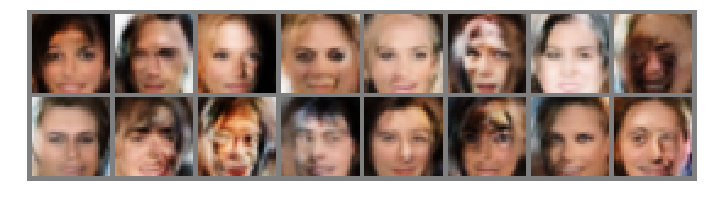

Epoch [   22/  150] | d_loss: 0.8250 | g_loss: 1.2225
Epoch [   22/  150] | d_loss: 1.1265 | g_loss: 1.6088
Epoch [   22/  150] | d_loss: 1.1117 | g_loss: 1.3440
Epoch [   22/  150] | d_loss: 1.0140 | g_loss: 0.8276
Epoch [   22/  150] | d_loss: 0.7924 | g_loss: 0.9631
Epoch [   22/  150] | d_loss: 1.1183 | g_loss: 1.3424
Epoch [   22/  150] | d_loss: 1.0351 | g_loss: 1.1954
Epoch [   22/  150] | d_loss: 0.8530 | g_loss: 1.3571
Epoch [   22/  150] | d_loss: 1.0977 | g_loss: 1.5425
Epoch [   22/  150] | d_loss: 0.7191 | g_loss: 1.2374
Epoch [   22/  150] | d_loss: 0.9129 | g_loss: 1.9310
Epoch [   22/  150] | d_loss: 0.9852 | g_loss: 1.1324
Epoch [   22/  150] | d_loss: 0.9742 | g_loss: 1.1350
Epoch [   22/  150] | d_loss: 1.0742 | g_loss: 1.6869
Epoch [   22/  150] | d_loss: 1.1812 | g_loss: 1.0561


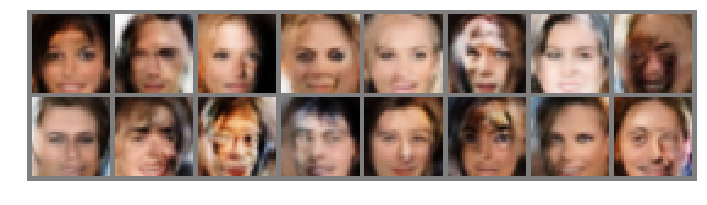

Epoch [   23/  150] | d_loss: 1.1929 | g_loss: 1.5775
Epoch [   23/  150] | d_loss: 0.9957 | g_loss: 1.4098
Epoch [   23/  150] | d_loss: 1.1239 | g_loss: 1.2145
Epoch [   23/  150] | d_loss: 1.0718 | g_loss: 1.0952
Epoch [   23/  150] | d_loss: 0.7020 | g_loss: 1.0127
Epoch [   23/  150] | d_loss: 1.1227 | g_loss: 1.0536
Epoch [   23/  150] | d_loss: 0.9680 | g_loss: 1.5657
Epoch [   23/  150] | d_loss: 0.8974 | g_loss: 1.4295
Epoch [   23/  150] | d_loss: 0.9918 | g_loss: 1.2800
Epoch [   23/  150] | d_loss: 0.8421 | g_loss: 1.0723
Epoch [   23/  150] | d_loss: 0.9555 | g_loss: 1.3706
Epoch [   23/  150] | d_loss: 0.9439 | g_loss: 1.1638
Epoch [   23/  150] | d_loss: 1.1193 | g_loss: 1.1121
Epoch [   23/  150] | d_loss: 0.7498 | g_loss: 1.4234
Epoch [   23/  150] | d_loss: 0.7763 | g_loss: 1.2570


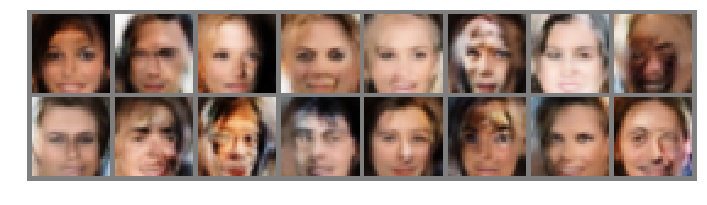

Epoch [   24/  150] | d_loss: 1.1677 | g_loss: 1.2284
Epoch [   24/  150] | d_loss: 0.9576 | g_loss: 1.5270
Epoch [   24/  150] | d_loss: 0.9634 | g_loss: 1.5487
Epoch [   24/  150] | d_loss: 1.3651 | g_loss: 1.6283
Epoch [   24/  150] | d_loss: 0.7635 | g_loss: 1.4187
Epoch [   24/  150] | d_loss: 0.8643 | g_loss: 1.2890
Epoch [   24/  150] | d_loss: 0.8912 | g_loss: 1.8060
Epoch [   24/  150] | d_loss: 1.0613 | g_loss: 1.2913
Epoch [   24/  150] | d_loss: 1.0515 | g_loss: 1.0919
Epoch [   24/  150] | d_loss: 0.9679 | g_loss: 1.5515
Epoch [   24/  150] | d_loss: 0.9666 | g_loss: 1.4453
Epoch [   24/  150] | d_loss: 0.9409 | g_loss: 1.3178
Epoch [   24/  150] | d_loss: 1.0825 | g_loss: 0.9825
Epoch [   24/  150] | d_loss: 0.9236 | g_loss: 1.4093
Epoch [   24/  150] | d_loss: 0.9025 | g_loss: 1.1015


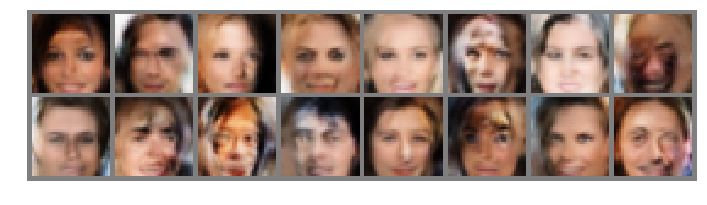

Epoch [   25/  150] | d_loss: 0.9488 | g_loss: 1.4606
Epoch [   25/  150] | d_loss: 0.8060 | g_loss: 1.2965
Epoch [   25/  150] | d_loss: 1.0400 | g_loss: 1.2719
Epoch [   25/  150] | d_loss: 1.2398 | g_loss: 1.0538
Epoch [   25/  150] | d_loss: 1.0651 | g_loss: 1.4488
Epoch [   25/  150] | d_loss: 1.0521 | g_loss: 1.2735
Epoch [   25/  150] | d_loss: 1.0733 | g_loss: 1.0251
Epoch [   25/  150] | d_loss: 0.8694 | g_loss: 1.5302
Epoch [   25/  150] | d_loss: 0.7133 | g_loss: 2.5921
Epoch [   25/  150] | d_loss: 1.0197 | g_loss: 0.8286
Epoch [   25/  150] | d_loss: 1.1538 | g_loss: 1.3735
Epoch [   25/  150] | d_loss: 1.1102 | g_loss: 1.3632
Epoch [   25/  150] | d_loss: 0.8602 | g_loss: 1.1414
Epoch [   25/  150] | d_loss: 0.8934 | g_loss: 1.7081
Epoch [   25/  150] | d_loss: 1.2305 | g_loss: 1.5018


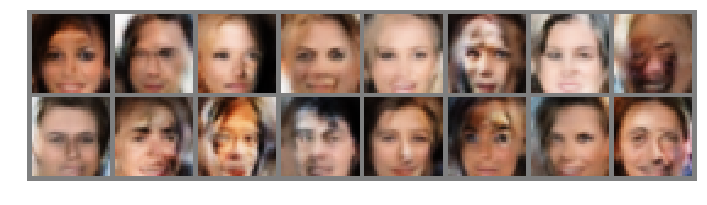

Epoch [   26/  150] | d_loss: 0.8808 | g_loss: 1.4723
Epoch [   26/  150] | d_loss: 0.9847 | g_loss: 1.2402
Epoch [   26/  150] | d_loss: 0.8508 | g_loss: 1.1973
Epoch [   26/  150] | d_loss: 1.2342 | g_loss: 1.3987
Epoch [   26/  150] | d_loss: 1.2474 | g_loss: 1.5823
Epoch [   26/  150] | d_loss: 1.0501 | g_loss: 1.3380
Epoch [   26/  150] | d_loss: 1.1761 | g_loss: 1.2013
Epoch [   26/  150] | d_loss: 1.0887 | g_loss: 1.4960
Epoch [   26/  150] | d_loss: 1.1719 | g_loss: 1.1800
Epoch [   26/  150] | d_loss: 1.1102 | g_loss: 1.3702
Epoch [   26/  150] | d_loss: 1.2041 | g_loss: 1.3565
Epoch [   26/  150] | d_loss: 0.7970 | g_loss: 1.2566
Epoch [   26/  150] | d_loss: 0.9445 | g_loss: 1.6831
Epoch [   26/  150] | d_loss: 0.9717 | g_loss: 1.4192
Epoch [   26/  150] | d_loss: 0.9891 | g_loss: 1.4361


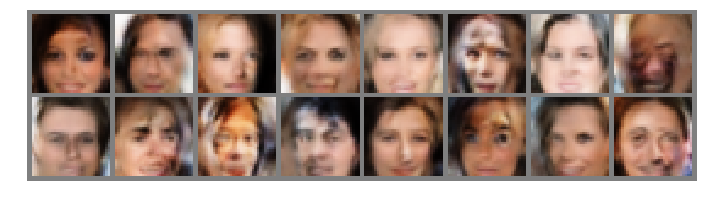

Epoch [   27/  150] | d_loss: 0.9789 | g_loss: 1.1458
Epoch [   27/  150] | d_loss: 0.7931 | g_loss: 1.3117
Epoch [   27/  150] | d_loss: 0.8644 | g_loss: 1.4300
Epoch [   27/  150] | d_loss: 0.7526 | g_loss: 1.0665
Epoch [   27/  150] | d_loss: 0.8787 | g_loss: 1.4465
Epoch [   27/  150] | d_loss: 1.0349 | g_loss: 1.1156
Epoch [   27/  150] | d_loss: 0.9833 | g_loss: 1.6030
Epoch [   27/  150] | d_loss: 0.9770 | g_loss: 1.5249
Epoch [   27/  150] | d_loss: 0.8855 | g_loss: 1.4794
Epoch [   27/  150] | d_loss: 1.0445 | g_loss: 1.2486
Epoch [   27/  150] | d_loss: 1.2875 | g_loss: 1.2364
Epoch [   27/  150] | d_loss: 1.2896 | g_loss: 1.2069
Epoch [   27/  150] | d_loss: 0.9617 | g_loss: 1.2457
Epoch [   27/  150] | d_loss: 1.2213 | g_loss: 1.0858
Epoch [   27/  150] | d_loss: 1.0057 | g_loss: 1.1477


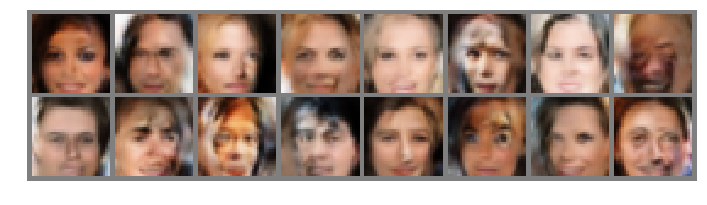

Epoch [   28/  150] | d_loss: 1.1307 | g_loss: 1.1092
Epoch [   28/  150] | d_loss: 1.1911 | g_loss: 1.1431
Epoch [   28/  150] | d_loss: 0.8939 | g_loss: 1.1514
Epoch [   28/  150] | d_loss: 0.7227 | g_loss: 1.7886
Epoch [   28/  150] | d_loss: 1.1638 | g_loss: 1.5480
Epoch [   28/  150] | d_loss: 0.9368 | g_loss: 0.8706
Epoch [   28/  150] | d_loss: 0.8867 | g_loss: 0.9037
Epoch [   28/  150] | d_loss: 0.9966 | g_loss: 1.5129
Epoch [   28/  150] | d_loss: 0.7598 | g_loss: 1.5170
Epoch [   28/  150] | d_loss: 0.8135 | g_loss: 1.2546
Epoch [   28/  150] | d_loss: 0.9382 | g_loss: 1.0716
Epoch [   28/  150] | d_loss: 0.9285 | g_loss: 1.4731
Epoch [   28/  150] | d_loss: 0.7970 | g_loss: 1.0105
Epoch [   28/  150] | d_loss: 0.7574 | g_loss: 1.3451
Epoch [   28/  150] | d_loss: 0.8404 | g_loss: 1.3186


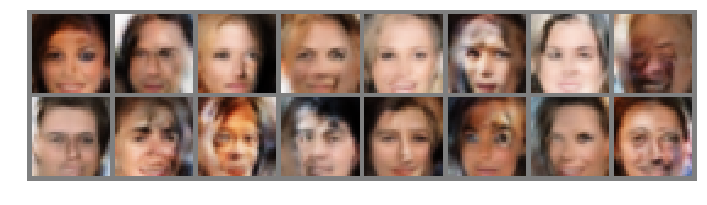

Epoch [   29/  150] | d_loss: 0.7430 | g_loss: 1.1918
Epoch [   29/  150] | d_loss: 0.9161 | g_loss: 1.3392
Epoch [   29/  150] | d_loss: 0.9419 | g_loss: 1.6561
Epoch [   29/  150] | d_loss: 0.7843 | g_loss: 1.2100
Epoch [   29/  150] | d_loss: 0.8989 | g_loss: 1.3623
Epoch [   29/  150] | d_loss: 0.9551 | g_loss: 1.2518
Epoch [   29/  150] | d_loss: 1.0590 | g_loss: 0.8533
Epoch [   29/  150] | d_loss: 0.8739 | g_loss: 1.1954
Epoch [   29/  150] | d_loss: 1.0205 | g_loss: 0.9221
Epoch [   29/  150] | d_loss: 0.8908 | g_loss: 1.0452
Epoch [   29/  150] | d_loss: 1.0297 | g_loss: 1.8436
Epoch [   29/  150] | d_loss: 0.9876 | g_loss: 1.5402
Epoch [   29/  150] | d_loss: 1.1940 | g_loss: 1.0720
Epoch [   29/  150] | d_loss: 1.0535 | g_loss: 1.2439
Epoch [   29/  150] | d_loss: 0.8773 | g_loss: 1.3042


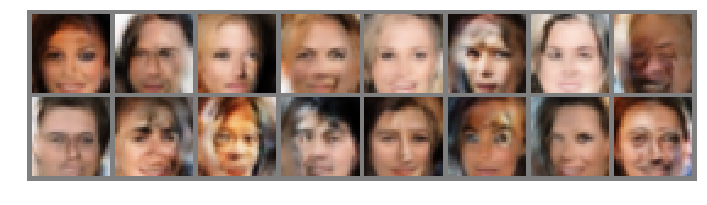

Epoch [   30/  150] | d_loss: 1.0635 | g_loss: 1.9507
Epoch [   30/  150] | d_loss: 1.1780 | g_loss: 1.4534
Epoch [   30/  150] | d_loss: 0.8391 | g_loss: 1.1691
Epoch [   30/  150] | d_loss: 1.1108 | g_loss: 1.3786
Epoch [   30/  150] | d_loss: 1.3056 | g_loss: 1.3281
Epoch [   30/  150] | d_loss: 1.0980 | g_loss: 1.4072
Epoch [   30/  150] | d_loss: 0.9204 | g_loss: 1.7019
Epoch [   30/  150] | d_loss: 1.1112 | g_loss: 1.3587
Epoch [   30/  150] | d_loss: 0.9298 | g_loss: 1.4785
Epoch [   30/  150] | d_loss: 1.0665 | g_loss: 1.1468
Epoch [   30/  150] | d_loss: 0.9438 | g_loss: 1.5180
Epoch [   30/  150] | d_loss: 0.8856 | g_loss: 1.0307
Epoch [   30/  150] | d_loss: 0.9168 | g_loss: 1.0648
Epoch [   30/  150] | d_loss: 0.9188 | g_loss: 1.6003
Epoch [   30/  150] | d_loss: 0.8705 | g_loss: 1.2891


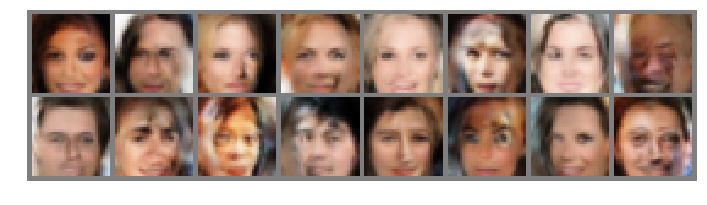

Epoch [   31/  150] | d_loss: 0.6873 | g_loss: 1.3575
Epoch [   31/  150] | d_loss: 1.2176 | g_loss: 1.6700
Epoch [   31/  150] | d_loss: 1.1127 | g_loss: 1.3068
Epoch [   31/  150] | d_loss: 0.9493 | g_loss: 1.1527
Epoch [   31/  150] | d_loss: 0.8977 | g_loss: 1.0038
Epoch [   31/  150] | d_loss: 0.9556 | g_loss: 1.4603
Epoch [   31/  150] | d_loss: 0.8495 | g_loss: 1.3426
Epoch [   31/  150] | d_loss: 0.7704 | g_loss: 1.5321
Epoch [   31/  150] | d_loss: 0.9536 | g_loss: 1.0708
Epoch [   31/  150] | d_loss: 1.1332 | g_loss: 1.2006
Epoch [   31/  150] | d_loss: 0.9017 | g_loss: 1.5780
Epoch [   31/  150] | d_loss: 1.0160 | g_loss: 1.1492
Epoch [   31/  150] | d_loss: 0.8262 | g_loss: 1.5064
Epoch [   31/  150] | d_loss: 1.0290 | g_loss: 1.5279
Epoch [   31/  150] | d_loss: 0.8963 | g_loss: 1.9079


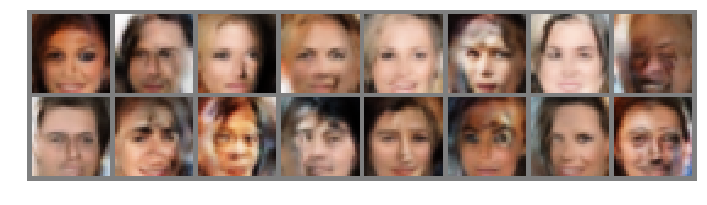

Epoch [   32/  150] | d_loss: 1.0820 | g_loss: 1.2395
Epoch [   32/  150] | d_loss: 1.0438 | g_loss: 1.1326
Epoch [   32/  150] | d_loss: 0.8423 | g_loss: 1.4120
Epoch [   32/  150] | d_loss: 0.8927 | g_loss: 1.3935
Epoch [   32/  150] | d_loss: 1.1340 | g_loss: 1.0450
Epoch [   32/  150] | d_loss: 1.0918 | g_loss: 1.5143
Epoch [   32/  150] | d_loss: 0.7685 | g_loss: 1.3310
Epoch [   32/  150] | d_loss: 0.9209 | g_loss: 1.3045
Epoch [   32/  150] | d_loss: 0.8895 | g_loss: 1.1877
Epoch [   32/  150] | d_loss: 0.6961 | g_loss: 1.5672
Epoch [   32/  150] | d_loss: 1.2094 | g_loss: 1.4715
Epoch [   32/  150] | d_loss: 0.8981 | g_loss: 1.6109
Epoch [   32/  150] | d_loss: 0.8100 | g_loss: 1.4113
Epoch [   32/  150] | d_loss: 0.9478 | g_loss: 1.0519
Epoch [   32/  150] | d_loss: 0.8930 | g_loss: 0.8099


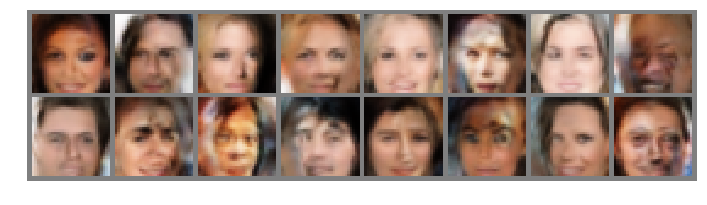

Epoch [   33/  150] | d_loss: 0.9902 | g_loss: 1.5847
Epoch [   33/  150] | d_loss: 0.8239 | g_loss: 1.3342
Epoch [   33/  150] | d_loss: 1.0710 | g_loss: 1.1415
Epoch [   33/  150] | d_loss: 0.7771 | g_loss: 1.8204
Epoch [   33/  150] | d_loss: 1.0119 | g_loss: 0.9530
Epoch [   33/  150] | d_loss: 1.4946 | g_loss: 1.2547
Epoch [   33/  150] | d_loss: 0.9144 | g_loss: 1.6647
Epoch [   33/  150] | d_loss: 0.8166 | g_loss: 1.6397
Epoch [   33/  150] | d_loss: 1.1043 | g_loss: 1.0358
Epoch [   33/  150] | d_loss: 1.0867 | g_loss: 0.8202
Epoch [   33/  150] | d_loss: 0.8693 | g_loss: 1.5215
Epoch [   33/  150] | d_loss: 0.7695 | g_loss: 1.3493
Epoch [   33/  150] | d_loss: 0.9929 | g_loss: 1.6015
Epoch [   33/  150] | d_loss: 0.9101 | g_loss: 1.2281
Epoch [   33/  150] | d_loss: 0.9351 | g_loss: 1.5404


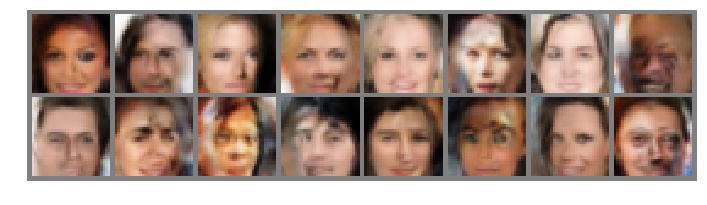

Epoch [   34/  150] | d_loss: 0.9818 | g_loss: 1.4121
Epoch [   34/  150] | d_loss: 0.8367 | g_loss: 1.1248
Epoch [   34/  150] | d_loss: 1.0313 | g_loss: 1.3573
Epoch [   34/  150] | d_loss: 0.9333 | g_loss: 1.1603
Epoch [   34/  150] | d_loss: 0.7592 | g_loss: 1.5366
Epoch [   34/  150] | d_loss: 1.0081 | g_loss: 1.4590
Epoch [   34/  150] | d_loss: 1.0918 | g_loss: 1.4086
Epoch [   34/  150] | d_loss: 1.0715 | g_loss: 0.8163
Epoch [   34/  150] | d_loss: 1.2019 | g_loss: 1.3958
Epoch [   34/  150] | d_loss: 0.8360 | g_loss: 1.0338
Epoch [   34/  150] | d_loss: 0.6469 | g_loss: 0.9858
Epoch [   34/  150] | d_loss: 0.9412 | g_loss: 1.5125
Epoch [   34/  150] | d_loss: 1.0933 | g_loss: 1.3675
Epoch [   34/  150] | d_loss: 0.9742 | g_loss: 1.2725
Epoch [   34/  150] | d_loss: 0.8838 | g_loss: 1.1056


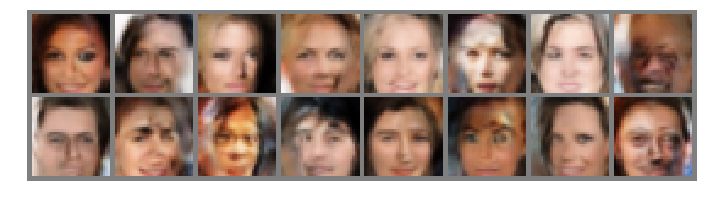

Epoch [   35/  150] | d_loss: 0.7321 | g_loss: 1.7950
Epoch [   35/  150] | d_loss: 1.1491 | g_loss: 1.1447
Epoch [   35/  150] | d_loss: 0.7269 | g_loss: 1.7248
Epoch [   35/  150] | d_loss: 0.6632 | g_loss: 1.3307
Epoch [   35/  150] | d_loss: 0.9305 | g_loss: 1.2389
Epoch [   35/  150] | d_loss: 1.1306 | g_loss: 1.4832
Epoch [   35/  150] | d_loss: 1.3135 | g_loss: 1.4258
Epoch [   35/  150] | d_loss: 0.8458 | g_loss: 1.3251
Epoch [   35/  150] | d_loss: 0.9904 | g_loss: 1.1483
Epoch [   35/  150] | d_loss: 1.2077 | g_loss: 1.7136
Epoch [   35/  150] | d_loss: 1.1810 | g_loss: 1.4581
Epoch [   35/  150] | d_loss: 0.7920 | g_loss: 1.2768
Epoch [   35/  150] | d_loss: 0.6892 | g_loss: 2.0510
Epoch [   35/  150] | d_loss: 0.7987 | g_loss: 1.0373
Epoch [   35/  150] | d_loss: 0.9387 | g_loss: 1.5755


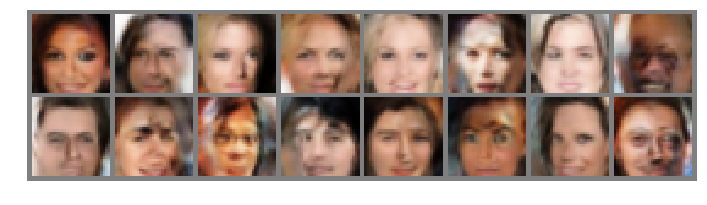

Epoch [   36/  150] | d_loss: 0.9150 | g_loss: 1.6719
Epoch [   36/  150] | d_loss: 1.0659 | g_loss: 1.7126
Epoch [   36/  150] | d_loss: 0.8115 | g_loss: 1.2380
Epoch [   36/  150] | d_loss: 0.6032 | g_loss: 1.4467
Epoch [   36/  150] | d_loss: 0.8328 | g_loss: 1.6370
Epoch [   36/  150] | d_loss: 0.6486 | g_loss: 0.8191
Epoch [   36/  150] | d_loss: 0.7221 | g_loss: 1.1284
Epoch [   36/  150] | d_loss: 1.1139 | g_loss: 0.9751
Epoch [   36/  150] | d_loss: 0.8434 | g_loss: 1.4430
Epoch [   36/  150] | d_loss: 0.9803 | g_loss: 1.0777
Epoch [   36/  150] | d_loss: 0.6219 | g_loss: 1.5035
Epoch [   36/  150] | d_loss: 0.8945 | g_loss: 1.1917
Epoch [   36/  150] | d_loss: 1.1630 | g_loss: 1.5502
Epoch [   36/  150] | d_loss: 0.7839 | g_loss: 1.0144
Epoch [   36/  150] | d_loss: 0.9756 | g_loss: 0.9516


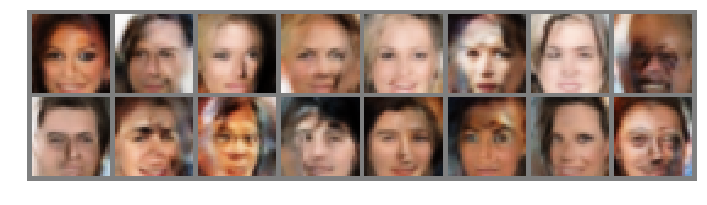

Epoch [   37/  150] | d_loss: 0.8095 | g_loss: 1.8839
Epoch [   37/  150] | d_loss: 0.9907 | g_loss: 1.2901
Epoch [   37/  150] | d_loss: 1.0018 | g_loss: 1.0496
Epoch [   37/  150] | d_loss: 0.8158 | g_loss: 1.2404
Epoch [   37/  150] | d_loss: 0.9386 | g_loss: 1.7243
Epoch [   37/  150] | d_loss: 1.2059 | g_loss: 1.4445
Epoch [   37/  150] | d_loss: 0.9220 | g_loss: 1.3641
Epoch [   37/  150] | d_loss: 0.7107 | g_loss: 1.8453
Epoch [   37/  150] | d_loss: 0.6844 | g_loss: 1.6619
Epoch [   37/  150] | d_loss: 0.7557 | g_loss: 1.4157
Epoch [   37/  150] | d_loss: 0.9462 | g_loss: 1.2533
Epoch [   37/  150] | d_loss: 0.6931 | g_loss: 1.2789
Epoch [   37/  150] | d_loss: 1.1006 | g_loss: 1.8477
Epoch [   37/  150] | d_loss: 1.1019 | g_loss: 1.2964
Epoch [   37/  150] | d_loss: 1.1242 | g_loss: 1.1982


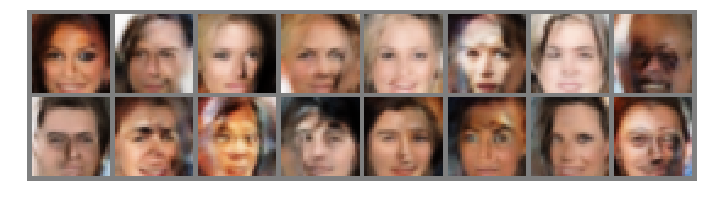

Epoch [   38/  150] | d_loss: 0.7621 | g_loss: 1.0154
Epoch [   38/  150] | d_loss: 0.6520 | g_loss: 1.6799
Epoch [   38/  150] | d_loss: 0.9643 | g_loss: 1.3923
Epoch [   38/  150] | d_loss: 0.8786 | g_loss: 1.8008
Epoch [   38/  150] | d_loss: 0.8467 | g_loss: 1.3667
Epoch [   38/  150] | d_loss: 0.9328 | g_loss: 1.5051
Epoch [   38/  150] | d_loss: 0.6934 | g_loss: 1.3813
Epoch [   38/  150] | d_loss: 0.7485 | g_loss: 1.3572
Epoch [   38/  150] | d_loss: 1.2804 | g_loss: 1.2496
Epoch [   38/  150] | d_loss: 0.8168 | g_loss: 1.4721
Epoch [   38/  150] | d_loss: 1.1784 | g_loss: 1.3525
Epoch [   38/  150] | d_loss: 0.8425 | g_loss: 1.4349
Epoch [   38/  150] | d_loss: 0.7397 | g_loss: 1.3353
Epoch [   38/  150] | d_loss: 1.0465 | g_loss: 1.2375
Epoch [   38/  150] | d_loss: 0.6913 | g_loss: 1.1667


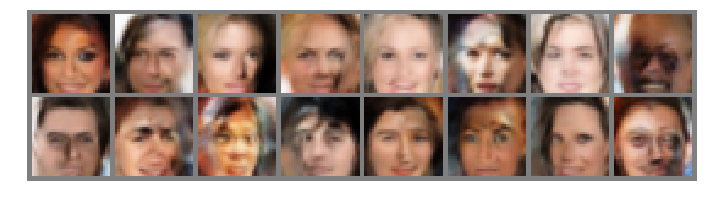

Epoch [   39/  150] | d_loss: 1.4553 | g_loss: 1.1977
Epoch [   39/  150] | d_loss: 1.0382 | g_loss: 1.1506
Epoch [   39/  150] | d_loss: 1.0816 | g_loss: 1.2712
Epoch [   39/  150] | d_loss: 0.9447 | g_loss: 1.3957
Epoch [   39/  150] | d_loss: 0.8428 | g_loss: 1.1065
Epoch [   39/  150] | d_loss: 0.8328 | g_loss: 1.9551
Epoch [   39/  150] | d_loss: 0.8477 | g_loss: 1.8718
Epoch [   39/  150] | d_loss: 0.6035 | g_loss: 2.1461
Epoch [   39/  150] | d_loss: 1.1595 | g_loss: 2.0624
Epoch [   39/  150] | d_loss: 0.5942 | g_loss: 1.4500
Epoch [   39/  150] | d_loss: 0.8054 | g_loss: 1.4175
Epoch [   39/  150] | d_loss: 0.8146 | g_loss: 1.4618
Epoch [   39/  150] | d_loss: 0.9164 | g_loss: 1.2896
Epoch [   39/  150] | d_loss: 0.7708 | g_loss: 1.5699
Epoch [   39/  150] | d_loss: 0.8525 | g_loss: 1.4133


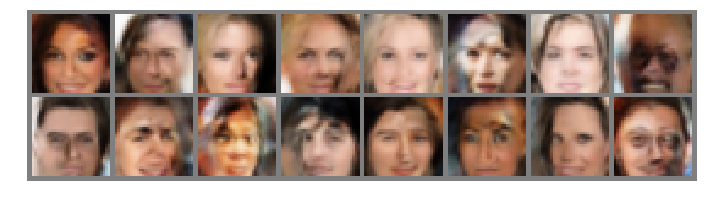

Epoch [   40/  150] | d_loss: 1.1819 | g_loss: 1.2672
Epoch [   40/  150] | d_loss: 0.7272 | g_loss: 0.7995
Epoch [   40/  150] | d_loss: 0.9647 | g_loss: 1.3160
Epoch [   40/  150] | d_loss: 0.9436 | g_loss: 1.2300
Epoch [   40/  150] | d_loss: 0.8201 | g_loss: 1.7806
Epoch [   40/  150] | d_loss: 1.0185 | g_loss: 1.3520
Epoch [   40/  150] | d_loss: 0.8753 | g_loss: 0.8747
Epoch [   40/  150] | d_loss: 0.9736 | g_loss: 1.1471
Epoch [   40/  150] | d_loss: 0.8716 | g_loss: 1.6762
Epoch [   40/  150] | d_loss: 0.9908 | g_loss: 1.6884
Epoch [   40/  150] | d_loss: 1.1544 | g_loss: 1.3322
Epoch [   40/  150] | d_loss: 0.9719 | g_loss: 1.3555
Epoch [   40/  150] | d_loss: 0.7893 | g_loss: 1.2005
Epoch [   40/  150] | d_loss: 1.1397 | g_loss: 1.2649
Epoch [   40/  150] | d_loss: 0.6186 | g_loss: 1.5903


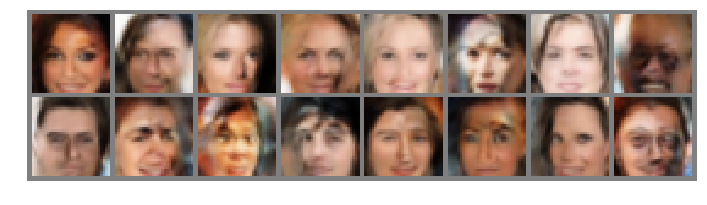

Epoch [   41/  150] | d_loss: 0.6653 | g_loss: 1.5765
Epoch [   41/  150] | d_loss: 0.8503 | g_loss: 1.9662
Epoch [   41/  150] | d_loss: 0.9404 | g_loss: 1.4163
Epoch [   41/  150] | d_loss: 0.7926 | g_loss: 1.5430
Epoch [   41/  150] | d_loss: 0.6929 | g_loss: 1.1560
Epoch [   41/  150] | d_loss: 0.8140 | g_loss: 1.6476
Epoch [   41/  150] | d_loss: 0.8551 | g_loss: 1.4536
Epoch [   41/  150] | d_loss: 1.1463 | g_loss: 2.0850
Epoch [   41/  150] | d_loss: 0.7219 | g_loss: 1.7356
Epoch [   41/  150] | d_loss: 0.8733 | g_loss: 1.5682
Epoch [   41/  150] | d_loss: 0.9705 | g_loss: 1.4445
Epoch [   41/  150] | d_loss: 0.9662 | g_loss: 1.9353
Epoch [   41/  150] | d_loss: 0.5893 | g_loss: 1.5537
Epoch [   41/  150] | d_loss: 0.8035 | g_loss: 1.1179
Epoch [   41/  150] | d_loss: 1.1548 | g_loss: 2.0559


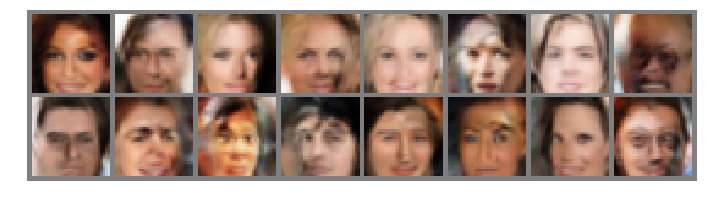

Epoch [   42/  150] | d_loss: 0.8335 | g_loss: 0.8734
Epoch [   42/  150] | d_loss: 1.1098 | g_loss: 1.9545
Epoch [   42/  150] | d_loss: 1.1338 | g_loss: 1.1295
Epoch [   42/  150] | d_loss: 0.9585 | g_loss: 1.1319
Epoch [   42/  150] | d_loss: 0.7029 | g_loss: 1.6285
Epoch [   42/  150] | d_loss: 0.7829 | g_loss: 1.2149
Epoch [   42/  150] | d_loss: 0.9104 | g_loss: 1.6750
Epoch [   42/  150] | d_loss: 0.8193 | g_loss: 1.5573
Epoch [   42/  150] | d_loss: 0.7193 | g_loss: 1.6121
Epoch [   42/  150] | d_loss: 0.9017 | g_loss: 1.7131
Epoch [   42/  150] | d_loss: 0.8185 | g_loss: 1.4284
Epoch [   42/  150] | d_loss: 1.0597 | g_loss: 1.7368
Epoch [   42/  150] | d_loss: 0.7247 | g_loss: 1.0327
Epoch [   42/  150] | d_loss: 0.9569 | g_loss: 0.9851
Epoch [   42/  150] | d_loss: 0.8177 | g_loss: 1.6729


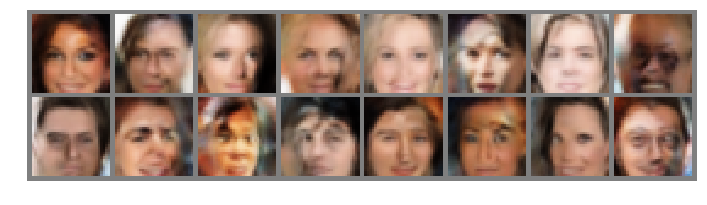

Epoch [   43/  150] | d_loss: 0.9964 | g_loss: 1.7500
Epoch [   43/  150] | d_loss: 0.8081 | g_loss: 1.3949
Epoch [   43/  150] | d_loss: 0.9051 | g_loss: 1.8044
Epoch [   43/  150] | d_loss: 0.9830 | g_loss: 2.0281
Epoch [   43/  150] | d_loss: 1.1378 | g_loss: 1.5715
Epoch [   43/  150] | d_loss: 0.8319 | g_loss: 2.2139
Epoch [   43/  150] | d_loss: 0.6852 | g_loss: 2.3993
Epoch [   43/  150] | d_loss: 0.9633 | g_loss: 1.4364
Epoch [   43/  150] | d_loss: 0.9954 | g_loss: 1.5308
Epoch [   43/  150] | d_loss: 0.7848 | g_loss: 1.5441
Epoch [   43/  150] | d_loss: 0.8329 | g_loss: 1.5754
Epoch [   43/  150] | d_loss: 0.8848 | g_loss: 1.5278
Epoch [   43/  150] | d_loss: 0.6870 | g_loss: 1.2645
Epoch [   43/  150] | d_loss: 0.8281 | g_loss: 0.8859
Epoch [   43/  150] | d_loss: 0.9415 | g_loss: 1.4812


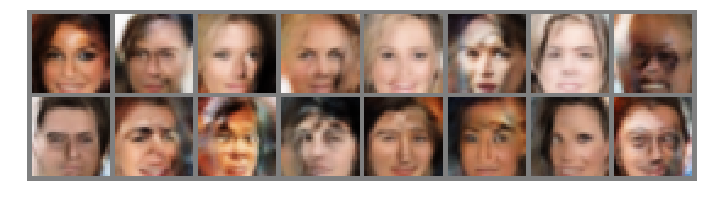

Epoch [   44/  150] | d_loss: 0.8886 | g_loss: 1.6673
Epoch [   44/  150] | d_loss: 1.2038 | g_loss: 1.1222
Epoch [   44/  150] | d_loss: 0.6500 | g_loss: 1.1376
Epoch [   44/  150] | d_loss: 0.7174 | g_loss: 1.2894
Epoch [   44/  150] | d_loss: 0.9215 | g_loss: 1.3858
Epoch [   44/  150] | d_loss: 1.0543 | g_loss: 1.6878
Epoch [   44/  150] | d_loss: 0.6501 | g_loss: 1.8281
Epoch [   44/  150] | d_loss: 1.0772 | g_loss: 1.6037
Epoch [   44/  150] | d_loss: 1.0013 | g_loss: 1.8324
Epoch [   44/  150] | d_loss: 0.9512 | g_loss: 1.2768
Epoch [   44/  150] | d_loss: 0.8668 | g_loss: 1.5603
Epoch [   44/  150] | d_loss: 0.6476 | g_loss: 1.0448
Epoch [   44/  150] | d_loss: 0.8096 | g_loss: 1.6492
Epoch [   44/  150] | d_loss: 0.7440 | g_loss: 1.8649
Epoch [   44/  150] | d_loss: 0.8733 | g_loss: 1.7034


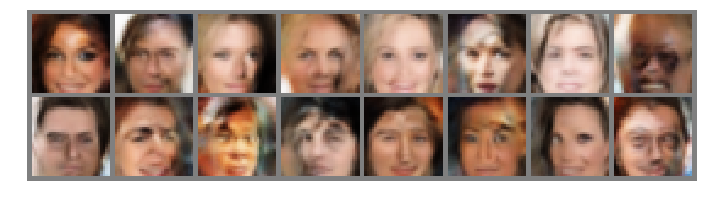

Epoch [   45/  150] | d_loss: 0.7902 | g_loss: 1.7105
Epoch [   45/  150] | d_loss: 0.6745 | g_loss: 1.7488
Epoch [   45/  150] | d_loss: 0.8051 | g_loss: 1.6334
Epoch [   45/  150] | d_loss: 0.9635 | g_loss: 1.1132
Epoch [   45/  150] | d_loss: 1.1108 | g_loss: 1.4729
Epoch [   45/  150] | d_loss: 0.9136 | g_loss: 1.3526
Epoch [   45/  150] | d_loss: 0.7522 | g_loss: 1.8489
Epoch [   45/  150] | d_loss: 0.7994 | g_loss: 2.5172
Epoch [   45/  150] | d_loss: 0.8610 | g_loss: 1.3211
Epoch [   45/  150] | d_loss: 0.8509 | g_loss: 1.2609
Epoch [   45/  150] | d_loss: 1.0947 | g_loss: 0.8643
Epoch [   45/  150] | d_loss: 0.9120 | g_loss: 1.2619
Epoch [   45/  150] | d_loss: 0.7595 | g_loss: 1.3937
Epoch [   45/  150] | d_loss: 1.1616 | g_loss: 1.0664
Epoch [   45/  150] | d_loss: 0.8073 | g_loss: 1.3283


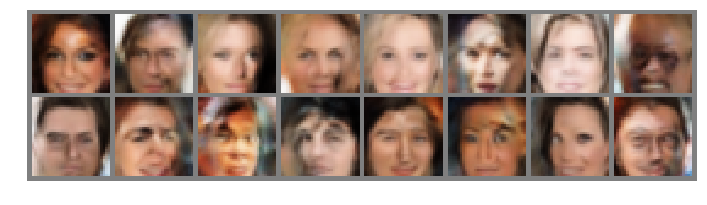

Epoch [   46/  150] | d_loss: 0.6438 | g_loss: 1.8342
Epoch [   46/  150] | d_loss: 1.1223 | g_loss: 1.1386
Epoch [   46/  150] | d_loss: 0.8348 | g_loss: 1.5502
Epoch [   46/  150] | d_loss: 0.8408 | g_loss: 1.7645
Epoch [   46/  150] | d_loss: 0.9414 | g_loss: 1.5230
Epoch [   46/  150] | d_loss: 0.5661 | g_loss: 1.5590
Epoch [   46/  150] | d_loss: 1.1306 | g_loss: 1.0091
Epoch [   46/  150] | d_loss: 0.8069 | g_loss: 1.3731
Epoch [   46/  150] | d_loss: 0.9593 | g_loss: 1.9860
Epoch [   46/  150] | d_loss: 0.8053 | g_loss: 1.4166
Epoch [   46/  150] | d_loss: 0.6448 | g_loss: 1.2355
Epoch [   46/  150] | d_loss: 0.8575 | g_loss: 1.2463
Epoch [   46/  150] | d_loss: 0.6939 | g_loss: 1.4134
Epoch [   46/  150] | d_loss: 0.8182 | g_loss: 1.0785
Epoch [   46/  150] | d_loss: 0.7971 | g_loss: 1.3797


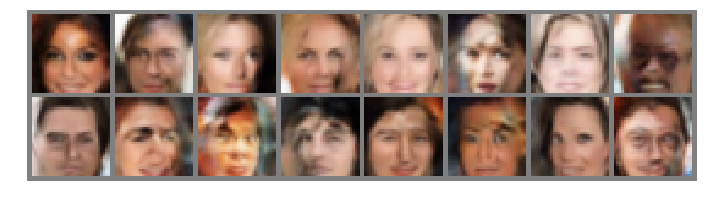

Epoch [   47/  150] | d_loss: 0.7637 | g_loss: 1.5245
Epoch [   47/  150] | d_loss: 1.1230 | g_loss: 1.7044
Epoch [   47/  150] | d_loss: 0.8528 | g_loss: 1.4556
Epoch [   47/  150] | d_loss: 0.6148 | g_loss: 1.4449
Epoch [   47/  150] | d_loss: 1.0829 | g_loss: 1.5404
Epoch [   47/  150] | d_loss: 0.5861 | g_loss: 1.4595
Epoch [   47/  150] | d_loss: 0.8546 | g_loss: 1.0196
Epoch [   47/  150] | d_loss: 0.7524 | g_loss: 1.9157
Epoch [   47/  150] | d_loss: 0.9447 | g_loss: 1.5574
Epoch [   47/  150] | d_loss: 0.7321 | g_loss: 1.5260
Epoch [   47/  150] | d_loss: 1.0216 | g_loss: 1.7450
Epoch [   47/  150] | d_loss: 0.6705 | g_loss: 0.9676
Epoch [   47/  150] | d_loss: 1.2877 | g_loss: 1.3885
Epoch [   47/  150] | d_loss: 0.7318 | g_loss: 1.5660
Epoch [   47/  150] | d_loss: 0.9786 | g_loss: 1.7246


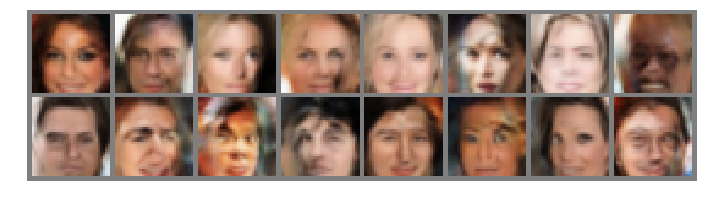

Epoch [   48/  150] | d_loss: 0.8547 | g_loss: 1.7026
Epoch [   48/  150] | d_loss: 0.6525 | g_loss: 1.6739
Epoch [   48/  150] | d_loss: 0.7716 | g_loss: 1.7859
Epoch [   48/  150] | d_loss: 0.7262 | g_loss: 1.6416
Epoch [   48/  150] | d_loss: 0.6888 | g_loss: 1.2621
Epoch [   48/  150] | d_loss: 0.9668 | g_loss: 1.9721
Epoch [   48/  150] | d_loss: 0.7618 | g_loss: 1.8330
Epoch [   48/  150] | d_loss: 0.6280 | g_loss: 1.4395
Epoch [   48/  150] | d_loss: 1.2221 | g_loss: 2.2206
Epoch [   48/  150] | d_loss: 0.5498 | g_loss: 1.5011
Epoch [   48/  150] | d_loss: 1.1209 | g_loss: 1.2911
Epoch [   48/  150] | d_loss: 0.9181 | g_loss: 1.6621
Epoch [   48/  150] | d_loss: 1.2178 | g_loss: 1.2005
Epoch [   48/  150] | d_loss: 0.6117 | g_loss: 1.1573
Epoch [   48/  150] | d_loss: 1.0952 | g_loss: 1.9243


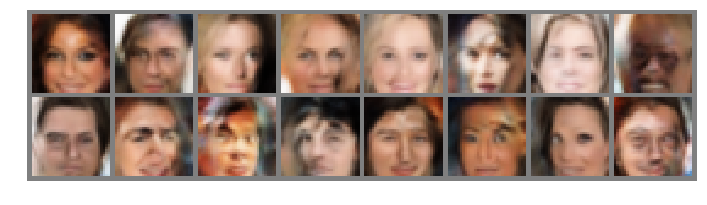

Epoch [   49/  150] | d_loss: 1.0844 | g_loss: 1.7005
Epoch [   49/  150] | d_loss: 0.7959 | g_loss: 1.3958
Epoch [   49/  150] | d_loss: 1.0649 | g_loss: 1.5508
Epoch [   49/  150] | d_loss: 0.8309 | g_loss: 1.6075
Epoch [   49/  150] | d_loss: 0.7490 | g_loss: 1.8632
Epoch [   49/  150] | d_loss: 0.6893 | g_loss: 1.5976
Epoch [   49/  150] | d_loss: 0.6841 | g_loss: 1.6830
Epoch [   49/  150] | d_loss: 0.8565 | g_loss: 1.4231
Epoch [   49/  150] | d_loss: 0.9015 | g_loss: 1.8612
Epoch [   49/  150] | d_loss: 0.9070 | g_loss: 1.5346
Epoch [   49/  150] | d_loss: 0.9658 | g_loss: 1.1990
Epoch [   49/  150] | d_loss: 0.9793 | g_loss: 2.0088
Epoch [   49/  150] | d_loss: 0.9866 | g_loss: 1.7876
Epoch [   49/  150] | d_loss: 1.2721 | g_loss: 0.6019
Epoch [   49/  150] | d_loss: 0.7553 | g_loss: 2.0093


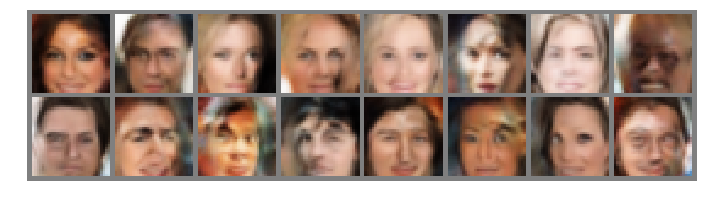

Epoch [   50/  150] | d_loss: 0.5088 | g_loss: 1.3194
Epoch [   50/  150] | d_loss: 0.9210 | g_loss: 1.4660
Epoch [   50/  150] | d_loss: 0.6409 | g_loss: 1.4295
Epoch [   50/  150] | d_loss: 0.8432 | g_loss: 1.5586
Epoch [   50/  150] | d_loss: 0.9014 | g_loss: 1.1301
Epoch [   50/  150] | d_loss: 0.7188 | g_loss: 1.8529
Epoch [   50/  150] | d_loss: 0.5549 | g_loss: 1.7291
Epoch [   50/  150] | d_loss: 0.7690 | g_loss: 1.7942
Epoch [   50/  150] | d_loss: 0.8008 | g_loss: 1.6400
Epoch [   50/  150] | d_loss: 0.7140 | g_loss: 1.4251
Epoch [   50/  150] | d_loss: 0.6355 | g_loss: 1.5033
Epoch [   50/  150] | d_loss: 0.8803 | g_loss: 2.1429
Epoch [   50/  150] | d_loss: 1.1828 | g_loss: 1.5917
Epoch [   50/  150] | d_loss: 0.7007 | g_loss: 1.4618
Epoch [   50/  150] | d_loss: 0.7729 | g_loss: 1.8950


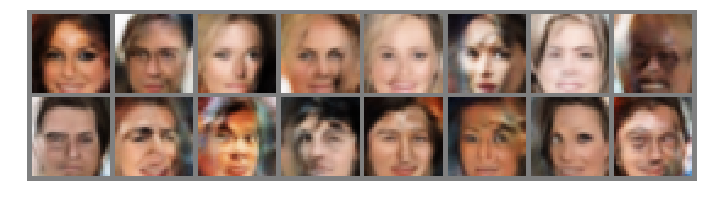

Epoch [   51/  150] | d_loss: 0.6113 | g_loss: 1.0784
Epoch [   51/  150] | d_loss: 0.8354 | g_loss: 2.0351
Epoch [   51/  150] | d_loss: 1.1133 | g_loss: 1.8101
Epoch [   51/  150] | d_loss: 0.5151 | g_loss: 1.4227
Epoch [   51/  150] | d_loss: 0.8095 | g_loss: 1.4522
Epoch [   51/  150] | d_loss: 0.5911 | g_loss: 1.7259
Epoch [   51/  150] | d_loss: 0.7063 | g_loss: 0.9887
Epoch [   51/  150] | d_loss: 0.6250 | g_loss: 1.1141
Epoch [   51/  150] | d_loss: 0.7900 | g_loss: 1.8785
Epoch [   51/  150] | d_loss: 0.8107 | g_loss: 1.1459
Epoch [   51/  150] | d_loss: 0.5766 | g_loss: 1.8602
Epoch [   51/  150] | d_loss: 1.2226 | g_loss: 1.1806
Epoch [   51/  150] | d_loss: 0.6496 | g_loss: 1.7475
Epoch [   51/  150] | d_loss: 0.7987 | g_loss: 1.7945
Epoch [   51/  150] | d_loss: 1.0727 | g_loss: 1.7844


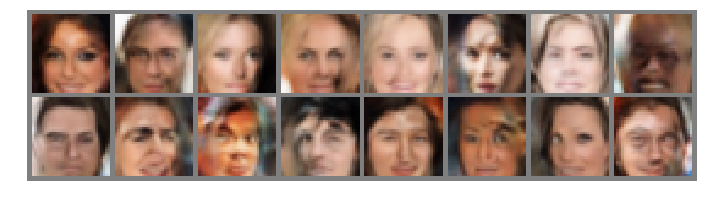

Epoch [   52/  150] | d_loss: 0.8544 | g_loss: 2.4150
Epoch [   52/  150] | d_loss: 0.8538 | g_loss: 1.8921
Epoch [   52/  150] | d_loss: 1.0962 | g_loss: 1.3916
Epoch [   52/  150] | d_loss: 0.6440 | g_loss: 1.6061
Epoch [   52/  150] | d_loss: 0.8310 | g_loss: 2.0074
Epoch [   52/  150] | d_loss: 1.0696 | g_loss: 0.9988
Epoch [   52/  150] | d_loss: 0.8282 | g_loss: 2.0030
Epoch [   52/  150] | d_loss: 0.6634 | g_loss: 1.5480
Epoch [   52/  150] | d_loss: 0.7347 | g_loss: 1.6233
Epoch [   52/  150] | d_loss: 1.0246 | g_loss: 0.9096
Epoch [   52/  150] | d_loss: 0.8928 | g_loss: 1.5729
Epoch [   52/  150] | d_loss: 0.8400 | g_loss: 1.9250
Epoch [   52/  150] | d_loss: 0.7483 | g_loss: 1.7652
Epoch [   52/  150] | d_loss: 0.8225 | g_loss: 2.2921
Epoch [   52/  150] | d_loss: 1.1781 | g_loss: 1.7234


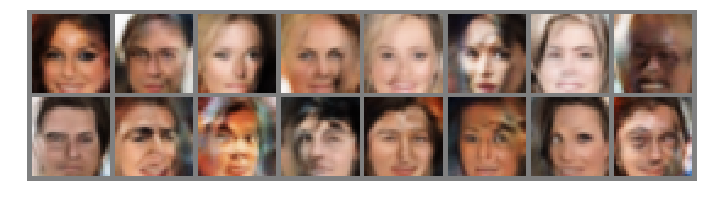

Epoch [   53/  150] | d_loss: 0.7480 | g_loss: 0.8433
Epoch [   53/  150] | d_loss: 0.5952 | g_loss: 2.3456
Epoch [   53/  150] | d_loss: 1.0653 | g_loss: 1.4405
Epoch [   53/  150] | d_loss: 0.5262 | g_loss: 1.3751
Epoch [   53/  150] | d_loss: 0.6883 | g_loss: 1.6393
Epoch [   53/  150] | d_loss: 0.7073 | g_loss: 1.9540
Epoch [   53/  150] | d_loss: 0.9702 | g_loss: 1.7622
Epoch [   53/  150] | d_loss: 0.6634 | g_loss: 1.3360
Epoch [   53/  150] | d_loss: 0.8915 | g_loss: 1.7107
Epoch [   53/  150] | d_loss: 0.7005 | g_loss: 2.1147
Epoch [   53/  150] | d_loss: 0.6369 | g_loss: 1.6943
Epoch [   53/  150] | d_loss: 1.0008 | g_loss: 1.8324
Epoch [   53/  150] | d_loss: 0.8358 | g_loss: 1.9417
Epoch [   53/  150] | d_loss: 0.8109 | g_loss: 1.5659
Epoch [   53/  150] | d_loss: 0.6083 | g_loss: 1.2430


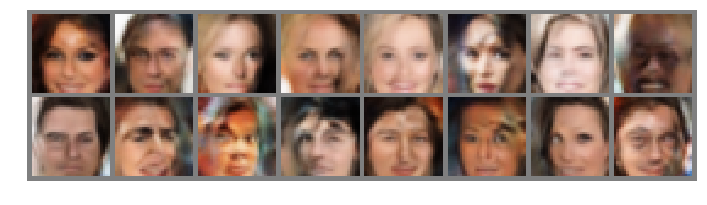

Epoch [   54/  150] | d_loss: 0.6228 | g_loss: 1.2254
Epoch [   54/  150] | d_loss: 0.6212 | g_loss: 1.9552
Epoch [   54/  150] | d_loss: 0.8381 | g_loss: 1.6371
Epoch [   54/  150] | d_loss: 0.7833 | g_loss: 1.5511
Epoch [   54/  150] | d_loss: 0.6742 | g_loss: 1.2888
Epoch [   54/  150] | d_loss: 0.8460 | g_loss: 1.4032
Epoch [   54/  150] | d_loss: 1.1564 | g_loss: 1.3904
Epoch [   54/  150] | d_loss: 0.9437 | g_loss: 2.0859
Epoch [   54/  150] | d_loss: 1.1161 | g_loss: 1.1974
Epoch [   54/  150] | d_loss: 0.5141 | g_loss: 1.0037
Epoch [   54/  150] | d_loss: 0.8799 | g_loss: 0.9720
Epoch [   54/  150] | d_loss: 0.7069 | g_loss: 2.7877
Epoch [   54/  150] | d_loss: 0.8688 | g_loss: 1.4531
Epoch [   54/  150] | d_loss: 0.7045 | g_loss: 2.0004
Epoch [   54/  150] | d_loss: 0.7918 | g_loss: 1.0575


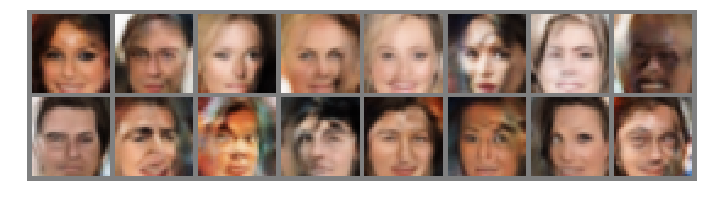

Epoch [   55/  150] | d_loss: 0.9703 | g_loss: 1.4506
Epoch [   55/  150] | d_loss: 0.9907 | g_loss: 1.1724
Epoch [   55/  150] | d_loss: 0.6902 | g_loss: 1.7977
Epoch [   55/  150] | d_loss: 1.0736 | g_loss: 2.2032
Epoch [   55/  150] | d_loss: 1.3768 | g_loss: 1.8535
Epoch [   55/  150] | d_loss: 0.7764 | g_loss: 1.1824
Epoch [   55/  150] | d_loss: 1.0635 | g_loss: 2.8555
Epoch [   55/  150] | d_loss: 0.5609 | g_loss: 1.6711
Epoch [   55/  150] | d_loss: 0.5913 | g_loss: 1.2685
Epoch [   55/  150] | d_loss: 0.6049 | g_loss: 2.1789
Epoch [   55/  150] | d_loss: 0.5027 | g_loss: 1.5108
Epoch [   55/  150] | d_loss: 0.5190 | g_loss: 1.6762
Epoch [   55/  150] | d_loss: 0.9427 | g_loss: 0.7627
Epoch [   55/  150] | d_loss: 0.9943 | g_loss: 1.7952
Epoch [   55/  150] | d_loss: 0.8110 | g_loss: 1.7769


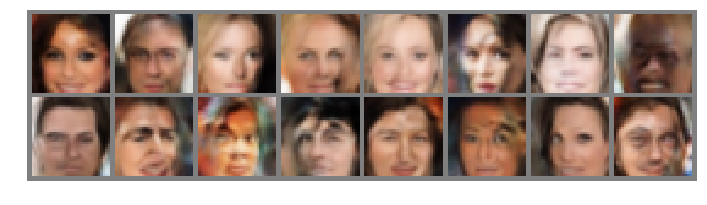

Epoch [   56/  150] | d_loss: 0.8945 | g_loss: 0.9453
Epoch [   56/  150] | d_loss: 0.7213 | g_loss: 1.5070
Epoch [   56/  150] | d_loss: 0.5684 | g_loss: 1.4356
Epoch [   56/  150] | d_loss: 0.7822 | g_loss: 1.6716
Epoch [   56/  150] | d_loss: 1.0315 | g_loss: 1.7006
Epoch [   56/  150] | d_loss: 0.7195 | g_loss: 1.8141
Epoch [   56/  150] | d_loss: 0.9335 | g_loss: 1.7689
Epoch [   56/  150] | d_loss: 0.6844 | g_loss: 2.0172
Epoch [   56/  150] | d_loss: 1.1163 | g_loss: 1.6071
Epoch [   56/  150] | d_loss: 0.7921 | g_loss: 1.2129
Epoch [   56/  150] | d_loss: 0.8845 | g_loss: 1.0552
Epoch [   56/  150] | d_loss: 0.5568 | g_loss: 1.9760
Epoch [   56/  150] | d_loss: 0.6710 | g_loss: 2.3977
Epoch [   56/  150] | d_loss: 0.9437 | g_loss: 2.0495
Epoch [   56/  150] | d_loss: 0.7983 | g_loss: 1.6980


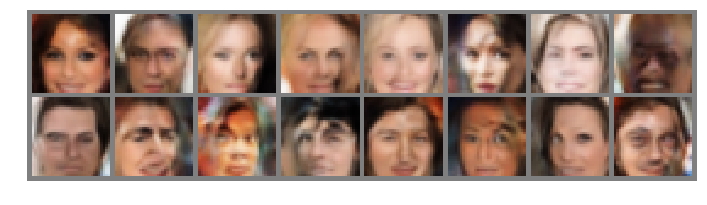

Epoch [   57/  150] | d_loss: 0.7173 | g_loss: 1.3740
Epoch [   57/  150] | d_loss: 0.9175 | g_loss: 2.3374
Epoch [   57/  150] | d_loss: 1.0572 | g_loss: 1.4744
Epoch [   57/  150] | d_loss: 1.2752 | g_loss: 1.5194
Epoch [   57/  150] | d_loss: 0.9372 | g_loss: 1.2260
Epoch [   57/  150] | d_loss: 0.6988 | g_loss: 1.8141
Epoch [   57/  150] | d_loss: 0.6587 | g_loss: 2.1843
Epoch [   57/  150] | d_loss: 1.4601 | g_loss: 1.6970
Epoch [   57/  150] | d_loss: 0.8664 | g_loss: 1.9785
Epoch [   57/  150] | d_loss: 1.0479 | g_loss: 1.9419
Epoch [   57/  150] | d_loss: 0.7818 | g_loss: 1.8289
Epoch [   57/  150] | d_loss: 0.8934 | g_loss: 1.6542
Epoch [   57/  150] | d_loss: 0.7416 | g_loss: 1.5142
Epoch [   57/  150] | d_loss: 0.7005 | g_loss: 1.0275
Epoch [   57/  150] | d_loss: 0.7065 | g_loss: 1.5863


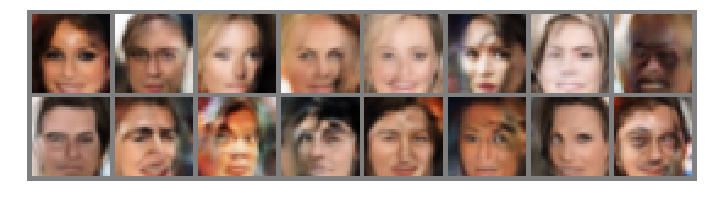

Epoch [   58/  150] | d_loss: 0.9260 | g_loss: 1.6825
Epoch [   58/  150] | d_loss: 0.5822 | g_loss: 1.7198
Epoch [   58/  150] | d_loss: 0.6313 | g_loss: 1.7517
Epoch [   58/  150] | d_loss: 0.9112 | g_loss: 2.3910
Epoch [   58/  150] | d_loss: 1.2265 | g_loss: 2.4564
Epoch [   58/  150] | d_loss: 1.3372 | g_loss: 1.7641
Epoch [   58/  150] | d_loss: 0.8248 | g_loss: 1.4329
Epoch [   58/  150] | d_loss: 0.7313 | g_loss: 0.6952
Epoch [   58/  150] | d_loss: 0.9866 | g_loss: 1.4426
Epoch [   58/  150] | d_loss: 0.4503 | g_loss: 2.0540
Epoch [   58/  150] | d_loss: 0.9405 | g_loss: 1.8714
Epoch [   58/  150] | d_loss: 0.6811 | g_loss: 1.0199
Epoch [   58/  150] | d_loss: 0.6604 | g_loss: 1.3982
Epoch [   58/  150] | d_loss: 0.9909 | g_loss: 1.8561
Epoch [   58/  150] | d_loss: 0.9474 | g_loss: 0.9398


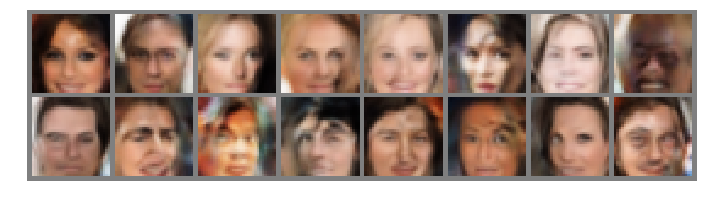

Epoch [   59/  150] | d_loss: 0.6216 | g_loss: 2.0272
Epoch [   59/  150] | d_loss: 0.7892 | g_loss: 2.2625
Epoch [   59/  150] | d_loss: 0.8859 | g_loss: 2.0641
Epoch [   59/  150] | d_loss: 0.7182 | g_loss: 1.4079
Epoch [   59/  150] | d_loss: 0.5820 | g_loss: 1.7629
Epoch [   59/  150] | d_loss: 0.5880 | g_loss: 1.3664
Epoch [   59/  150] | d_loss: 0.9262 | g_loss: 1.3991
Epoch [   59/  150] | d_loss: 0.6785 | g_loss: 1.3207
Epoch [   59/  150] | d_loss: 0.7257 | g_loss: 2.9173
Epoch [   59/  150] | d_loss: 0.9088 | g_loss: 1.9657
Epoch [   59/  150] | d_loss: 0.8520 | g_loss: 2.0123
Epoch [   59/  150] | d_loss: 0.9524 | g_loss: 1.7287
Epoch [   59/  150] | d_loss: 0.7677 | g_loss: 1.6485
Epoch [   59/  150] | d_loss: 1.0450 | g_loss: 2.5661
Epoch [   59/  150] | d_loss: 0.7145 | g_loss: 2.3889


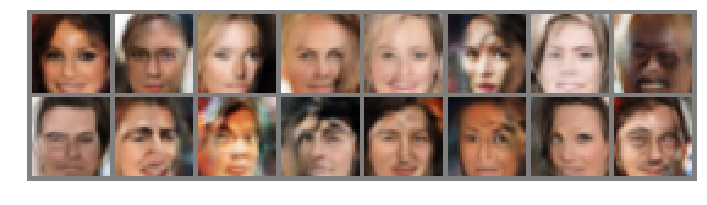

Epoch [   60/  150] | d_loss: 0.8839 | g_loss: 2.2581
Epoch [   60/  150] | d_loss: 0.7126 | g_loss: 1.5085
Epoch [   60/  150] | d_loss: 0.8001 | g_loss: 2.0412
Epoch [   60/  150] | d_loss: 0.7857 | g_loss: 1.4662
Epoch [   60/  150] | d_loss: 0.5114 | g_loss: 1.1690
Epoch [   60/  150] | d_loss: 0.7243 | g_loss: 1.5783
Epoch [   60/  150] | d_loss: 0.6206 | g_loss: 1.0562
Epoch [   60/  150] | d_loss: 0.6452 | g_loss: 1.6802
Epoch [   60/  150] | d_loss: 0.8273 | g_loss: 1.0288
Epoch [   60/  150] | d_loss: 0.6154 | g_loss: 2.0486
Epoch [   60/  150] | d_loss: 0.8250 | g_loss: 1.8246
Epoch [   60/  150] | d_loss: 0.8951 | g_loss: 1.3766
Epoch [   60/  150] | d_loss: 0.5532 | g_loss: 1.3040
Epoch [   60/  150] | d_loss: 1.0824 | g_loss: 2.3211
Epoch [   60/  150] | d_loss: 0.9984 | g_loss: 2.4394


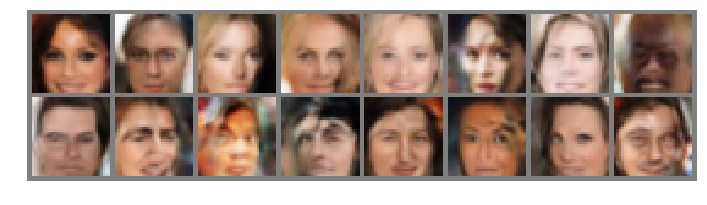

Epoch [   61/  150] | d_loss: 0.8609 | g_loss: 1.4895
Epoch [   61/  150] | d_loss: 1.1556 | g_loss: 3.4367
Epoch [   61/  150] | d_loss: 0.7501 | g_loss: 1.5180
Epoch [   61/  150] | d_loss: 0.6620 | g_loss: 1.8432
Epoch [   61/  150] | d_loss: 0.7629 | g_loss: 1.0093
Epoch [   61/  150] | d_loss: 1.1116 | g_loss: 1.7452
Epoch [   61/  150] | d_loss: 0.6547 | g_loss: 2.4934
Epoch [   61/  150] | d_loss: 0.4583 | g_loss: 1.7793
Epoch [   61/  150] | d_loss: 0.7631 | g_loss: 1.6638
Epoch [   61/  150] | d_loss: 1.3077 | g_loss: 1.0023
Epoch [   61/  150] | d_loss: 0.6191 | g_loss: 1.2996
Epoch [   61/  150] | d_loss: 0.4368 | g_loss: 1.9892
Epoch [   61/  150] | d_loss: 0.5153 | g_loss: 1.9573
Epoch [   61/  150] | d_loss: 0.6625 | g_loss: 1.2690
Epoch [   61/  150] | d_loss: 0.4846 | g_loss: 1.8495


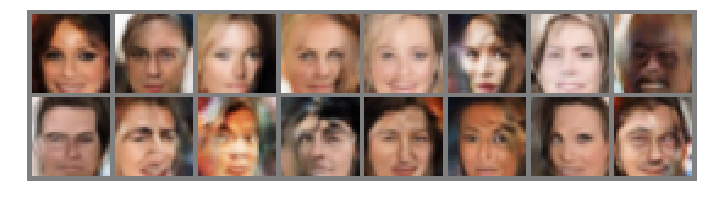

Epoch [   62/  150] | d_loss: 0.6421 | g_loss: 2.5991
Epoch [   62/  150] | d_loss: 0.5743 | g_loss: 1.4571
Epoch [   62/  150] | d_loss: 0.8150 | g_loss: 1.0729
Epoch [   62/  150] | d_loss: 0.7665 | g_loss: 1.5191
Epoch [   62/  150] | d_loss: 1.0106 | g_loss: 1.6249
Epoch [   62/  150] | d_loss: 1.0548 | g_loss: 1.1276
Epoch [   62/  150] | d_loss: 0.5371 | g_loss: 1.4701
Epoch [   62/  150] | d_loss: 0.8989 | g_loss: 1.5563
Epoch [   62/  150] | d_loss: 0.6475 | g_loss: 2.6738
Epoch [   62/  150] | d_loss: 0.4891 | g_loss: 1.8471
Epoch [   62/  150] | d_loss: 0.9996 | g_loss: 1.0827
Epoch [   62/  150] | d_loss: 0.4343 | g_loss: 1.6596
Epoch [   62/  150] | d_loss: 0.6204 | g_loss: 2.8913
Epoch [   62/  150] | d_loss: 1.4259 | g_loss: 0.9774
Epoch [   62/  150] | d_loss: 0.8628 | g_loss: 1.3176


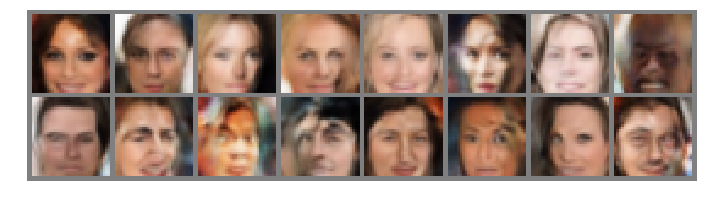

Epoch [   63/  150] | d_loss: 0.5786 | g_loss: 1.4230
Epoch [   63/  150] | d_loss: 0.6731 | g_loss: 1.9645
Epoch [   63/  150] | d_loss: 0.9678 | g_loss: 1.4680
Epoch [   63/  150] | d_loss: 1.0745 | g_loss: 1.7414
Epoch [   63/  150] | d_loss: 0.6662 | g_loss: 1.6445
Epoch [   63/  150] | d_loss: 0.4510 | g_loss: 2.7755
Epoch [   63/  150] | d_loss: 0.6576 | g_loss: 1.2178
Epoch [   63/  150] | d_loss: 0.8405 | g_loss: 2.6203
Epoch [   63/  150] | d_loss: 0.6369 | g_loss: 2.4826
Epoch [   63/  150] | d_loss: 0.7647 | g_loss: 1.8461
Epoch [   63/  150] | d_loss: 0.8633 | g_loss: 1.3318
Epoch [   63/  150] | d_loss: 1.2237 | g_loss: 1.3387
Epoch [   63/  150] | d_loss: 0.7960 | g_loss: 2.2114
Epoch [   63/  150] | d_loss: 0.9212 | g_loss: 1.9282
Epoch [   63/  150] | d_loss: 0.4840 | g_loss: 1.8978


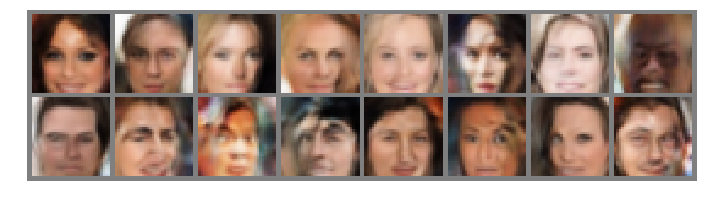

Epoch [   64/  150] | d_loss: 0.7462 | g_loss: 1.1401
Epoch [   64/  150] | d_loss: 0.5756 | g_loss: 1.3318
Epoch [   64/  150] | d_loss: 1.2850 | g_loss: 1.4666
Epoch [   64/  150] | d_loss: 0.7302 | g_loss: 1.0089
Epoch [   64/  150] | d_loss: 0.6029 | g_loss: 1.4006
Epoch [   64/  150] | d_loss: 1.1467 | g_loss: 1.3113
Epoch [   64/  150] | d_loss: 0.8020 | g_loss: 2.7032
Epoch [   64/  150] | d_loss: 0.5976 | g_loss: 1.5946
Epoch [   64/  150] | d_loss: 0.7353 | g_loss: 1.9531
Epoch [   64/  150] | d_loss: 0.7403 | g_loss: 2.0105
Epoch [   64/  150] | d_loss: 0.5408 | g_loss: 1.9082
Epoch [   64/  150] | d_loss: 0.6924 | g_loss: 1.6182
Epoch [   64/  150] | d_loss: 0.9713 | g_loss: 1.6955
Epoch [   64/  150] | d_loss: 0.3759 | g_loss: 2.2023
Epoch [   64/  150] | d_loss: 0.6118 | g_loss: 1.4744


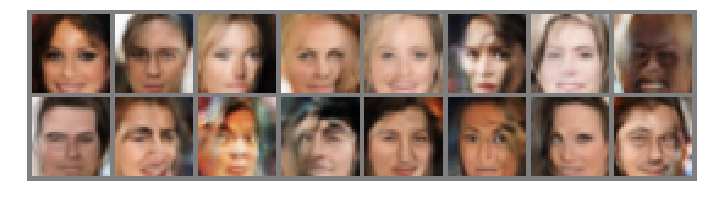

Epoch [   65/  150] | d_loss: 0.8659 | g_loss: 2.0757
Epoch [   65/  150] | d_loss: 0.7524 | g_loss: 2.3089
Epoch [   65/  150] | d_loss: 0.7293 | g_loss: 2.0784
Epoch [   65/  150] | d_loss: 0.7215 | g_loss: 1.9563
Epoch [   65/  150] | d_loss: 0.8324 | g_loss: 1.8418
Epoch [   65/  150] | d_loss: 0.7522 | g_loss: 1.1285
Epoch [   65/  150] | d_loss: 1.4211 | g_loss: 1.8303
Epoch [   65/  150] | d_loss: 0.8227 | g_loss: 1.3219
Epoch [   65/  150] | d_loss: 0.6641 | g_loss: 1.8879
Epoch [   65/  150] | d_loss: 0.7522 | g_loss: 1.8489
Epoch [   65/  150] | d_loss: 1.1118 | g_loss: 2.5356
Epoch [   65/  150] | d_loss: 0.7169 | g_loss: 2.5744
Epoch [   65/  150] | d_loss: 0.5608 | g_loss: 1.5673
Epoch [   65/  150] | d_loss: 0.8321 | g_loss: 2.5623
Epoch [   65/  150] | d_loss: 0.8081 | g_loss: 2.2119


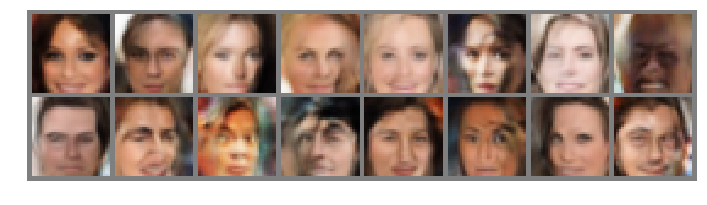

Epoch [   66/  150] | d_loss: 0.9377 | g_loss: 1.2692
Epoch [   66/  150] | d_loss: 0.7674 | g_loss: 1.8076
Epoch [   66/  150] | d_loss: 0.7798 | g_loss: 1.3896
Epoch [   66/  150] | d_loss: 0.5201 | g_loss: 2.0909
Epoch [   66/  150] | d_loss: 0.9402 | g_loss: 1.2872
Epoch [   66/  150] | d_loss: 0.9522 | g_loss: 2.0205
Epoch [   66/  150] | d_loss: 1.0107 | g_loss: 1.6616
Epoch [   66/  150] | d_loss: 0.9250 | g_loss: 1.4867
Epoch [   66/  150] | d_loss: 1.0572 | g_loss: 1.8675
Epoch [   66/  150] | d_loss: 0.8929 | g_loss: 1.4070
Epoch [   66/  150] | d_loss: 1.0128 | g_loss: 1.0584
Epoch [   66/  150] | d_loss: 0.7852 | g_loss: 1.3929
Epoch [   66/  150] | d_loss: 1.1624 | g_loss: 0.8939
Epoch [   66/  150] | d_loss: 1.0592 | g_loss: 1.6734
Epoch [   66/  150] | d_loss: 0.7186 | g_loss: 1.5157


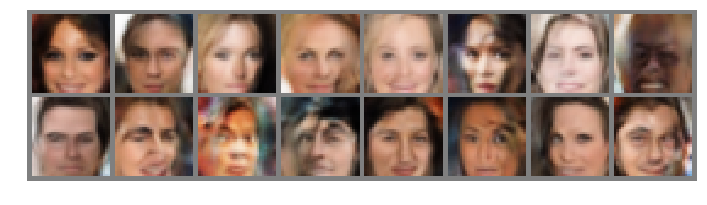

Epoch [   67/  150] | d_loss: 0.8839 | g_loss: 1.9117
Epoch [   67/  150] | d_loss: 0.8191 | g_loss: 1.6116
Epoch [   67/  150] | d_loss: 0.9429 | g_loss: 1.4660
Epoch [   67/  150] | d_loss: 0.8722 | g_loss: 1.7810
Epoch [   67/  150] | d_loss: 0.9437 | g_loss: 2.9519
Epoch [   67/  150] | d_loss: 0.5112 | g_loss: 1.5955
Epoch [   67/  150] | d_loss: 0.8794 | g_loss: 1.7935
Epoch [   67/  150] | d_loss: 0.8810 | g_loss: 1.0206
Epoch [   67/  150] | d_loss: 0.8042 | g_loss: 1.8999
Epoch [   67/  150] | d_loss: 0.7077 | g_loss: 2.0810
Epoch [   67/  150] | d_loss: 0.6898 | g_loss: 2.5094
Epoch [   67/  150] | d_loss: 1.0725 | g_loss: 1.6833
Epoch [   67/  150] | d_loss: 0.8823 | g_loss: 1.4068
Epoch [   67/  150] | d_loss: 0.8998 | g_loss: 2.0263
Epoch [   67/  150] | d_loss: 0.7207 | g_loss: 2.5791


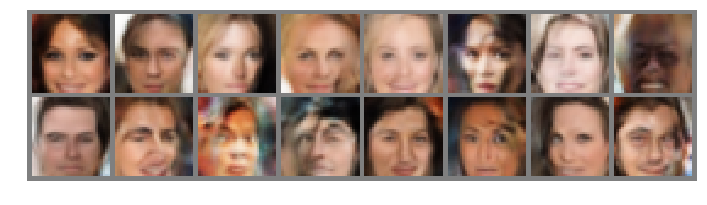

Epoch [   68/  150] | d_loss: 0.9709 | g_loss: 1.3985
Epoch [   68/  150] | d_loss: 0.7818 | g_loss: 1.4040
Epoch [   68/  150] | d_loss: 0.4216 | g_loss: 1.9953
Epoch [   68/  150] | d_loss: 0.5002 | g_loss: 1.7339
Epoch [   68/  150] | d_loss: 0.7127 | g_loss: 1.8509
Epoch [   68/  150] | d_loss: 1.0398 | g_loss: 1.6938
Epoch [   68/  150] | d_loss: 0.4196 | g_loss: 2.0256
Epoch [   68/  150] | d_loss: 0.9528 | g_loss: 1.6360
Epoch [   68/  150] | d_loss: 1.0912 | g_loss: 1.4533
Epoch [   68/  150] | d_loss: 0.5876 | g_loss: 2.1776
Epoch [   68/  150] | d_loss: 0.8875 | g_loss: 1.7056
Epoch [   68/  150] | d_loss: 0.6009 | g_loss: 2.4608
Epoch [   68/  150] | d_loss: 0.5079 | g_loss: 1.8480
Epoch [   68/  150] | d_loss: 1.1085 | g_loss: 1.6432
Epoch [   68/  150] | d_loss: 0.8598 | g_loss: 1.6383


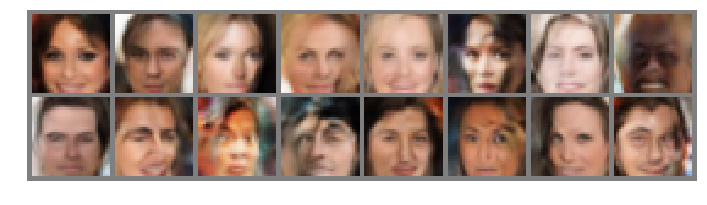

Epoch [   69/  150] | d_loss: 0.9218 | g_loss: 1.2440
Epoch [   69/  150] | d_loss: 0.5710 | g_loss: 2.4719
Epoch [   69/  150] | d_loss: 0.6800 | g_loss: 1.8521
Epoch [   69/  150] | d_loss: 0.8711 | g_loss: 1.6313
Epoch [   69/  150] | d_loss: 0.9146 | g_loss: 1.9257
Epoch [   69/  150] | d_loss: 0.6077 | g_loss: 2.1245
Epoch [   69/  150] | d_loss: 0.7381 | g_loss: 1.0280
Epoch [   69/  150] | d_loss: 1.0663 | g_loss: 2.5365
Epoch [   69/  150] | d_loss: 0.8312 | g_loss: 2.2351
Epoch [   69/  150] | d_loss: 0.6375 | g_loss: 1.0155
Epoch [   69/  150] | d_loss: 0.9870 | g_loss: 2.1568
Epoch [   69/  150] | d_loss: 1.0307 | g_loss: 2.2288
Epoch [   69/  150] | d_loss: 0.6907 | g_loss: 1.5570
Epoch [   69/  150] | d_loss: 0.8436 | g_loss: 1.7478
Epoch [   69/  150] | d_loss: 0.4357 | g_loss: 1.6544


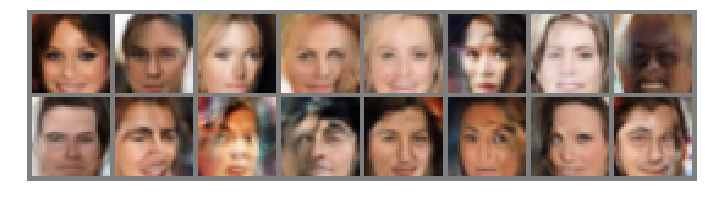

Epoch [   70/  150] | d_loss: 0.3446 | g_loss: 1.1382
Epoch [   70/  150] | d_loss: 0.7797 | g_loss: 1.3394
Epoch [   70/  150] | d_loss: 0.4242 | g_loss: 1.5364
Epoch [   70/  150] | d_loss: 0.8651 | g_loss: 2.1235
Epoch [   70/  150] | d_loss: 0.9487 | g_loss: 2.1063
Epoch [   70/  150] | d_loss: 1.0282 | g_loss: 1.8552
Epoch [   70/  150] | d_loss: 0.4192 | g_loss: 1.6794
Epoch [   70/  150] | d_loss: 0.4579 | g_loss: 1.7427
Epoch [   70/  150] | d_loss: 1.4043 | g_loss: 1.0379
Epoch [   70/  150] | d_loss: 0.7609 | g_loss: 1.7294
Epoch [   70/  150] | d_loss: 0.5161 | g_loss: 1.6616
Epoch [   70/  150] | d_loss: 1.1505 | g_loss: 2.2331
Epoch [   70/  150] | d_loss: 0.7654 | g_loss: 2.1158
Epoch [   70/  150] | d_loss: 0.6772 | g_loss: 1.9085
Epoch [   70/  150] | d_loss: 0.7852 | g_loss: 2.0500


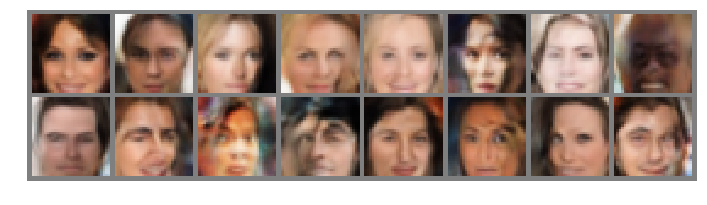

Epoch [   71/  150] | d_loss: 1.2735 | g_loss: 1.1343
Epoch [   71/  150] | d_loss: 0.5236 | g_loss: 1.1713
Epoch [   71/  150] | d_loss: 1.0345 | g_loss: 2.3912
Epoch [   71/  150] | d_loss: 0.9640 | g_loss: 1.6806
Epoch [   71/  150] | d_loss: 0.6838 | g_loss: 2.3879
Epoch [   71/  150] | d_loss: 1.2772 | g_loss: 2.1102
Epoch [   71/  150] | d_loss: 0.7827 | g_loss: 1.6571
Epoch [   71/  150] | d_loss: 0.6303 | g_loss: 2.6246
Epoch [   71/  150] | d_loss: 0.7333 | g_loss: 1.3126
Epoch [   71/  150] | d_loss: 0.8308 | g_loss: 1.0695
Epoch [   71/  150] | d_loss: 1.0989 | g_loss: 2.4358
Epoch [   71/  150] | d_loss: 0.7381 | g_loss: 2.6595
Epoch [   71/  150] | d_loss: 0.6006 | g_loss: 2.0173
Epoch [   71/  150] | d_loss: 0.6731 | g_loss: 1.3389
Epoch [   71/  150] | d_loss: 0.5470 | g_loss: 0.7935


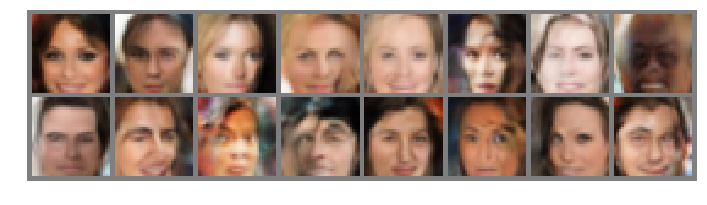

Epoch [   72/  150] | d_loss: 0.6915 | g_loss: 3.0901
Epoch [   72/  150] | d_loss: 0.5526 | g_loss: 1.8667
Epoch [   72/  150] | d_loss: 0.5493 | g_loss: 1.7107
Epoch [   72/  150] | d_loss: 0.8255 | g_loss: 1.7031
Epoch [   72/  150] | d_loss: 0.6807 | g_loss: 1.4553
Epoch [   72/  150] | d_loss: 0.7453 | g_loss: 1.6353
Epoch [   72/  150] | d_loss: 1.2947 | g_loss: 2.7211
Epoch [   72/  150] | d_loss: 0.7530 | g_loss: 1.5939
Epoch [   72/  150] | d_loss: 1.0702 | g_loss: 1.3331
Epoch [   72/  150] | d_loss: 0.6637 | g_loss: 1.9449
Epoch [   72/  150] | d_loss: 0.6307 | g_loss: 2.1005
Epoch [   72/  150] | d_loss: 0.4637 | g_loss: 1.8984
Epoch [   72/  150] | d_loss: 0.7001 | g_loss: 2.1111
Epoch [   72/  150] | d_loss: 1.3435 | g_loss: 1.4762
Epoch [   72/  150] | d_loss: 0.4911 | g_loss: 1.7810


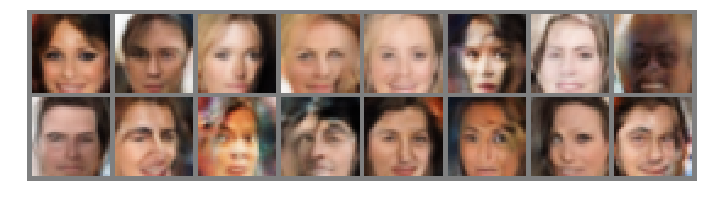

Epoch [   73/  150] | d_loss: 0.5762 | g_loss: 1.9880
Epoch [   73/  150] | d_loss: 0.5218 | g_loss: 2.3121
Epoch [   73/  150] | d_loss: 0.7468 | g_loss: 1.2536
Epoch [   73/  150] | d_loss: 0.4689 | g_loss: 1.6780
Epoch [   73/  150] | d_loss: 1.0996 | g_loss: 2.0680
Epoch [   73/  150] | d_loss: 1.0403 | g_loss: 2.2047
Epoch [   73/  150] | d_loss: 1.0252 | g_loss: 1.8917
Epoch [   73/  150] | d_loss: 0.7542 | g_loss: 1.7994
Epoch [   73/  150] | d_loss: 1.0367 | g_loss: 1.8235
Epoch [   73/  150] | d_loss: 0.9951 | g_loss: 2.8953
Epoch [   73/  150] | d_loss: 0.9814 | g_loss: 1.4811
Epoch [   73/  150] | d_loss: 0.5691 | g_loss: 3.2358
Epoch [   73/  150] | d_loss: 1.0645 | g_loss: 1.6063
Epoch [   73/  150] | d_loss: 0.8838 | g_loss: 1.6237
Epoch [   73/  150] | d_loss: 0.9339 | g_loss: 1.5946


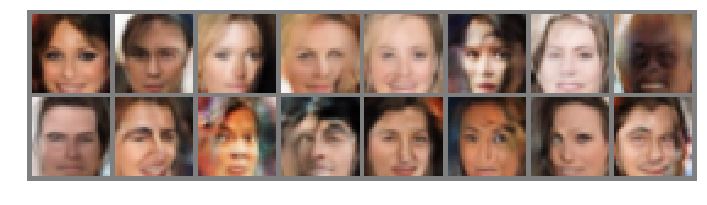

Epoch [   74/  150] | d_loss: 0.7342 | g_loss: 2.5268
Epoch [   74/  150] | d_loss: 0.5060 | g_loss: 1.2757
Epoch [   74/  150] | d_loss: 0.9516 | g_loss: 1.4070
Epoch [   74/  150] | d_loss: 1.1068 | g_loss: 1.5318
Epoch [   74/  150] | d_loss: 0.6926 | g_loss: 1.2579
Epoch [   74/  150] | d_loss: 0.4430 | g_loss: 2.2425
Epoch [   74/  150] | d_loss: 0.7497 | g_loss: 1.9250
Epoch [   74/  150] | d_loss: 1.3110 | g_loss: 1.4240
Epoch [   74/  150] | d_loss: 0.9331 | g_loss: 1.5088
Epoch [   74/  150] | d_loss: 1.6754 | g_loss: 2.9213
Epoch [   74/  150] | d_loss: 0.6603 | g_loss: 1.0376
Epoch [   74/  150] | d_loss: 0.6035 | g_loss: 3.3816
Epoch [   74/  150] | d_loss: 0.4953 | g_loss: 1.6647
Epoch [   74/  150] | d_loss: 0.5834 | g_loss: 1.5961
Epoch [   74/  150] | d_loss: 0.8663 | g_loss: 3.1557


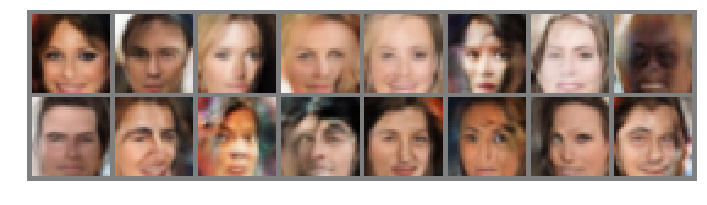

Epoch [   75/  150] | d_loss: 0.6233 | g_loss: 2.1513
Epoch [   75/  150] | d_loss: 0.7949 | g_loss: 2.4589
Epoch [   75/  150] | d_loss: 0.4339 | g_loss: 2.7149
Epoch [   75/  150] | d_loss: 0.4530 | g_loss: 1.3915
Epoch [   75/  150] | d_loss: 0.9593 | g_loss: 1.6417
Epoch [   75/  150] | d_loss: 0.6124 | g_loss: 1.4274
Epoch [   75/  150] | d_loss: 0.6965 | g_loss: 2.3595
Epoch [   75/  150] | d_loss: 0.3634 | g_loss: 1.8248
Epoch [   75/  150] | d_loss: 0.5886 | g_loss: 2.2721
Epoch [   75/  150] | d_loss: 1.1057 | g_loss: 2.7405
Epoch [   75/  150] | d_loss: 0.5976 | g_loss: 0.8746
Epoch [   75/  150] | d_loss: 0.9136 | g_loss: 1.9684
Epoch [   75/  150] | d_loss: 0.5049 | g_loss: 1.5276
Epoch [   75/  150] | d_loss: 1.3894 | g_loss: 2.2505
Epoch [   75/  150] | d_loss: 0.4861 | g_loss: 2.6081


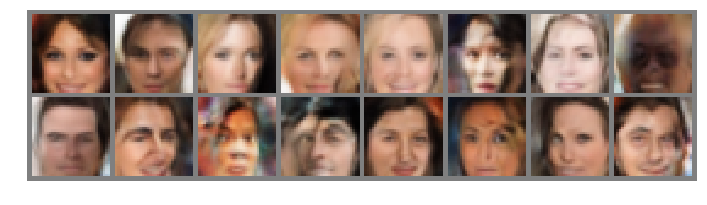

Epoch [   76/  150] | d_loss: 0.6498 | g_loss: 1.3754
Epoch [   76/  150] | d_loss: 0.4756 | g_loss: 1.0996
Epoch [   76/  150] | d_loss: 0.9125 | g_loss: 1.3316
Epoch [   76/  150] | d_loss: 0.4872 | g_loss: 1.4441
Epoch [   76/  150] | d_loss: 0.5596 | g_loss: 1.6277
Epoch [   76/  150] | d_loss: 0.6299 | g_loss: 1.0392
Epoch [   76/  150] | d_loss: 0.7651 | g_loss: 2.6526
Epoch [   76/  150] | d_loss: 0.9589 | g_loss: 0.9294
Epoch [   76/  150] | d_loss: 0.6373 | g_loss: 1.8060
Epoch [   76/  150] | d_loss: 0.5316 | g_loss: 2.0757
Epoch [   76/  150] | d_loss: 0.5731 | g_loss: 1.5366
Epoch [   76/  150] | d_loss: 0.6226 | g_loss: 2.2543
Epoch [   76/  150] | d_loss: 0.5712 | g_loss: 2.7773
Epoch [   76/  150] | d_loss: 0.5986 | g_loss: 2.7588
Epoch [   76/  150] | d_loss: 0.7108 | g_loss: 2.0712


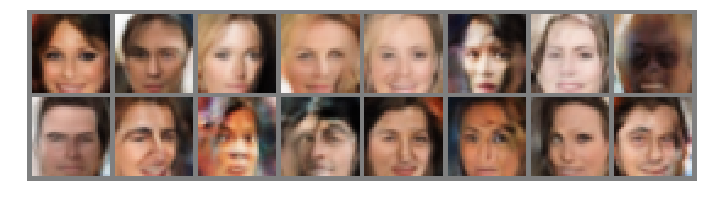

Epoch [   77/  150] | d_loss: 0.9818 | g_loss: 1.8633
Epoch [   77/  150] | d_loss: 1.0966 | g_loss: 1.0889
Epoch [   77/  150] | d_loss: 0.7964 | g_loss: 1.4281
Epoch [   77/  150] | d_loss: 0.7871 | g_loss: 1.6358
Epoch [   77/  150] | d_loss: 0.5974 | g_loss: 1.8426
Epoch [   77/  150] | d_loss: 0.6634 | g_loss: 1.9934
Epoch [   77/  150] | d_loss: 0.5969 | g_loss: 1.2469
Epoch [   77/  150] | d_loss: 0.4804 | g_loss: 1.1952
Epoch [   77/  150] | d_loss: 0.8035 | g_loss: 1.2534
Epoch [   77/  150] | d_loss: 0.6465 | g_loss: 2.1263
Epoch [   77/  150] | d_loss: 0.9501 | g_loss: 2.1741
Epoch [   77/  150] | d_loss: 0.5499 | g_loss: 2.0968
Epoch [   77/  150] | d_loss: 0.4796 | g_loss: 2.4759
Epoch [   77/  150] | d_loss: 0.8318 | g_loss: 2.7698
Epoch [   77/  150] | d_loss: 1.1733 | g_loss: 1.7039


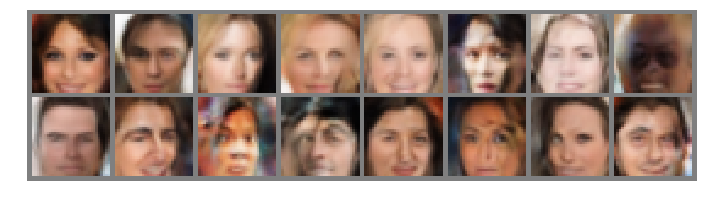

Epoch [   78/  150] | d_loss: 0.7304 | g_loss: 1.8600
Epoch [   78/  150] | d_loss: 0.5152 | g_loss: 3.1096
Epoch [   78/  150] | d_loss: 0.6195 | g_loss: 1.8075
Epoch [   78/  150] | d_loss: 1.2196 | g_loss: 1.5273
Epoch [   78/  150] | d_loss: 0.8870 | g_loss: 1.3203
Epoch [   78/  150] | d_loss: 0.5513 | g_loss: 1.1376
Epoch [   78/  150] | d_loss: 0.6267 | g_loss: 2.3224
Epoch [   78/  150] | d_loss: 1.3471 | g_loss: 1.6103
Epoch [   78/  150] | d_loss: 0.7269 | g_loss: 0.9950
Epoch [   78/  150] | d_loss: 0.8720 | g_loss: 2.5655
Epoch [   78/  150] | d_loss: 0.5407 | g_loss: 2.0614
Epoch [   78/  150] | d_loss: 1.0114 | g_loss: 1.0667
Epoch [   78/  150] | d_loss: 0.5075 | g_loss: 0.9931
Epoch [   78/  150] | d_loss: 0.4389 | g_loss: 2.1549
Epoch [   78/  150] | d_loss: 0.6219 | g_loss: 2.4738


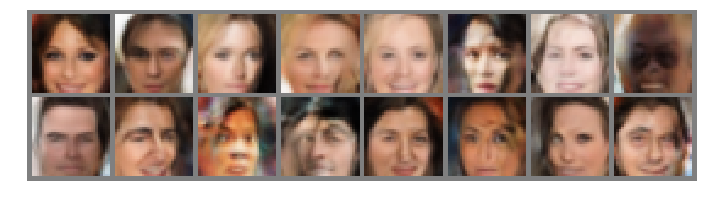

Epoch [   79/  150] | d_loss: 0.9143 | g_loss: 1.2189
Epoch [   79/  150] | d_loss: 0.7333 | g_loss: 1.7559
Epoch [   79/  150] | d_loss: 0.4933 | g_loss: 2.3454
Epoch [   79/  150] | d_loss: 0.7382 | g_loss: 1.8323
Epoch [   79/  150] | d_loss: 0.5846 | g_loss: 1.9830
Epoch [   79/  150] | d_loss: 0.4193 | g_loss: 1.5687
Epoch [   79/  150] | d_loss: 0.5784 | g_loss: 3.0168
Epoch [   79/  150] | d_loss: 0.6023 | g_loss: 1.1664
Epoch [   79/  150] | d_loss: 0.6627 | g_loss: 1.7366
Epoch [   79/  150] | d_loss: 0.7358 | g_loss: 2.1456
Epoch [   79/  150] | d_loss: 0.7455 | g_loss: 1.9717
Epoch [   79/  150] | d_loss: 0.7141 | g_loss: 1.9134
Epoch [   79/  150] | d_loss: 0.5226 | g_loss: 2.7673
Epoch [   79/  150] | d_loss: 0.4855 | g_loss: 1.5553
Epoch [   79/  150] | d_loss: 0.5304 | g_loss: 1.9007


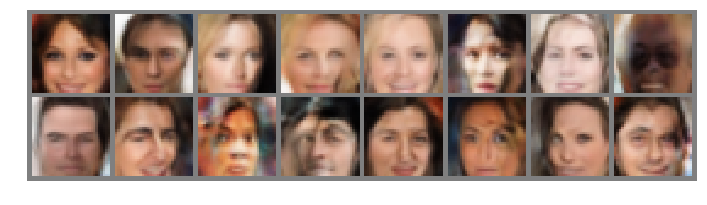

Epoch [   80/  150] | d_loss: 0.7388 | g_loss: 1.6310
Epoch [   80/  150] | d_loss: 0.8189 | g_loss: 1.5862
Epoch [   80/  150] | d_loss: 0.6150 | g_loss: 2.1592
Epoch [   80/  150] | d_loss: 0.9729 | g_loss: 2.1704
Epoch [   80/  150] | d_loss: 0.6113 | g_loss: 1.0074
Epoch [   80/  150] | d_loss: 0.7475 | g_loss: 1.6437
Epoch [   80/  150] | d_loss: 0.5941 | g_loss: 1.4632
Epoch [   80/  150] | d_loss: 0.9198 | g_loss: 1.4920
Epoch [   80/  150] | d_loss: 0.5225 | g_loss: 1.3160
Epoch [   80/  150] | d_loss: 0.9127 | g_loss: 2.7754
Epoch [   80/  150] | d_loss: 0.3906 | g_loss: 0.8851
Epoch [   80/  150] | d_loss: 0.4177 | g_loss: 2.1500
Epoch [   80/  150] | d_loss: 0.7672 | g_loss: 1.2287
Epoch [   80/  150] | d_loss: 0.3690 | g_loss: 1.6720
Epoch [   80/  150] | d_loss: 0.6813 | g_loss: 1.7999


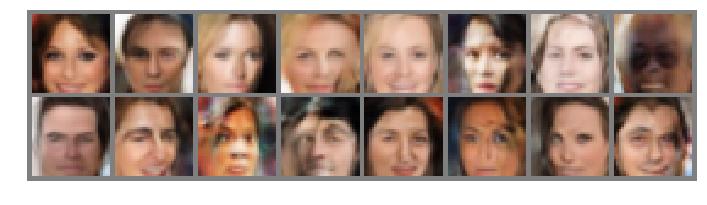

Epoch [   81/  150] | d_loss: 0.6631 | g_loss: 1.9600
Epoch [   81/  150] | d_loss: 0.6930 | g_loss: 1.7805
Epoch [   81/  150] | d_loss: 0.6016 | g_loss: 2.4687
Epoch [   81/  150] | d_loss: 0.8114 | g_loss: 1.5379
Epoch [   81/  150] | d_loss: 1.0108 | g_loss: 2.0303
Epoch [   81/  150] | d_loss: 0.8759 | g_loss: 1.3137
Epoch [   81/  150] | d_loss: 0.4838 | g_loss: 2.0151
Epoch [   81/  150] | d_loss: 0.7411 | g_loss: 1.3680
Epoch [   81/  150] | d_loss: 0.8044 | g_loss: 1.1647
Epoch [   81/  150] | d_loss: 0.6131 | g_loss: 1.2689
Epoch [   81/  150] | d_loss: 0.4094 | g_loss: 1.1047
Epoch [   81/  150] | d_loss: 0.9116 | g_loss: 2.4465
Epoch [   81/  150] | d_loss: 1.0019 | g_loss: 1.6254
Epoch [   81/  150] | d_loss: 0.8206 | g_loss: 1.5825
Epoch [   81/  150] | d_loss: 0.8540 | g_loss: 0.8988


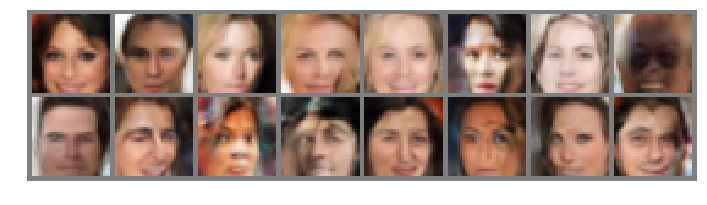

Epoch [   82/  150] | d_loss: 0.4870 | g_loss: 3.5046
Epoch [   82/  150] | d_loss: 0.6645 | g_loss: 2.2241
Epoch [   82/  150] | d_loss: 1.1115 | g_loss: 1.2264
Epoch [   82/  150] | d_loss: 0.5948 | g_loss: 1.4913
Epoch [   82/  150] | d_loss: 0.5504 | g_loss: 0.7942
Epoch [   82/  150] | d_loss: 0.4082 | g_loss: 1.9088
Epoch [   82/  150] | d_loss: 1.2562 | g_loss: 1.5467
Epoch [   82/  150] | d_loss: 0.7003 | g_loss: 1.8267
Epoch [   82/  150] | d_loss: 0.9092 | g_loss: 2.0090
Epoch [   82/  150] | d_loss: 0.5825 | g_loss: 3.1411
Epoch [   82/  150] | d_loss: 0.5531 | g_loss: 1.5173
Epoch [   82/  150] | d_loss: 1.0004 | g_loss: 2.2800
Epoch [   82/  150] | d_loss: 0.6736 | g_loss: 1.8049
Epoch [   82/  150] | d_loss: 0.4041 | g_loss: 1.1281
Epoch [   82/  150] | d_loss: 0.7378 | g_loss: 1.5705


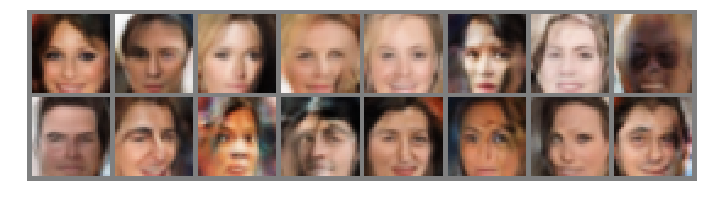

Epoch [   83/  150] | d_loss: 0.8262 | g_loss: 1.1454
Epoch [   83/  150] | d_loss: 0.4831 | g_loss: 2.6398
Epoch [   83/  150] | d_loss: 0.4493 | g_loss: 2.0397
Epoch [   83/  150] | d_loss: 0.5991 | g_loss: 3.0490
Epoch [   83/  150] | d_loss: 0.7703 | g_loss: 2.8632
Epoch [   83/  150] | d_loss: 0.7062 | g_loss: 1.7644
Epoch [   83/  150] | d_loss: 0.6576 | g_loss: 2.3103
Epoch [   83/  150] | d_loss: 0.8911 | g_loss: 1.2764
Epoch [   83/  150] | d_loss: 0.8338 | g_loss: 1.2943
Epoch [   83/  150] | d_loss: 0.6790 | g_loss: 1.0042
Epoch [   83/  150] | d_loss: 0.5504 | g_loss: 1.8112
Epoch [   83/  150] | d_loss: 0.6039 | g_loss: 1.8090
Epoch [   83/  150] | d_loss: 0.6301 | g_loss: 1.6563
Epoch [   83/  150] | d_loss: 1.0097 | g_loss: 2.4263
Epoch [   83/  150] | d_loss: 0.7538 | g_loss: 1.5085


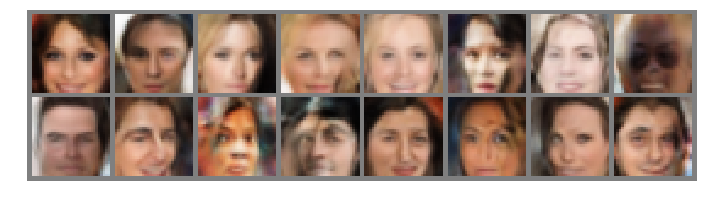

Epoch [   84/  150] | d_loss: 1.0413 | g_loss: 2.4852
Epoch [   84/  150] | d_loss: 0.9479 | g_loss: 1.9658
Epoch [   84/  150] | d_loss: 0.5731 | g_loss: 2.7892
Epoch [   84/  150] | d_loss: 0.3844 | g_loss: 1.4343
Epoch [   84/  150] | d_loss: 0.6974 | g_loss: 1.5982
Epoch [   84/  150] | d_loss: 0.7514 | g_loss: 2.8551
Epoch [   84/  150] | d_loss: 0.6933 | g_loss: 2.9388
Epoch [   84/  150] | d_loss: 0.5020 | g_loss: 1.5556
Epoch [   84/  150] | d_loss: 1.0158 | g_loss: 1.5392
Epoch [   84/  150] | d_loss: 0.7940 | g_loss: 1.8512
Epoch [   84/  150] | d_loss: 0.7848 | g_loss: 2.2705
Epoch [   84/  150] | d_loss: 0.9233 | g_loss: 2.4586
Epoch [   84/  150] | d_loss: 0.7082 | g_loss: 1.9297
Epoch [   84/  150] | d_loss: 0.6873 | g_loss: 2.0647
Epoch [   84/  150] | d_loss: 0.7913 | g_loss: 2.7331


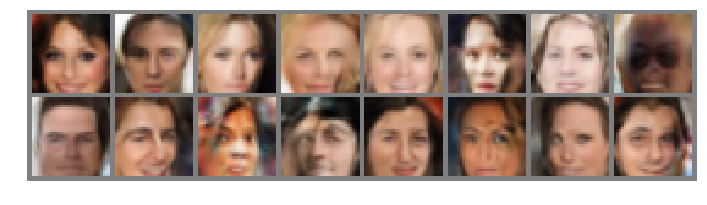

Epoch [   85/  150] | d_loss: 0.8044 | g_loss: 1.3244
Epoch [   85/  150] | d_loss: 0.3166 | g_loss: 1.8521
Epoch [   85/  150] | d_loss: 0.8416 | g_loss: 1.1370
Epoch [   85/  150] | d_loss: 1.0998 | g_loss: 1.1058
Epoch [   85/  150] | d_loss: 0.6109 | g_loss: 2.2935
Epoch [   85/  150] | d_loss: 0.8856 | g_loss: 2.0053
Epoch [   85/  150] | d_loss: 1.1593 | g_loss: 2.3610
Epoch [   85/  150] | d_loss: 0.8914 | g_loss: 2.7485
Epoch [   85/  150] | d_loss: 0.2922 | g_loss: 2.7689
Epoch [   85/  150] | d_loss: 0.9284 | g_loss: 1.7967
Epoch [   85/  150] | d_loss: 0.6031 | g_loss: 1.9295
Epoch [   85/  150] | d_loss: 1.2370 | g_loss: 1.8464
Epoch [   85/  150] | d_loss: 0.9130 | g_loss: 2.3461
Epoch [   85/  150] | d_loss: 0.6073 | g_loss: 1.0965
Epoch [   85/  150] | d_loss: 0.6508 | g_loss: 2.9705


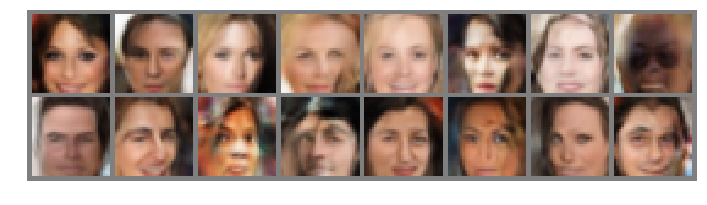

Epoch [   86/  150] | d_loss: 0.6424 | g_loss: 1.8883
Epoch [   86/  150] | d_loss: 0.7320 | g_loss: 1.1065
Epoch [   86/  150] | d_loss: 0.2770 | g_loss: 1.4812
Epoch [   86/  150] | d_loss: 0.7848 | g_loss: 1.0611
Epoch [   86/  150] | d_loss: 0.7032 | g_loss: 2.1261
Epoch [   86/  150] | d_loss: 1.0172 | g_loss: 2.3343
Epoch [   86/  150] | d_loss: 0.6947 | g_loss: 2.3011
Epoch [   86/  150] | d_loss: 0.7143 | g_loss: 1.9247
Epoch [   86/  150] | d_loss: 1.0488 | g_loss: 4.5835
Epoch [   86/  150] | d_loss: 0.6523 | g_loss: 2.3147
Epoch [   86/  150] | d_loss: 0.5446 | g_loss: 1.8414
Epoch [   86/  150] | d_loss: 0.8364 | g_loss: 2.4358
Epoch [   86/  150] | d_loss: 0.6626 | g_loss: 2.2130
Epoch [   86/  150] | d_loss: 0.9889 | g_loss: 2.9955
Epoch [   86/  150] | d_loss: 0.3898 | g_loss: 2.6982


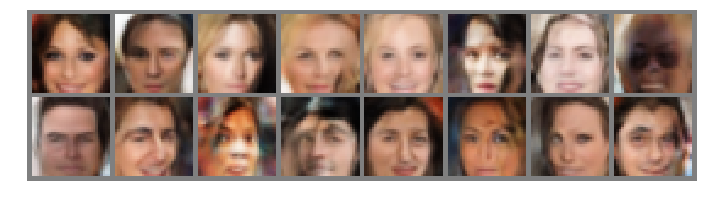

Epoch [   87/  150] | d_loss: 0.6548 | g_loss: 1.9721
Epoch [   87/  150] | d_loss: 0.1931 | g_loss: 0.9266
Epoch [   87/  150] | d_loss: 0.8546 | g_loss: 2.4307
Epoch [   87/  150] | d_loss: 0.4586 | g_loss: 1.8163
Epoch [   87/  150] | d_loss: 0.6222 | g_loss: 2.4678
Epoch [   87/  150] | d_loss: 0.9356 | g_loss: 1.8661
Epoch [   87/  150] | d_loss: 0.6419 | g_loss: 2.1213
Epoch [   87/  150] | d_loss: 0.8199 | g_loss: 1.7350
Epoch [   87/  150] | d_loss: 0.3108 | g_loss: 1.4929
Epoch [   87/  150] | d_loss: 0.6529 | g_loss: 1.5559
Epoch [   87/  150] | d_loss: 0.5636 | g_loss: 1.4036
Epoch [   87/  150] | d_loss: 0.5352 | g_loss: 2.2373
Epoch [   87/  150] | d_loss: 0.4703 | g_loss: 1.6281
Epoch [   87/  150] | d_loss: 0.8207 | g_loss: 2.1021
Epoch [   87/  150] | d_loss: 1.0860 | g_loss: 2.1551


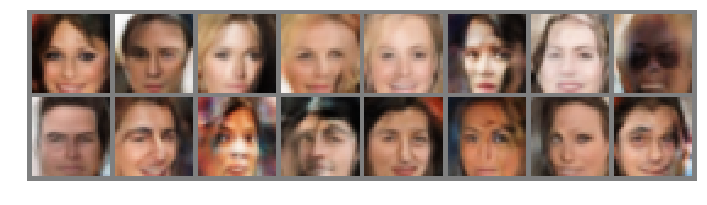

Epoch [   88/  150] | d_loss: 0.6753 | g_loss: 1.4136
Epoch [   88/  150] | d_loss: 0.3098 | g_loss: 1.9148
Epoch [   88/  150] | d_loss: 0.5638 | g_loss: 3.1393
Epoch [   88/  150] | d_loss: 0.7248 | g_loss: 2.1973
Epoch [   88/  150] | d_loss: 1.0903 | g_loss: 2.7016
Epoch [   88/  150] | d_loss: 1.2466 | g_loss: 2.9048
Epoch [   88/  150] | d_loss: 0.5349 | g_loss: 3.4871
Epoch [   88/  150] | d_loss: 0.6116 | g_loss: 2.3590
Epoch [   88/  150] | d_loss: 0.5442 | g_loss: 1.1184
Epoch [   88/  150] | d_loss: 0.6887 | g_loss: 1.9592
Epoch [   88/  150] | d_loss: 0.5458 | g_loss: 2.7383
Epoch [   88/  150] | d_loss: 0.8644 | g_loss: 0.6406
Epoch [   88/  150] | d_loss: 0.6902 | g_loss: 3.2170
Epoch [   88/  150] | d_loss: 0.5697 | g_loss: 1.7975
Epoch [   88/  150] | d_loss: 0.6752 | g_loss: 0.5824


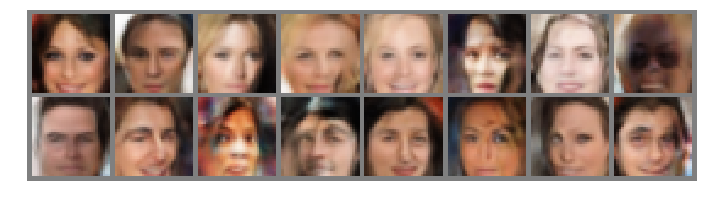

Epoch [   89/  150] | d_loss: 0.9040 | g_loss: 2.1780
Epoch [   89/  150] | d_loss: 0.6331 | g_loss: 1.8657
Epoch [   89/  150] | d_loss: 0.5823 | g_loss: 1.1812
Epoch [   89/  150] | d_loss: 0.4575 | g_loss: 2.9380
Epoch [   89/  150] | d_loss: 0.4165 | g_loss: 1.9772
Epoch [   89/  150] | d_loss: 0.4172 | g_loss: 2.5896
Epoch [   89/  150] | d_loss: 0.7958 | g_loss: 1.9407
Epoch [   89/  150] | d_loss: 0.9582 | g_loss: 2.0473
Epoch [   89/  150] | d_loss: 0.5555 | g_loss: 2.5401
Epoch [   89/  150] | d_loss: 0.4171 | g_loss: 2.0060
Epoch [   89/  150] | d_loss: 0.8681 | g_loss: 2.0034
Epoch [   89/  150] | d_loss: 0.7775 | g_loss: 2.8164
Epoch [   89/  150] | d_loss: 0.2951 | g_loss: 1.7429
Epoch [   89/  150] | d_loss: 0.7344 | g_loss: 1.1673
Epoch [   89/  150] | d_loss: 1.3572 | g_loss: 2.9259


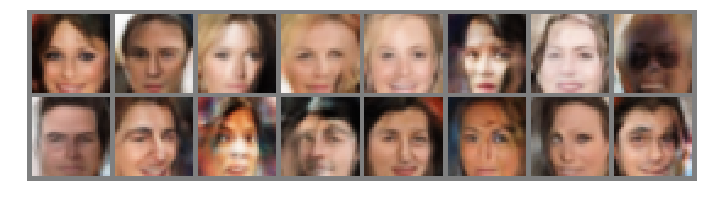

Epoch [   90/  150] | d_loss: 0.6483 | g_loss: 1.9088
Epoch [   90/  150] | d_loss: 0.3536 | g_loss: 1.2493
Epoch [   90/  150] | d_loss: 0.4889 | g_loss: 1.4668
Epoch [   90/  150] | d_loss: 0.7295 | g_loss: 1.6233
Epoch [   90/  150] | d_loss: 0.8259 | g_loss: 1.5443
Epoch [   90/  150] | d_loss: 0.6313 | g_loss: 2.3650
Epoch [   90/  150] | d_loss: 0.4832 | g_loss: 2.0036
Epoch [   90/  150] | d_loss: 0.4745 | g_loss: 2.5982
Epoch [   90/  150] | d_loss: 0.6209 | g_loss: 2.3650
Epoch [   90/  150] | d_loss: 0.2180 | g_loss: 2.4629
Epoch [   90/  150] | d_loss: 0.5898 | g_loss: 2.2387
Epoch [   90/  150] | d_loss: 0.5791 | g_loss: 2.1906
Epoch [   90/  150] | d_loss: 0.4332 | g_loss: 2.2361
Epoch [   90/  150] | d_loss: 1.1192 | g_loss: 2.0371
Epoch [   90/  150] | d_loss: 0.8238 | g_loss: 2.6507


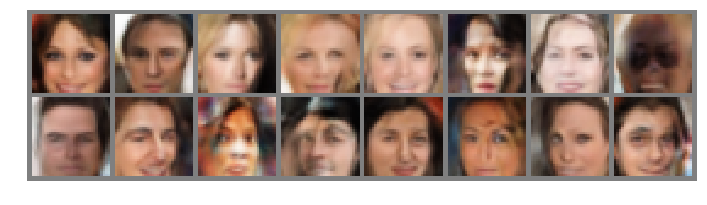

Epoch [   91/  150] | d_loss: 0.7147 | g_loss: 1.2762
Epoch [   91/  150] | d_loss: 1.3162 | g_loss: 2.4230
Epoch [   91/  150] | d_loss: 0.8608 | g_loss: 3.4203
Epoch [   91/  150] | d_loss: 0.5911 | g_loss: 3.1274
Epoch [   91/  150] | d_loss: 1.0019 | g_loss: 2.2647
Epoch [   91/  150] | d_loss: 0.6900 | g_loss: 1.9680
Epoch [   91/  150] | d_loss: 0.5141 | g_loss: 2.4334
Epoch [   91/  150] | d_loss: 1.0201 | g_loss: 2.0293
Epoch [   91/  150] | d_loss: 0.5093 | g_loss: 2.0363
Epoch [   91/  150] | d_loss: 0.5449 | g_loss: 2.1678
Epoch [   91/  150] | d_loss: 0.7657 | g_loss: 1.5854
Epoch [   91/  150] | d_loss: 0.6240 | g_loss: 3.8954
Epoch [   91/  150] | d_loss: 0.6135 | g_loss: 2.3505
Epoch [   91/  150] | d_loss: 0.5109 | g_loss: 0.9765
Epoch [   91/  150] | d_loss: 0.3187 | g_loss: 1.5399


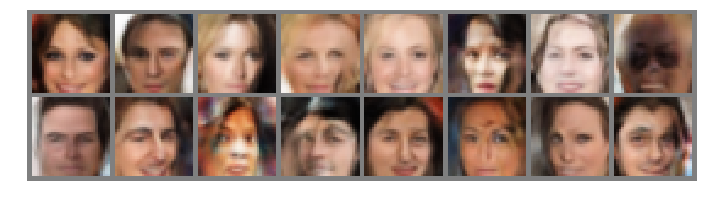

Epoch [   92/  150] | d_loss: 1.2938 | g_loss: 2.8004
Epoch [   92/  150] | d_loss: 0.5769 | g_loss: 2.2935
Epoch [   92/  150] | d_loss: 0.5117 | g_loss: 1.9401
Epoch [   92/  150] | d_loss: 0.4054 | g_loss: 1.9488
Epoch [   92/  150] | d_loss: 0.8868 | g_loss: 2.8701
Epoch [   92/  150] | d_loss: 0.8033 | g_loss: 2.9491
Epoch [   92/  150] | d_loss: 0.7277 | g_loss: 1.6897
Epoch [   92/  150] | d_loss: 0.6709 | g_loss: 2.1014
Epoch [   92/  150] | d_loss: 0.6060 | g_loss: 1.4343
Epoch [   92/  150] | d_loss: 0.7091 | g_loss: 1.7420
Epoch [   92/  150] | d_loss: 0.9588 | g_loss: 2.3057
Epoch [   92/  150] | d_loss: 0.8203 | g_loss: 3.4802
Epoch [   92/  150] | d_loss: 0.4442 | g_loss: 2.1584
Epoch [   92/  150] | d_loss: 1.1656 | g_loss: 1.5239
Epoch [   92/  150] | d_loss: 1.4029 | g_loss: 1.3579


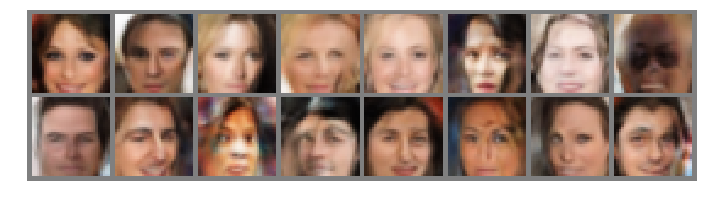

Epoch [   93/  150] | d_loss: 0.5272 | g_loss: 2.1730
Epoch [   93/  150] | d_loss: 0.4931 | g_loss: 3.6792
Epoch [   93/  150] | d_loss: 0.5800 | g_loss: 2.5701
Epoch [   93/  150] | d_loss: 1.0316 | g_loss: 2.4338
Epoch [   93/  150] | d_loss: 0.8412 | g_loss: 1.7490
Epoch [   93/  150] | d_loss: 0.9726 | g_loss: 3.3379
Epoch [   93/  150] | d_loss: 0.5044 | g_loss: 1.8690
Epoch [   93/  150] | d_loss: 0.7496 | g_loss: 1.3465
Epoch [   93/  150] | d_loss: 0.6832 | g_loss: 1.4183
Epoch [   93/  150] | d_loss: 0.3587 | g_loss: 1.9176
Epoch [   93/  150] | d_loss: 0.6152 | g_loss: 1.2851
Epoch [   93/  150] | d_loss: 0.7607 | g_loss: 2.0016
Epoch [   93/  150] | d_loss: 0.4568 | g_loss: 2.4287
Epoch [   93/  150] | d_loss: 0.5565 | g_loss: 2.4691
Epoch [   93/  150] | d_loss: 0.8398 | g_loss: 2.7921


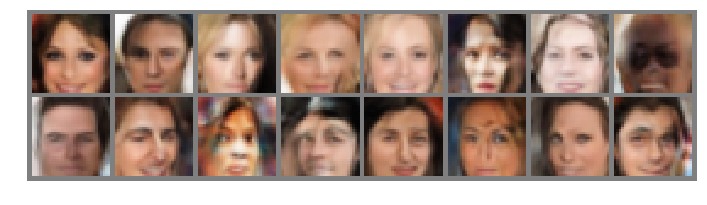

Epoch [   94/  150] | d_loss: 0.8885 | g_loss: 1.4580
Epoch [   94/  150] | d_loss: 0.4590 | g_loss: 1.1209
Epoch [   94/  150] | d_loss: 0.5598 | g_loss: 1.4560
Epoch [   94/  150] | d_loss: 0.6299 | g_loss: 3.1108
Epoch [   94/  150] | d_loss: 0.7650 | g_loss: 2.7068
Epoch [   94/  150] | d_loss: 0.8882 | g_loss: 1.6160
Epoch [   94/  150] | d_loss: 0.6578 | g_loss: 3.9198
Epoch [   94/  150] | d_loss: 0.7699 | g_loss: 1.1921
Epoch [   94/  150] | d_loss: 0.7557 | g_loss: 1.9962
Epoch [   94/  150] | d_loss: 1.0931 | g_loss: 0.9323
Epoch [   94/  150] | d_loss: 0.4685 | g_loss: 3.5550
Epoch [   94/  150] | d_loss: 0.8507 | g_loss: 1.5942
Epoch [   94/  150] | d_loss: 0.9055 | g_loss: 1.8630
Epoch [   94/  150] | d_loss: 0.7020 | g_loss: 2.7762
Epoch [   94/  150] | d_loss: 0.4917 | g_loss: 1.0827


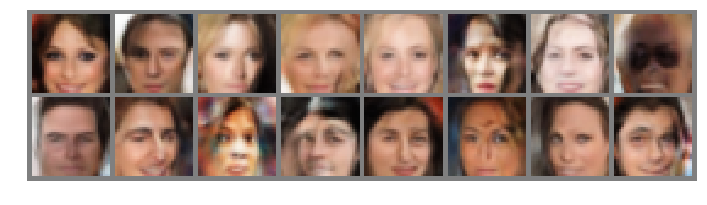

Epoch [   95/  150] | d_loss: 0.8705 | g_loss: 2.9538
Epoch [   95/  150] | d_loss: 0.3513 | g_loss: 2.1630
Epoch [   95/  150] | d_loss: 0.5389 | g_loss: 1.2036
Epoch [   95/  150] | d_loss: 0.8510 | g_loss: 0.9401
Epoch [   95/  150] | d_loss: 0.6759 | g_loss: 2.3426
Epoch [   95/  150] | d_loss: 0.3337 | g_loss: 2.4306
Epoch [   95/  150] | d_loss: 1.1120 | g_loss: 1.6994
Epoch [   95/  150] | d_loss: 0.9467 | g_loss: 1.5123
Epoch [   95/  150] | d_loss: 0.4447 | g_loss: 2.8508
Epoch [   95/  150] | d_loss: 0.5060 | g_loss: 2.2140
Epoch [   95/  150] | d_loss: 0.7052 | g_loss: 3.1033
Epoch [   95/  150] | d_loss: 0.4312 | g_loss: 2.5891
Epoch [   95/  150] | d_loss: 0.5080 | g_loss: 3.6421
Epoch [   95/  150] | d_loss: 0.8303 | g_loss: 3.1786
Epoch [   95/  150] | d_loss: 0.8649 | g_loss: 3.9212


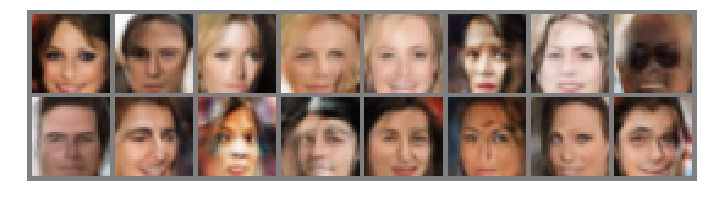

Epoch [   96/  150] | d_loss: 0.4434 | g_loss: 1.9211
Epoch [   96/  150] | d_loss: 0.5243 | g_loss: 3.0775
Epoch [   96/  150] | d_loss: 0.3168 | g_loss: 2.7271
Epoch [   96/  150] | d_loss: 0.5036 | g_loss: 1.1765
Epoch [   96/  150] | d_loss: 0.4521 | g_loss: 2.3306
Epoch [   96/  150] | d_loss: 0.7888 | g_loss: 2.1776
Epoch [   96/  150] | d_loss: 1.0371 | g_loss: 2.3572
Epoch [   96/  150] | d_loss: 0.4606 | g_loss: 1.5571
Epoch [   96/  150] | d_loss: 0.3218 | g_loss: 1.2899
Epoch [   96/  150] | d_loss: 0.6216 | g_loss: 2.5929
Epoch [   96/  150] | d_loss: 0.4944 | g_loss: 2.7998
Epoch [   96/  150] | d_loss: 0.5208 | g_loss: 2.9187
Epoch [   96/  150] | d_loss: 0.6160 | g_loss: 2.4178
Epoch [   96/  150] | d_loss: 0.5796 | g_loss: 2.6889
Epoch [   96/  150] | d_loss: 1.1613 | g_loss: 1.7266


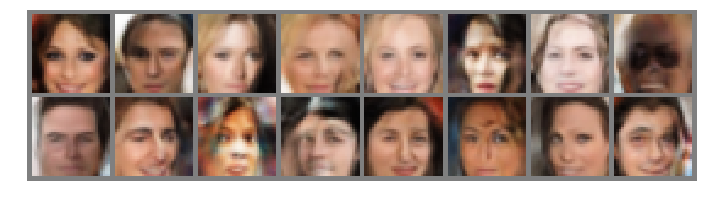

Epoch [   97/  150] | d_loss: 0.4464 | g_loss: 2.2834
Epoch [   97/  150] | d_loss: 0.4366 | g_loss: 2.2424
Epoch [   97/  150] | d_loss: 0.5463 | g_loss: 2.0397
Epoch [   97/  150] | d_loss: 0.3888 | g_loss: 1.6712
Epoch [   97/  150] | d_loss: 0.2605 | g_loss: 1.8428
Epoch [   97/  150] | d_loss: 0.5853 | g_loss: 2.1807
Epoch [   97/  150] | d_loss: 1.3215 | g_loss: 0.8702
Epoch [   97/  150] | d_loss: 1.0652 | g_loss: 2.6381
Epoch [   97/  150] | d_loss: 0.2659 | g_loss: 3.0576
Epoch [   97/  150] | d_loss: 0.9931 | g_loss: 1.6080
Epoch [   97/  150] | d_loss: 0.7239 | g_loss: 1.4175
Epoch [   97/  150] | d_loss: 0.3215 | g_loss: 4.1386
Epoch [   97/  150] | d_loss: 0.4984 | g_loss: 2.6592
Epoch [   97/  150] | d_loss: 0.8321 | g_loss: 1.8323
Epoch [   97/  150] | d_loss: 0.7346 | g_loss: 1.5838


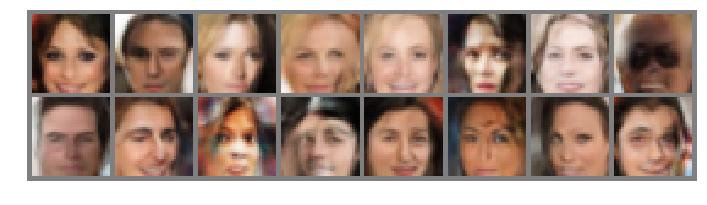

Epoch [   98/  150] | d_loss: 0.4394 | g_loss: 2.7612
Epoch [   98/  150] | d_loss: 0.8084 | g_loss: 2.1629
Epoch [   98/  150] | d_loss: 0.8047 | g_loss: 2.0292
Epoch [   98/  150] | d_loss: 0.3379 | g_loss: 2.0661
Epoch [   98/  150] | d_loss: 0.3421 | g_loss: 2.2662
Epoch [   98/  150] | d_loss: 0.6057 | g_loss: 2.2290
Epoch [   98/  150] | d_loss: 0.5198 | g_loss: 1.5146
Epoch [   98/  150] | d_loss: 1.0622 | g_loss: 3.5923
Epoch [   98/  150] | d_loss: 0.6201 | g_loss: 2.2288
Epoch [   98/  150] | d_loss: 0.5469 | g_loss: 2.6765
Epoch [   98/  150] | d_loss: 0.7945 | g_loss: 3.4881
Epoch [   98/  150] | d_loss: 0.6769 | g_loss: 3.4788
Epoch [   98/  150] | d_loss: 0.3243 | g_loss: 1.6630
Epoch [   98/  150] | d_loss: 0.7088 | g_loss: 1.6728
Epoch [   98/  150] | d_loss: 0.8886 | g_loss: 1.6186


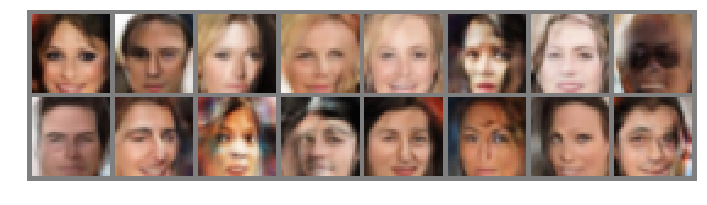

Epoch [   99/  150] | d_loss: 0.8001 | g_loss: 2.1244
Epoch [   99/  150] | d_loss: 0.3208 | g_loss: 1.2084
Epoch [   99/  150] | d_loss: 0.6875 | g_loss: 2.7866
Epoch [   99/  150] | d_loss: 0.3034 | g_loss: 2.2957
Epoch [   99/  150] | d_loss: 0.6146 | g_loss: 1.5466
Epoch [   99/  150] | d_loss: 0.4679 | g_loss: 1.2983
Epoch [   99/  150] | d_loss: 1.0658 | g_loss: 1.5272
Epoch [   99/  150] | d_loss: 0.1847 | g_loss: 1.9467
Epoch [   99/  150] | d_loss: 0.4773 | g_loss: 2.5795
Epoch [   99/  150] | d_loss: 0.6871 | g_loss: 2.3968
Epoch [   99/  150] | d_loss: 0.2058 | g_loss: 1.0874
Epoch [   99/  150] | d_loss: 0.6342 | g_loss: 1.7264
Epoch [   99/  150] | d_loss: 0.4644 | g_loss: 2.4615
Epoch [   99/  150] | d_loss: 0.3238 | g_loss: 1.6047
Epoch [   99/  150] | d_loss: 0.8824 | g_loss: 4.1151


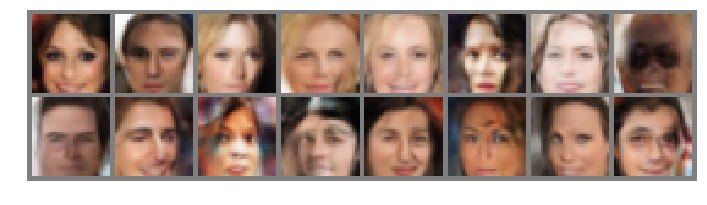

Epoch [  100/  150] | d_loss: 0.3101 | g_loss: 2.7103
Epoch [  100/  150] | d_loss: 0.3130 | g_loss: 3.3449
Epoch [  100/  150] | d_loss: 0.6446 | g_loss: 1.8125
Epoch [  100/  150] | d_loss: 0.7239 | g_loss: 1.2902
Epoch [  100/  150] | d_loss: 0.4269 | g_loss: 1.2768
Epoch [  100/  150] | d_loss: 0.7038 | g_loss: 2.2157
Epoch [  100/  150] | d_loss: 0.4530 | g_loss: 1.5208
Epoch [  100/  150] | d_loss: 0.5397 | g_loss: 1.4004
Epoch [  100/  150] | d_loss: 0.6963 | g_loss: 2.3580
Epoch [  100/  150] | d_loss: 0.4614 | g_loss: 0.8678
Epoch [  100/  150] | d_loss: 0.6600 | g_loss: 2.7227
Epoch [  100/  150] | d_loss: 0.4585 | g_loss: 3.1471
Epoch [  100/  150] | d_loss: 0.3402 | g_loss: 2.2041
Epoch [  100/  150] | d_loss: 0.4195 | g_loss: 2.0482
Epoch [  100/  150] | d_loss: 0.6957 | g_loss: 1.9167


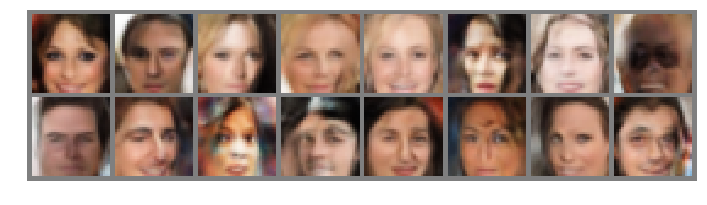

Epoch [  101/  150] | d_loss: 0.4782 | g_loss: 1.5106
Epoch [  101/  150] | d_loss: 0.4747 | g_loss: 2.2944
Epoch [  101/  150] | d_loss: 0.5942 | g_loss: 2.1011
Epoch [  101/  150] | d_loss: 0.8485 | g_loss: 1.6515
Epoch [  101/  150] | d_loss: 1.1501 | g_loss: 0.5015
Epoch [  101/  150] | d_loss: 0.2772 | g_loss: 2.6414
Epoch [  101/  150] | d_loss: 0.5565 | g_loss: 2.0761
Epoch [  101/  150] | d_loss: 0.2154 | g_loss: 1.0670
Epoch [  101/  150] | d_loss: 0.6089 | g_loss: 2.7404
Epoch [  101/  150] | d_loss: 0.4875 | g_loss: 1.9311
Epoch [  101/  150] | d_loss: 0.4610 | g_loss: 2.4703
Epoch [  101/  150] | d_loss: 0.3707 | g_loss: 2.1488
Epoch [  101/  150] | d_loss: 0.4042 | g_loss: 2.7528
Epoch [  101/  150] | d_loss: 0.9330 | g_loss: 2.1684
Epoch [  101/  150] | d_loss: 1.2411 | g_loss: 3.5038


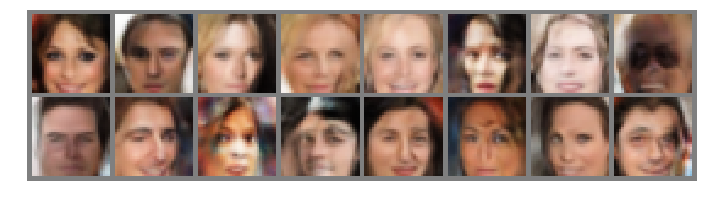

Epoch [  102/  150] | d_loss: 0.4573 | g_loss: 1.5735
Epoch [  102/  150] | d_loss: 0.6472 | g_loss: 2.6380
Epoch [  102/  150] | d_loss: 0.6590 | g_loss: 1.3393
Epoch [  102/  150] | d_loss: 0.9210 | g_loss: 2.7845
Epoch [  102/  150] | d_loss: 0.6641 | g_loss: 4.6232
Epoch [  102/  150] | d_loss: 0.3905 | g_loss: 2.3113
Epoch [  102/  150] | d_loss: 0.4504 | g_loss: 3.0697
Epoch [  102/  150] | d_loss: 0.6600 | g_loss: 1.8472
Epoch [  102/  150] | d_loss: 1.8271 | g_loss: 1.7434
Epoch [  102/  150] | d_loss: 0.5725 | g_loss: 1.1587
Epoch [  102/  150] | d_loss: 0.7967 | g_loss: 2.1272
Epoch [  102/  150] | d_loss: 0.7355 | g_loss: 1.6783
Epoch [  102/  150] | d_loss: 0.7646 | g_loss: 2.8300
Epoch [  102/  150] | d_loss: 0.5464 | g_loss: 2.8132
Epoch [  102/  150] | d_loss: 0.6355 | g_loss: 3.3585


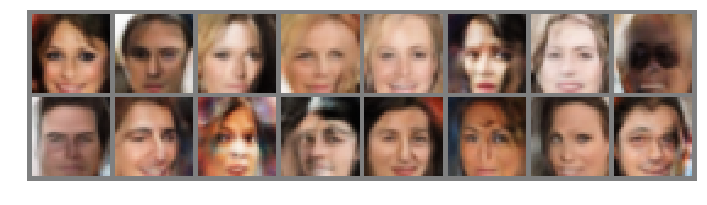

Epoch [  103/  150] | d_loss: 1.3423 | g_loss: 2.0456
Epoch [  103/  150] | d_loss: 0.6583 | g_loss: 2.0861
Epoch [  103/  150] | d_loss: 0.3930 | g_loss: 3.6172
Epoch [  103/  150] | d_loss: 0.8391 | g_loss: 1.4000
Epoch [  103/  150] | d_loss: 0.2336 | g_loss: 1.6703
Epoch [  103/  150] | d_loss: 0.2265 | g_loss: 2.0207
Epoch [  103/  150] | d_loss: 0.5824 | g_loss: 3.2817
Epoch [  103/  150] | d_loss: 0.5446 | g_loss: 2.9114
Epoch [  103/  150] | d_loss: 0.4226 | g_loss: 1.9323
Epoch [  103/  150] | d_loss: 0.7659 | g_loss: 2.7537
Epoch [  103/  150] | d_loss: 0.6418 | g_loss: 2.8469
Epoch [  103/  150] | d_loss: 0.5623 | g_loss: 2.3446
Epoch [  103/  150] | d_loss: 0.2296 | g_loss: 3.9929
Epoch [  103/  150] | d_loss: 0.5960 | g_loss: 2.7885
Epoch [  103/  150] | d_loss: 0.5301 | g_loss: 2.4971


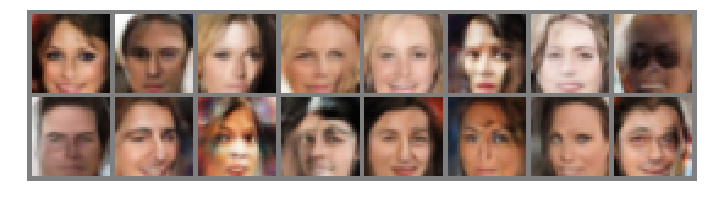

Epoch [  104/  150] | d_loss: 0.6414 | g_loss: 1.2186
Epoch [  104/  150] | d_loss: 0.4819 | g_loss: 3.6384
Epoch [  104/  150] | d_loss: 0.5288 | g_loss: 0.7596
Epoch [  104/  150] | d_loss: 0.4317 | g_loss: 1.2441
Epoch [  104/  150] | d_loss: 0.3403 | g_loss: 1.5186
Epoch [  104/  150] | d_loss: 0.3810 | g_loss: 2.1794
Epoch [  104/  150] | d_loss: 0.5975 | g_loss: 1.5439
Epoch [  104/  150] | d_loss: 0.7030 | g_loss: 3.3325
Epoch [  104/  150] | d_loss: 0.2305 | g_loss: 1.3247
Epoch [  104/  150] | d_loss: 0.2811 | g_loss: 3.3473
Epoch [  104/  150] | d_loss: 0.6995 | g_loss: 2.4527
Epoch [  104/  150] | d_loss: 0.3864 | g_loss: 1.9316
Epoch [  104/  150] | d_loss: 1.7913 | g_loss: 1.0418
Epoch [  104/  150] | d_loss: 0.1853 | g_loss: 1.6337
Epoch [  104/  150] | d_loss: 0.5614 | g_loss: 1.7102


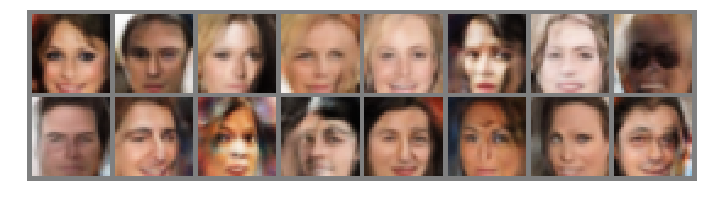

Epoch [  105/  150] | d_loss: 0.8485 | g_loss: 1.4442
Epoch [  105/  150] | d_loss: 0.6621 | g_loss: 2.6376
Epoch [  105/  150] | d_loss: 0.3957 | g_loss: 2.5080
Epoch [  105/  150] | d_loss: 0.6202 | g_loss: 1.6990
Epoch [  105/  150] | d_loss: 0.5914 | g_loss: 1.5223
Epoch [  105/  150] | d_loss: 0.4134 | g_loss: 2.0038
Epoch [  105/  150] | d_loss: 0.7395 | g_loss: 2.1479
Epoch [  105/  150] | d_loss: 0.4989 | g_loss: 3.2415
Epoch [  105/  150] | d_loss: 0.7334 | g_loss: 1.8003
Epoch [  105/  150] | d_loss: 0.4681 | g_loss: 2.1771
Epoch [  105/  150] | d_loss: 0.9830 | g_loss: 2.4292
Epoch [  105/  150] | d_loss: 0.5971 | g_loss: 1.4254
Epoch [  105/  150] | d_loss: 0.6783 | g_loss: 1.9685
Epoch [  105/  150] | d_loss: 1.2030 | g_loss: 3.3475
Epoch [  105/  150] | d_loss: 0.3490 | g_loss: 3.6398


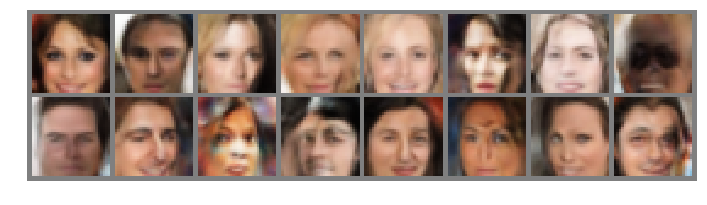

Epoch [  106/  150] | d_loss: 0.5698 | g_loss: 1.8572
Epoch [  106/  150] | d_loss: 0.5896 | g_loss: 2.5283
Epoch [  106/  150] | d_loss: 0.7087 | g_loss: 2.5854
Epoch [  106/  150] | d_loss: 0.9761 | g_loss: 1.7339
Epoch [  106/  150] | d_loss: 0.5186 | g_loss: 3.6889
Epoch [  106/  150] | d_loss: 0.3870 | g_loss: 2.4266
Epoch [  106/  150] | d_loss: 0.3988 | g_loss: 2.4269
Epoch [  106/  150] | d_loss: 0.7848 | g_loss: 1.3906
Epoch [  106/  150] | d_loss: 0.4605 | g_loss: 2.6754
Epoch [  106/  150] | d_loss: 0.6929 | g_loss: 2.0028
Epoch [  106/  150] | d_loss: 0.4466 | g_loss: 2.3147
Epoch [  106/  150] | d_loss: 0.6669 | g_loss: 2.2174
Epoch [  106/  150] | d_loss: 0.7524 | g_loss: 2.8348
Epoch [  106/  150] | d_loss: 1.0785 | g_loss: 2.2948
Epoch [  106/  150] | d_loss: 0.9527 | g_loss: 1.5674


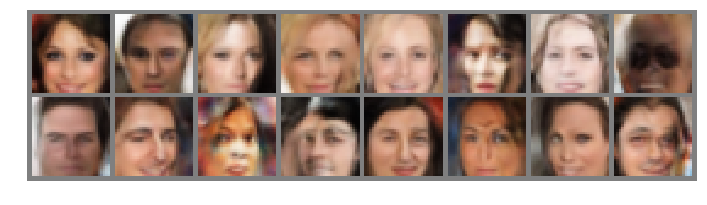

Epoch [  107/  150] | d_loss: 0.4911 | g_loss: 3.7537
Epoch [  107/  150] | d_loss: 0.2910 | g_loss: 1.7237
Epoch [  107/  150] | d_loss: 0.4604 | g_loss: 1.6453
Epoch [  107/  150] | d_loss: 0.6213 | g_loss: 1.8112
Epoch [  107/  150] | d_loss: 0.7491 | g_loss: 2.3273
Epoch [  107/  150] | d_loss: 0.4157 | g_loss: 1.5039
Epoch [  107/  150] | d_loss: 0.4560 | g_loss: 2.5207
Epoch [  107/  150] | d_loss: 0.9443 | g_loss: 1.2825
Epoch [  107/  150] | d_loss: 0.2721 | g_loss: 2.9044
Epoch [  107/  150] | d_loss: 0.4854 | g_loss: 2.2568
Epoch [  107/  150] | d_loss: 0.6352 | g_loss: 1.7566
Epoch [  107/  150] | d_loss: 0.4661 | g_loss: 2.3410
Epoch [  107/  150] | d_loss: 1.2309 | g_loss: 1.9271
Epoch [  107/  150] | d_loss: 0.4060 | g_loss: 3.2585
Epoch [  107/  150] | d_loss: 0.9541 | g_loss: 3.2587


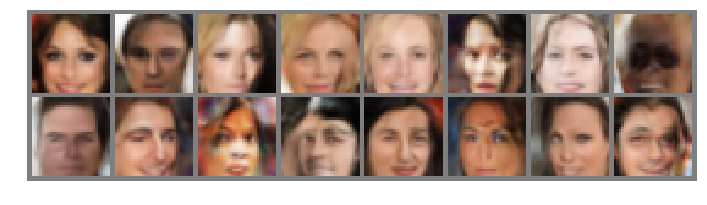

Epoch [  108/  150] | d_loss: 0.5098 | g_loss: 2.1034
Epoch [  108/  150] | d_loss: 0.7545 | g_loss: 3.4423
Epoch [  108/  150] | d_loss: 0.5029 | g_loss: 3.2950
Epoch [  108/  150] | d_loss: 0.7780 | g_loss: 2.9216
Epoch [  108/  150] | d_loss: 0.3958 | g_loss: 1.7738
Epoch [  108/  150] | d_loss: 0.5037 | g_loss: 3.7862
Epoch [  108/  150] | d_loss: 0.3486 | g_loss: 1.4862
Epoch [  108/  150] | d_loss: 1.0052 | g_loss: 3.8800
Epoch [  108/  150] | d_loss: 0.2311 | g_loss: 1.1078
Epoch [  108/  150] | d_loss: 0.4036 | g_loss: 2.6429
Epoch [  108/  150] | d_loss: 0.3229 | g_loss: 3.5177
Epoch [  108/  150] | d_loss: 0.8038 | g_loss: 3.0192
Epoch [  108/  150] | d_loss: 0.5178 | g_loss: 1.9782
Epoch [  108/  150] | d_loss: 0.5520 | g_loss: 2.0833
Epoch [  108/  150] | d_loss: 0.6946 | g_loss: 2.5055


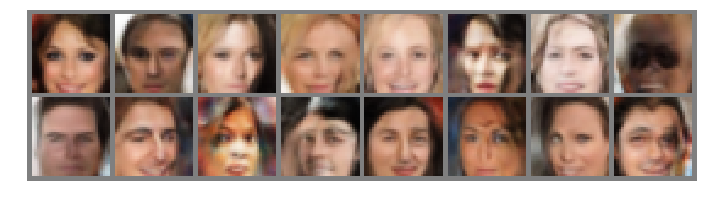

Epoch [  109/  150] | d_loss: 0.5827 | g_loss: 1.5004
Epoch [  109/  150] | d_loss: 0.7222 | g_loss: 1.9244
Epoch [  109/  150] | d_loss: 0.3192 | g_loss: 2.1311
Epoch [  109/  150] | d_loss: 0.4848 | g_loss: 1.6667
Epoch [  109/  150] | d_loss: 0.5913 | g_loss: 3.2837
Epoch [  109/  150] | d_loss: 0.7162 | g_loss: 1.5696
Epoch [  109/  150] | d_loss: 0.4198 | g_loss: 3.5981
Epoch [  109/  150] | d_loss: 0.7631 | g_loss: 2.0284
Epoch [  109/  150] | d_loss: 0.9894 | g_loss: 0.9402
Epoch [  109/  150] | d_loss: 0.6041 | g_loss: 2.3129
Epoch [  109/  150] | d_loss: 0.4878 | g_loss: 2.9478
Epoch [  109/  150] | d_loss: 0.8537 | g_loss: 1.9534
Epoch [  109/  150] | d_loss: 0.6500 | g_loss: 3.7011
Epoch [  109/  150] | d_loss: 0.5010 | g_loss: 2.2621
Epoch [  109/  150] | d_loss: 0.6366 | g_loss: 4.5255


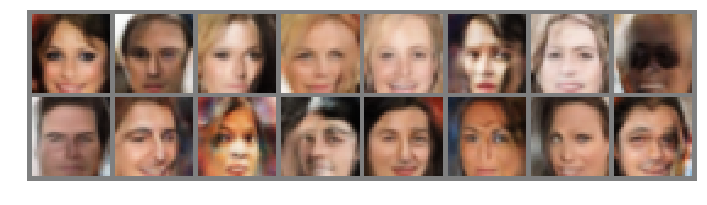

Epoch [  110/  150] | d_loss: 1.1729 | g_loss: 1.0567
Epoch [  110/  150] | d_loss: 0.2768 | g_loss: 1.6096
Epoch [  110/  150] | d_loss: 0.9198 | g_loss: 2.4877
Epoch [  110/  150] | d_loss: 0.3060 | g_loss: 1.8657
Epoch [  110/  150] | d_loss: 1.0183 | g_loss: 3.9008
Epoch [  110/  150] | d_loss: 0.8171 | g_loss: 3.5077
Epoch [  110/  150] | d_loss: 0.3405 | g_loss: 2.7233
Epoch [  110/  150] | d_loss: 0.7667 | g_loss: 1.3983
Epoch [  110/  150] | d_loss: 0.3939 | g_loss: 2.9365
Epoch [  110/  150] | d_loss: 0.3338 | g_loss: 1.5361
Epoch [  110/  150] | d_loss: 0.4002 | g_loss: 2.7589
Epoch [  110/  150] | d_loss: 0.3419 | g_loss: 3.3859
Epoch [  110/  150] | d_loss: 0.3800 | g_loss: 1.7957
Epoch [  110/  150] | d_loss: 0.4141 | g_loss: 2.2920
Epoch [  110/  150] | d_loss: 0.7631 | g_loss: 3.2880


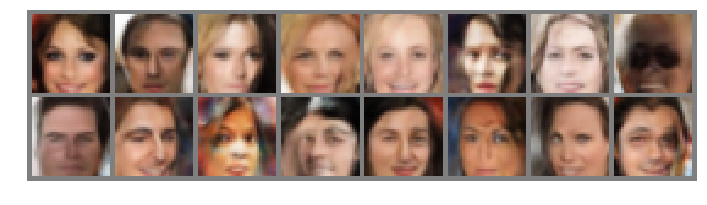

Epoch [  111/  150] | d_loss: 0.6648 | g_loss: 3.1721
Epoch [  111/  150] | d_loss: 1.9354 | g_loss: 1.5158
Epoch [  111/  150] | d_loss: 0.6430 | g_loss: 1.6226
Epoch [  111/  150] | d_loss: 0.3460 | g_loss: 2.0440
Epoch [  111/  150] | d_loss: 0.3947 | g_loss: 2.7722
Epoch [  111/  150] | d_loss: 0.5347 | g_loss: 3.3271
Epoch [  111/  150] | d_loss: 0.9472 | g_loss: 2.7460
Epoch [  111/  150] | d_loss: 0.7028 | g_loss: 1.2969
Epoch [  111/  150] | d_loss: 0.4992 | g_loss: 0.8024
Epoch [  111/  150] | d_loss: 0.5935 | g_loss: 1.0211
Epoch [  111/  150] | d_loss: 0.3761 | g_loss: 2.6895
Epoch [  111/  150] | d_loss: 0.3922 | g_loss: 1.9396
Epoch [  111/  150] | d_loss: 1.3209 | g_loss: 1.6876
Epoch [  111/  150] | d_loss: 0.2975 | g_loss: 2.4546
Epoch [  111/  150] | d_loss: 0.4629 | g_loss: 3.2063


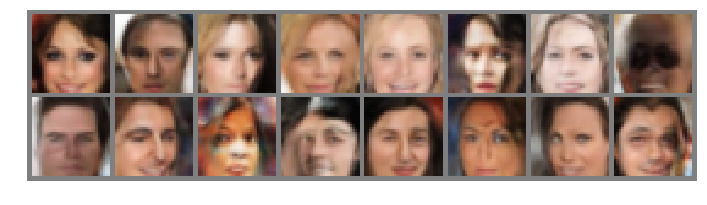

Epoch [  112/  150] | d_loss: 0.2815 | g_loss: 2.2170
Epoch [  112/  150] | d_loss: 0.2961 | g_loss: 3.2423
Epoch [  112/  150] | d_loss: 0.4592 | g_loss: 3.1453
Epoch [  112/  150] | d_loss: 0.3773 | g_loss: 1.4409
Epoch [  112/  150] | d_loss: 0.3491 | g_loss: 3.2849
Epoch [  112/  150] | d_loss: 0.1567 | g_loss: 2.0434
Epoch [  112/  150] | d_loss: 0.7720 | g_loss: 2.6191
Epoch [  112/  150] | d_loss: 0.7812 | g_loss: 0.9429
Epoch [  112/  150] | d_loss: 0.5161 | g_loss: 1.4632
Epoch [  112/  150] | d_loss: 0.3969 | g_loss: 2.4586
Epoch [  112/  150] | d_loss: 0.2822 | g_loss: 2.8488
Epoch [  112/  150] | d_loss: 0.3231 | g_loss: 2.4805
Epoch [  112/  150] | d_loss: 0.2635 | g_loss: 0.6803
Epoch [  112/  150] | d_loss: 0.5615 | g_loss: 2.6103
Epoch [  112/  150] | d_loss: 0.5544 | g_loss: 1.7194


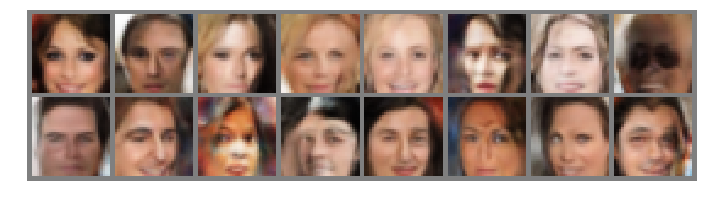

Epoch [  113/  150] | d_loss: 0.4738 | g_loss: 2.3963
Epoch [  113/  150] | d_loss: 0.5061 | g_loss: 2.0124
Epoch [  113/  150] | d_loss: 1.0011 | g_loss: 2.3383
Epoch [  113/  150] | d_loss: 0.5987 | g_loss: 3.1935
Epoch [  113/  150] | d_loss: 0.4978 | g_loss: 3.7865
Epoch [  113/  150] | d_loss: 0.6676 | g_loss: 2.7165
Epoch [  113/  150] | d_loss: 0.3119 | g_loss: 2.8776
Epoch [  113/  150] | d_loss: 0.4865 | g_loss: 1.7930
Epoch [  113/  150] | d_loss: 0.4958 | g_loss: 2.3888
Epoch [  113/  150] | d_loss: 0.4501 | g_loss: 1.9716
Epoch [  113/  150] | d_loss: 0.3128 | g_loss: 2.5334
Epoch [  113/  150] | d_loss: 0.5067 | g_loss: 2.0583
Epoch [  113/  150] | d_loss: 0.4547 | g_loss: 2.9851
Epoch [  113/  150] | d_loss: 0.2818 | g_loss: 2.3261
Epoch [  113/  150] | d_loss: 0.6103 | g_loss: 2.3205


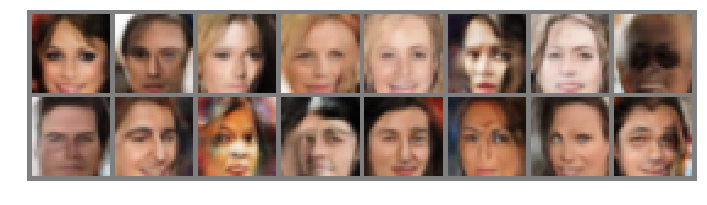

Epoch [  114/  150] | d_loss: 0.2800 | g_loss: 3.3151
Epoch [  114/  150] | d_loss: 0.5355 | g_loss: 1.5753
Epoch [  114/  150] | d_loss: 0.7113 | g_loss: 2.7781
Epoch [  114/  150] | d_loss: 0.2594 | g_loss: 3.2290
Epoch [  114/  150] | d_loss: 0.2822 | g_loss: 2.5342
Epoch [  114/  150] | d_loss: 0.2949 | g_loss: 1.9809
Epoch [  114/  150] | d_loss: 0.4445 | g_loss: 2.3927
Epoch [  114/  150] | d_loss: 0.4063 | g_loss: 2.1528
Epoch [  114/  150] | d_loss: 1.5538 | g_loss: 2.2150
Epoch [  114/  150] | d_loss: 0.3823 | g_loss: 3.6059
Epoch [  114/  150] | d_loss: 0.2868 | g_loss: 2.0265
Epoch [  114/  150] | d_loss: 0.2164 | g_loss: 2.0903
Epoch [  114/  150] | d_loss: 0.4919 | g_loss: 2.5553
Epoch [  114/  150] | d_loss: 0.5159 | g_loss: 2.9286
Epoch [  114/  150] | d_loss: 0.4873 | g_loss: 3.5179


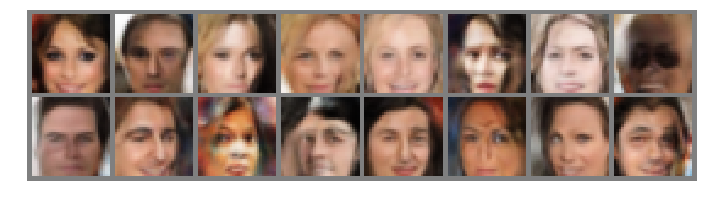

Epoch [  115/  150] | d_loss: 0.3375 | g_loss: 2.2725
Epoch [  115/  150] | d_loss: 0.2471 | g_loss: 2.5878
Epoch [  115/  150] | d_loss: 0.3626 | g_loss: 2.4349
Epoch [  115/  150] | d_loss: 0.3901 | g_loss: 3.6454
Epoch [  115/  150] | d_loss: 0.5257 | g_loss: 1.1369
Epoch [  115/  150] | d_loss: 0.7544 | g_loss: 1.9615
Epoch [  115/  150] | d_loss: 0.2242 | g_loss: 2.8662
Epoch [  115/  150] | d_loss: 0.4304 | g_loss: 2.2503
Epoch [  115/  150] | d_loss: 0.6699 | g_loss: 2.5230
Epoch [  115/  150] | d_loss: 0.5803 | g_loss: 2.8074
Epoch [  115/  150] | d_loss: 0.5660 | g_loss: 2.8870
Epoch [  115/  150] | d_loss: 0.5003 | g_loss: 2.9069
Epoch [  115/  150] | d_loss: 0.5213 | g_loss: 2.5227
Epoch [  115/  150] | d_loss: 1.1220 | g_loss: 2.2814
Epoch [  115/  150] | d_loss: 0.4463 | g_loss: 1.0715


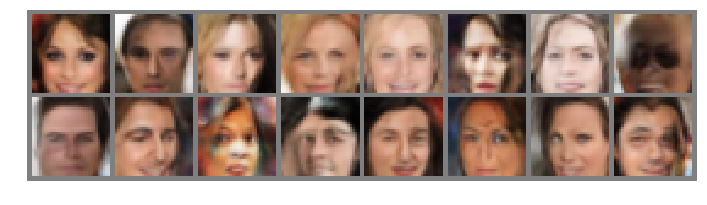

Epoch [  116/  150] | d_loss: 0.4141 | g_loss: 1.6972
Epoch [  116/  150] | d_loss: 0.6337 | g_loss: 2.2957
Epoch [  116/  150] | d_loss: 0.4710 | g_loss: 2.7590
Epoch [  116/  150] | d_loss: 0.3337 | g_loss: 1.3745
Epoch [  116/  150] | d_loss: 0.5134 | g_loss: 3.1743
Epoch [  116/  150] | d_loss: 0.3032 | g_loss: 3.0685
Epoch [  116/  150] | d_loss: 0.3747 | g_loss: 2.5708
Epoch [  116/  150] | d_loss: 0.5589 | g_loss: 1.0683
Epoch [  116/  150] | d_loss: 0.7392 | g_loss: 3.5530
Epoch [  116/  150] | d_loss: 0.3416 | g_loss: 4.0187
Epoch [  116/  150] | d_loss: 0.5747 | g_loss: 2.5911
Epoch [  116/  150] | d_loss: 0.2729 | g_loss: 2.4197
Epoch [  116/  150] | d_loss: 0.3706 | g_loss: 2.2334
Epoch [  116/  150] | d_loss: 0.2982 | g_loss: 4.4216
Epoch [  116/  150] | d_loss: 0.4175 | g_loss: 1.8085


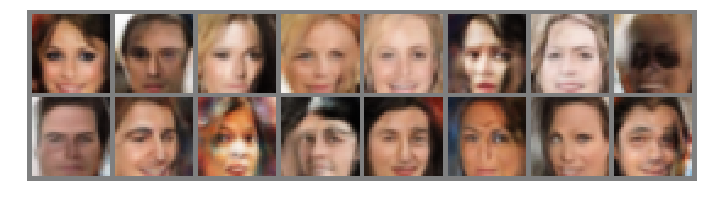

Epoch [  117/  150] | d_loss: 0.3885 | g_loss: 1.3956
Epoch [  117/  150] | d_loss: 0.3050 | g_loss: 1.0701
Epoch [  117/  150] | d_loss: 0.6789 | g_loss: 1.9666
Epoch [  117/  150] | d_loss: 0.7960 | g_loss: 4.0094
Epoch [  117/  150] | d_loss: 0.3090 | g_loss: 2.9607
Epoch [  117/  150] | d_loss: 1.5089 | g_loss: 0.6869
Epoch [  117/  150] | d_loss: 0.4680 | g_loss: 3.1186
Epoch [  117/  150] | d_loss: 0.6922 | g_loss: 3.1023
Epoch [  117/  150] | d_loss: 0.7125 | g_loss: 3.4769
Epoch [  117/  150] | d_loss: 0.3845 | g_loss: 1.4809
Epoch [  117/  150] | d_loss: 0.4877 | g_loss: 3.4789
Epoch [  117/  150] | d_loss: 0.1888 | g_loss: 4.2244
Epoch [  117/  150] | d_loss: 0.5735 | g_loss: 1.8682
Epoch [  117/  150] | d_loss: 1.3640 | g_loss: 2.6171
Epoch [  117/  150] | d_loss: 0.2154 | g_loss: 3.5600


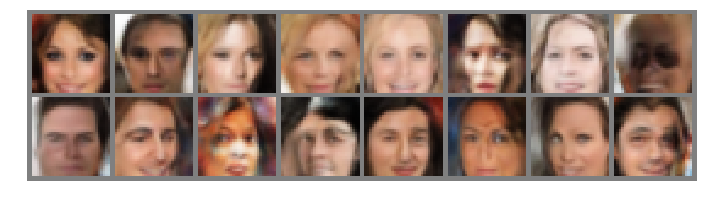

Epoch [  118/  150] | d_loss: 0.6923 | g_loss: 1.9095
Epoch [  118/  150] | d_loss: 0.5959 | g_loss: 1.6046
Epoch [  118/  150] | d_loss: 0.5785 | g_loss: 2.8298
Epoch [  118/  150] | d_loss: 0.5277 | g_loss: 2.9371
Epoch [  118/  150] | d_loss: 0.9071 | g_loss: 3.9850
Epoch [  118/  150] | d_loss: 0.3705 | g_loss: 2.5091
Epoch [  118/  150] | d_loss: 0.5954 | g_loss: 2.2148
Epoch [  118/  150] | d_loss: 0.6068 | g_loss: 3.0652
Epoch [  118/  150] | d_loss: 0.2323 | g_loss: 2.4063
Epoch [  118/  150] | d_loss: 0.9378 | g_loss: 3.9348
Epoch [  118/  150] | d_loss: 1.0629 | g_loss: 1.7440
Epoch [  118/  150] | d_loss: 0.2972 | g_loss: 2.2994
Epoch [  118/  150] | d_loss: 0.6765 | g_loss: 1.8657
Epoch [  118/  150] | d_loss: 0.3499 | g_loss: 2.5977
Epoch [  118/  150] | d_loss: 0.6487 | g_loss: 2.4940


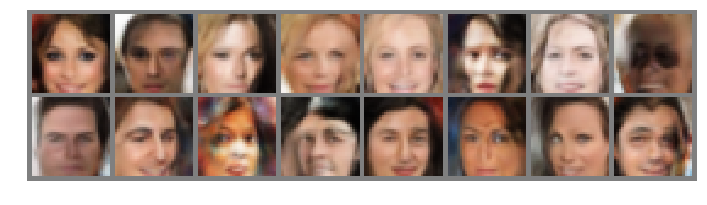

Epoch [  119/  150] | d_loss: 0.2880 | g_loss: 1.7361
Epoch [  119/  150] | d_loss: 0.4178 | g_loss: 2.7426
Epoch [  119/  150] | d_loss: 0.6925 | g_loss: 2.0612
Epoch [  119/  150] | d_loss: 0.7139 | g_loss: 2.2991
Epoch [  119/  150] | d_loss: 0.3916 | g_loss: 2.3467
Epoch [  119/  150] | d_loss: 0.3740 | g_loss: 3.3666
Epoch [  119/  150] | d_loss: 0.3139 | g_loss: 2.6643
Epoch [  119/  150] | d_loss: 0.2966 | g_loss: 2.3499
Epoch [  119/  150] | d_loss: 0.7415 | g_loss: 1.9959
Epoch [  119/  150] | d_loss: 0.6761 | g_loss: 2.7541
Epoch [  119/  150] | d_loss: 0.5341 | g_loss: 1.1584
Epoch [  119/  150] | d_loss: 0.2992 | g_loss: 2.8382
Epoch [  119/  150] | d_loss: 0.4946 | g_loss: 2.4872
Epoch [  119/  150] | d_loss: 0.6779 | g_loss: 3.1974
Epoch [  119/  150] | d_loss: 1.3602 | g_loss: 0.3469


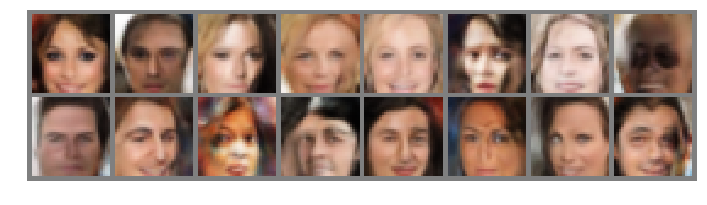

Epoch [  120/  150] | d_loss: 0.5944 | g_loss: 3.5120
Epoch [  120/  150] | d_loss: 1.0205 | g_loss: 3.4882
Epoch [  120/  150] | d_loss: 0.9096 | g_loss: 3.0681
Epoch [  120/  150] | d_loss: 0.7265 | g_loss: 3.1880
Epoch [  120/  150] | d_loss: 0.3320 | g_loss: 2.1758
Epoch [  120/  150] | d_loss: 0.2921 | g_loss: 1.4537
Epoch [  120/  150] | d_loss: 0.4024 | g_loss: 1.0025
Epoch [  120/  150] | d_loss: 0.6066 | g_loss: 1.4687
Epoch [  120/  150] | d_loss: 0.3526 | g_loss: 3.5691
Epoch [  120/  150] | d_loss: 0.5783 | g_loss: 3.6445
Epoch [  120/  150] | d_loss: 0.3558 | g_loss: 1.8935
Epoch [  120/  150] | d_loss: 0.4446 | g_loss: 1.8693
Epoch [  120/  150] | d_loss: 0.3160 | g_loss: 3.6325
Epoch [  120/  150] | d_loss: 0.6499 | g_loss: 3.6363
Epoch [  120/  150] | d_loss: 0.2929 | g_loss: 1.7006


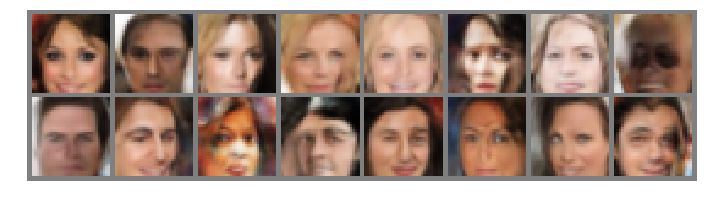

Epoch [  121/  150] | d_loss: 1.0331 | g_loss: 2.1361
Epoch [  121/  150] | d_loss: 0.2942 | g_loss: 2.7508
Epoch [  121/  150] | d_loss: 1.3769 | g_loss: 1.8168
Epoch [  121/  150] | d_loss: 0.3481 | g_loss: 2.7194
Epoch [  121/  150] | d_loss: 0.5082 | g_loss: 1.8375
Epoch [  121/  150] | d_loss: 0.6743 | g_loss: 3.6913
Epoch [  121/  150] | d_loss: 0.4533 | g_loss: 3.9620
Epoch [  121/  150] | d_loss: 0.3744 | g_loss: 1.6250
Epoch [  121/  150] | d_loss: 0.3828 | g_loss: 1.8861
Epoch [  121/  150] | d_loss: 0.3580 | g_loss: 2.3844
Epoch [  121/  150] | d_loss: 0.2744 | g_loss: 4.2021
Epoch [  121/  150] | d_loss: 0.5179 | g_loss: 0.8277
Epoch [  121/  150] | d_loss: 0.6984 | g_loss: 1.2345
Epoch [  121/  150] | d_loss: 0.3951 | g_loss: 2.1495
Epoch [  121/  150] | d_loss: 0.4274 | g_loss: 2.6497


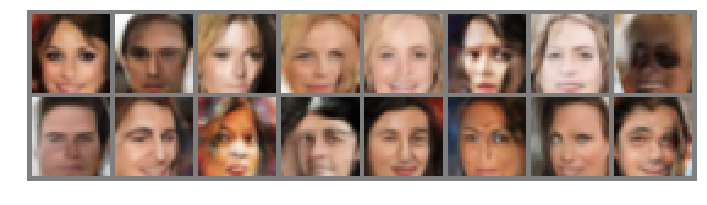

Epoch [  122/  150] | d_loss: 0.4317 | g_loss: 4.6276
Epoch [  122/  150] | d_loss: 0.7435 | g_loss: 2.0816
Epoch [  122/  150] | d_loss: 0.5677 | g_loss: 1.5275
Epoch [  122/  150] | d_loss: 0.4819 | g_loss: 2.5810
Epoch [  122/  150] | d_loss: 0.4356 | g_loss: 2.6323
Epoch [  122/  150] | d_loss: 1.2113 | g_loss: 1.4759
Epoch [  122/  150] | d_loss: 0.4828 | g_loss: 2.4067
Epoch [  122/  150] | d_loss: 1.2096 | g_loss: 2.2972
Epoch [  122/  150] | d_loss: 0.3926 | g_loss: 2.0073
Epoch [  122/  150] | d_loss: 0.4193 | g_loss: 2.5083
Epoch [  122/  150] | d_loss: 0.4715 | g_loss: 3.2372
Epoch [  122/  150] | d_loss: 0.3482 | g_loss: 3.4858
Epoch [  122/  150] | d_loss: 0.8135 | g_loss: 2.9754
Epoch [  122/  150] | d_loss: 0.2045 | g_loss: 3.3809
Epoch [  122/  150] | d_loss: 0.4102 | g_loss: 3.5597


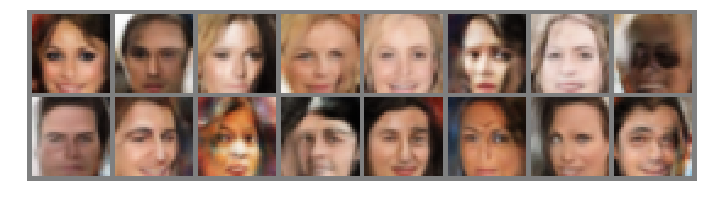

Epoch [  123/  150] | d_loss: 0.3205 | g_loss: 3.1574
Epoch [  123/  150] | d_loss: 0.5430 | g_loss: 3.8890
Epoch [  123/  150] | d_loss: 0.2703 | g_loss: 2.9462
Epoch [  123/  150] | d_loss: 0.6818 | g_loss: 2.7776
Epoch [  123/  150] | d_loss: 0.3002 | g_loss: 2.7717
Epoch [  123/  150] | d_loss: 0.6879 | g_loss: 2.5083
Epoch [  123/  150] | d_loss: 0.4841 | g_loss: 1.3090
Epoch [  123/  150] | d_loss: 0.2717 | g_loss: 3.0754
Epoch [  123/  150] | d_loss: 0.3435 | g_loss: 3.1229
Epoch [  123/  150] | d_loss: 0.4501 | g_loss: 1.0579
Epoch [  123/  150] | d_loss: 0.3937 | g_loss: 3.6174
Epoch [  123/  150] | d_loss: 0.4379 | g_loss: 2.4032
Epoch [  123/  150] | d_loss: 0.8512 | g_loss: 5.0479
Epoch [  123/  150] | d_loss: 0.2840 | g_loss: 2.2970
Epoch [  123/  150] | d_loss: 0.4354 | g_loss: 1.0362


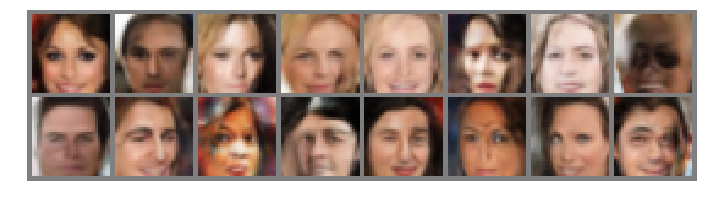

Epoch [  124/  150] | d_loss: 0.4862 | g_loss: 3.1613
Epoch [  124/  150] | d_loss: 0.5272 | g_loss: 2.5342
Epoch [  124/  150] | d_loss: 0.7602 | g_loss: 3.4024
Epoch [  124/  150] | d_loss: 0.6898 | g_loss: 3.3120
Epoch [  124/  150] | d_loss: 0.4680 | g_loss: 2.1427
Epoch [  124/  150] | d_loss: 0.6338 | g_loss: 2.8181
Epoch [  124/  150] | d_loss: 1.0788 | g_loss: 2.7898
Epoch [  124/  150] | d_loss: 0.2605 | g_loss: 5.2796
Epoch [  124/  150] | d_loss: 0.7306 | g_loss: 2.2290
Epoch [  124/  150] | d_loss: 0.2650 | g_loss: 1.9915
Epoch [  124/  150] | d_loss: 0.1396 | g_loss: 1.3047
Epoch [  124/  150] | d_loss: 0.6056 | g_loss: 1.8974
Epoch [  124/  150] | d_loss: 0.6641 | g_loss: 6.0870
Epoch [  124/  150] | d_loss: 1.1956 | g_loss: 2.4825
Epoch [  124/  150] | d_loss: 0.5373 | g_loss: 1.8595


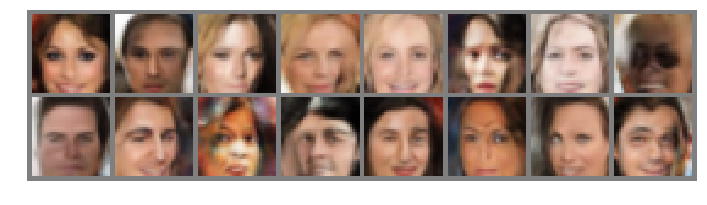

Epoch [  125/  150] | d_loss: 0.2443 | g_loss: 2.7446
Epoch [  125/  150] | d_loss: 0.3970 | g_loss: 3.1569
Epoch [  125/  150] | d_loss: 0.6112 | g_loss: 2.0069
Epoch [  125/  150] | d_loss: 0.4225 | g_loss: 2.9343
Epoch [  125/  150] | d_loss: 0.7059 | g_loss: 4.0296
Epoch [  125/  150] | d_loss: 0.9882 | g_loss: 3.9263
Epoch [  125/  150] | d_loss: 0.2500 | g_loss: 2.0221
Epoch [  125/  150] | d_loss: 0.4228 | g_loss: 1.5168
Epoch [  125/  150] | d_loss: 0.6799 | g_loss: 3.3081
Epoch [  125/  150] | d_loss: 1.0620 | g_loss: 1.6073
Epoch [  125/  150] | d_loss: 0.5780 | g_loss: 2.4802
Epoch [  125/  150] | d_loss: 0.3309 | g_loss: 4.6000
Epoch [  125/  150] | d_loss: 0.3682 | g_loss: 1.3681
Epoch [  125/  150] | d_loss: 0.9576 | g_loss: 2.2301
Epoch [  125/  150] | d_loss: 0.9415 | g_loss: 3.5558


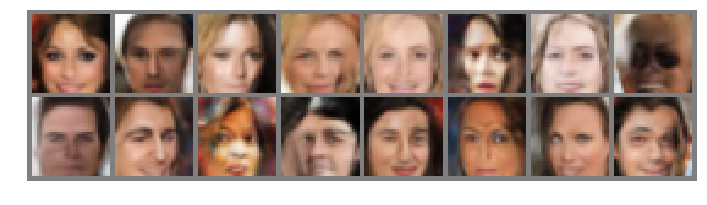

Epoch [  126/  150] | d_loss: 0.2915 | g_loss: 2.1305
Epoch [  126/  150] | d_loss: 1.1087 | g_loss: 3.0206
Epoch [  126/  150] | d_loss: 0.2262 | g_loss: 3.2360
Epoch [  126/  150] | d_loss: 0.4125 | g_loss: 4.4172
Epoch [  126/  150] | d_loss: 0.4015 | g_loss: 2.6001
Epoch [  126/  150] | d_loss: 0.4228 | g_loss: 4.9545
Epoch [  126/  150] | d_loss: 0.5517 | g_loss: 1.3013
Epoch [  126/  150] | d_loss: 0.9725 | g_loss: 3.0462
Epoch [  126/  150] | d_loss: 1.5594 | g_loss: 1.7332
Epoch [  126/  150] | d_loss: 0.5216 | g_loss: 1.7129
Epoch [  126/  150] | d_loss: 0.4566 | g_loss: 2.3198
Epoch [  126/  150] | d_loss: 0.2412 | g_loss: 3.1482
Epoch [  126/  150] | d_loss: 0.1643 | g_loss: 2.1402
Epoch [  126/  150] | d_loss: 0.3112 | g_loss: 2.2666
Epoch [  126/  150] | d_loss: 0.3168 | g_loss: 1.2982


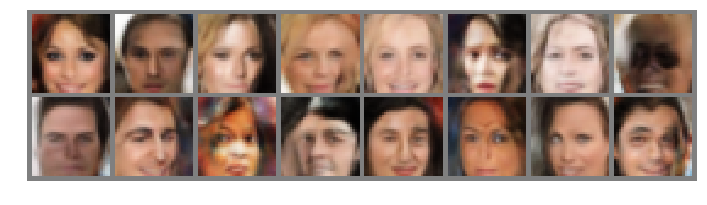

Epoch [  127/  150] | d_loss: 0.1853 | g_loss: 3.2049
Epoch [  127/  150] | d_loss: 0.3250 | g_loss: 2.7536
Epoch [  127/  150] | d_loss: 1.3132 | g_loss: 2.7908
Epoch [  127/  150] | d_loss: 0.1688 | g_loss: 2.6347
Epoch [  127/  150] | d_loss: 0.3010 | g_loss: 2.1589
Epoch [  127/  150] | d_loss: 0.5317 | g_loss: 2.5592
Epoch [  127/  150] | d_loss: 0.6010 | g_loss: 3.0379
Epoch [  127/  150] | d_loss: 0.4094 | g_loss: 1.5311
Epoch [  127/  150] | d_loss: 0.9325 | g_loss: 1.2883
Epoch [  127/  150] | d_loss: 0.4564 | g_loss: 3.3844
Epoch [  127/  150] | d_loss: 1.1020 | g_loss: 3.6583
Epoch [  127/  150] | d_loss: 0.2217 | g_loss: 2.5519
Epoch [  127/  150] | d_loss: 1.3016 | g_loss: 1.4932
Epoch [  127/  150] | d_loss: 0.3724 | g_loss: 1.9724
Epoch [  127/  150] | d_loss: 0.4427 | g_loss: 2.8745


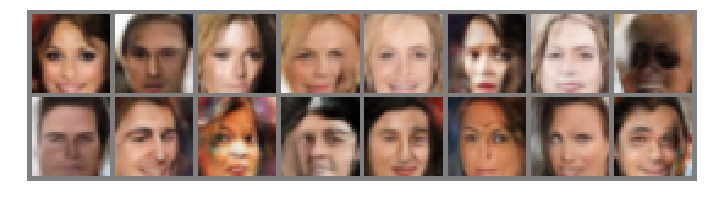

Epoch [  128/  150] | d_loss: 0.5840 | g_loss: 2.8105
Epoch [  128/  150] | d_loss: 0.2901 | g_loss: 2.6387
Epoch [  128/  150] | d_loss: 0.5059 | g_loss: 1.9105
Epoch [  128/  150] | d_loss: 0.3275 | g_loss: 2.9168
Epoch [  128/  150] | d_loss: 0.6459 | g_loss: 2.1868
Epoch [  128/  150] | d_loss: 0.6855 | g_loss: 1.7601
Epoch [  128/  150] | d_loss: 0.7354 | g_loss: 2.2512
Epoch [  128/  150] | d_loss: 0.6523 | g_loss: 5.3510
Epoch [  128/  150] | d_loss: 0.4141 | g_loss: 2.9147
Epoch [  128/  150] | d_loss: 0.6249 | g_loss: 4.1591
Epoch [  128/  150] | d_loss: 0.5599 | g_loss: 2.1532
Epoch [  128/  150] | d_loss: 0.6958 | g_loss: 2.5791
Epoch [  128/  150] | d_loss: 0.5686 | g_loss: 3.0692
Epoch [  128/  150] | d_loss: 0.8196 | g_loss: 3.7475
Epoch [  128/  150] | d_loss: 0.5513 | g_loss: 3.3616


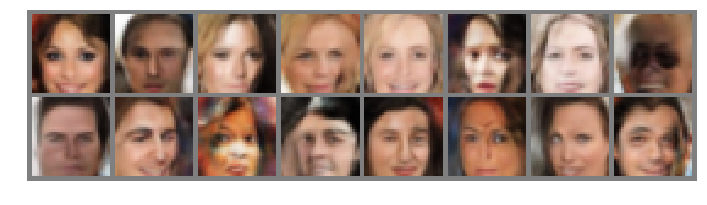

Epoch [  129/  150] | d_loss: 0.2869 | g_loss: 2.2892
Epoch [  129/  150] | d_loss: 0.1455 | g_loss: 1.4011
Epoch [  129/  150] | d_loss: 0.4198 | g_loss: 3.0563
Epoch [  129/  150] | d_loss: 0.5871 | g_loss: 3.5326
Epoch [  129/  150] | d_loss: 0.5335 | g_loss: 4.0200
Epoch [  129/  150] | d_loss: 0.5938 | g_loss: 2.2645
Epoch [  129/  150] | d_loss: 0.4753 | g_loss: 1.2259
Epoch [  129/  150] | d_loss: 0.3961 | g_loss: 2.1536
Epoch [  129/  150] | d_loss: 0.2370 | g_loss: 2.9003
Epoch [  129/  150] | d_loss: 0.4548 | g_loss: 2.9503
Epoch [  129/  150] | d_loss: 0.4022 | g_loss: 1.9328
Epoch [  129/  150] | d_loss: 0.6594 | g_loss: 1.8366
Epoch [  129/  150] | d_loss: 0.2403 | g_loss: 2.5719
Epoch [  129/  150] | d_loss: 0.3710 | g_loss: 3.6874
Epoch [  129/  150] | d_loss: 0.6602 | g_loss: 1.7703


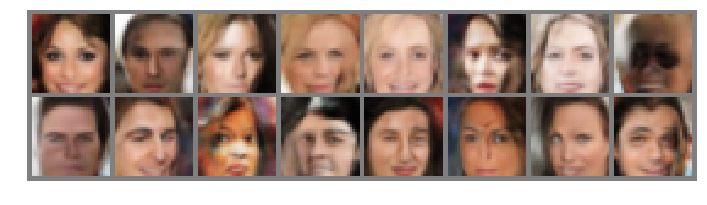

Epoch [  130/  150] | d_loss: 0.7567 | g_loss: 2.6149
Epoch [  130/  150] | d_loss: 0.1768 | g_loss: 2.4906
Epoch [  130/  150] | d_loss: 1.0916 | g_loss: 2.3283
Epoch [  130/  150] | d_loss: 0.2322 | g_loss: 3.5084
Epoch [  130/  150] | d_loss: 0.4211 | g_loss: 3.2525
Epoch [  130/  150] | d_loss: 0.6443 | g_loss: 2.7279
Epoch [  130/  150] | d_loss: 0.7748 | g_loss: 3.6706
Epoch [  130/  150] | d_loss: 0.5690 | g_loss: 1.4330
Epoch [  130/  150] | d_loss: 0.1480 | g_loss: 3.1187
Epoch [  130/  150] | d_loss: 0.1471 | g_loss: 3.0808
Epoch [  130/  150] | d_loss: 0.5435 | g_loss: 1.4675
Epoch [  130/  150] | d_loss: 0.6564 | g_loss: 3.9587
Epoch [  130/  150] | d_loss: 0.7053 | g_loss: 2.9599
Epoch [  130/  150] | d_loss: 0.6348 | g_loss: 1.0922
Epoch [  130/  150] | d_loss: 0.2604 | g_loss: 1.9174


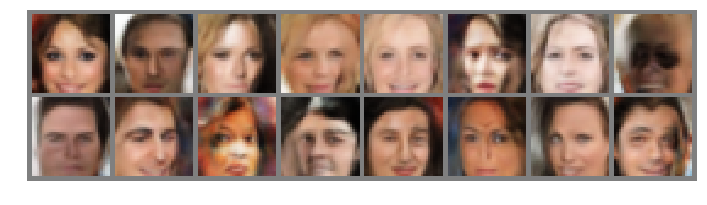

Epoch [  131/  150] | d_loss: 0.2935 | g_loss: 1.8611
Epoch [  131/  150] | d_loss: 0.1050 | g_loss: 2.7686
Epoch [  131/  150] | d_loss: 0.7373 | g_loss: 2.9942
Epoch [  131/  150] | d_loss: 0.3986 | g_loss: 2.5960
Epoch [  131/  150] | d_loss: 0.4227 | g_loss: 3.1982
Epoch [  131/  150] | d_loss: 0.6098 | g_loss: 2.8876
Epoch [  131/  150] | d_loss: 0.5472 | g_loss: 2.1106
Epoch [  131/  150] | d_loss: 0.8560 | g_loss: 3.6275
Epoch [  131/  150] | d_loss: 0.3368 | g_loss: 2.8992
Epoch [  131/  150] | d_loss: 0.5089 | g_loss: 4.2732
Epoch [  131/  150] | d_loss: 0.2698 | g_loss: 2.7986
Epoch [  131/  150] | d_loss: 0.3971 | g_loss: 1.9563
Epoch [  131/  150] | d_loss: 0.5511 | g_loss: 2.9630
Epoch [  131/  150] | d_loss: 0.3534 | g_loss: 3.3924
Epoch [  131/  150] | d_loss: 0.4565 | g_loss: 3.7078


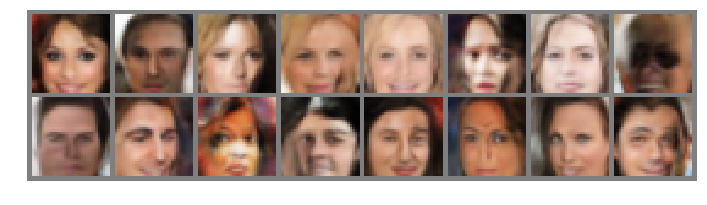

Epoch [  132/  150] | d_loss: 0.4410 | g_loss: 3.4779
Epoch [  132/  150] | d_loss: 0.5203 | g_loss: 1.8262
Epoch [  132/  150] | d_loss: 0.4497 | g_loss: 2.1501
Epoch [  132/  150] | d_loss: 0.4659 | g_loss: 1.8252
Epoch [  132/  150] | d_loss: 0.6247 | g_loss: 1.0996
Epoch [  132/  150] | d_loss: 0.4502 | g_loss: 3.3110
Epoch [  132/  150] | d_loss: 0.4194 | g_loss: 3.5010
Epoch [  132/  150] | d_loss: 0.4676 | g_loss: 1.6205
Epoch [  132/  150] | d_loss: 0.2040 | g_loss: 2.5456
Epoch [  132/  150] | d_loss: 0.8984 | g_loss: 2.6653
Epoch [  132/  150] | d_loss: 0.3514 | g_loss: 0.6422
Epoch [  132/  150] | d_loss: 0.6611 | g_loss: 1.4469
Epoch [  132/  150] | d_loss: 0.8101 | g_loss: 2.0867
Epoch [  132/  150] | d_loss: 0.7805 | g_loss: 2.8495
Epoch [  132/  150] | d_loss: 0.5323 | g_loss: 1.6347


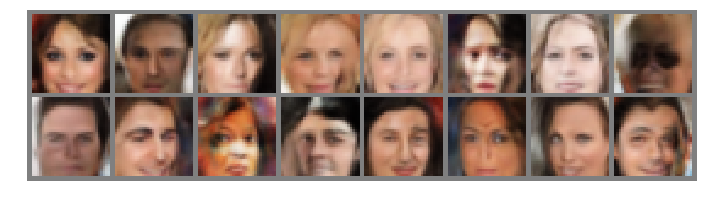

Epoch [  133/  150] | d_loss: 0.1881 | g_loss: 2.3240
Epoch [  133/  150] | d_loss: 0.6153 | g_loss: 1.6063
Epoch [  133/  150] | d_loss: 0.7572 | g_loss: 3.0324
Epoch [  133/  150] | d_loss: 0.8253 | g_loss: 2.8968
Epoch [  133/  150] | d_loss: 0.1844 | g_loss: 2.6339
Epoch [  133/  150] | d_loss: 0.1975 | g_loss: 1.3627
Epoch [  133/  150] | d_loss: 0.4260 | g_loss: 2.2407
Epoch [  133/  150] | d_loss: 0.5510 | g_loss: 3.4790
Epoch [  133/  150] | d_loss: 0.4574 | g_loss: 3.2415
Epoch [  133/  150] | d_loss: 0.3596 | g_loss: 4.0295
Epoch [  133/  150] | d_loss: 1.1620 | g_loss: 3.0669
Epoch [  133/  150] | d_loss: 0.5067 | g_loss: 2.0262
Epoch [  133/  150] | d_loss: 0.1719 | g_loss: 3.0063
Epoch [  133/  150] | d_loss: 0.7229 | g_loss: 3.0001
Epoch [  133/  150] | d_loss: 0.8185 | g_loss: 2.6942


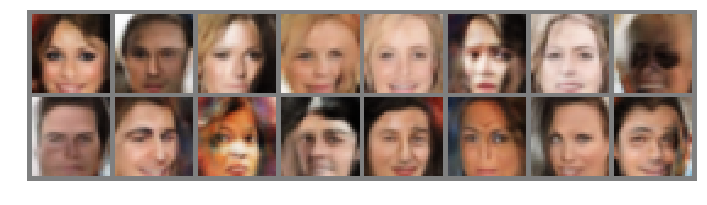

Epoch [  134/  150] | d_loss: 0.2262 | g_loss: 2.2735
Epoch [  134/  150] | d_loss: 0.5809 | g_loss: 2.7056
Epoch [  134/  150] | d_loss: 1.0638 | g_loss: 2.9314
Epoch [  134/  150] | d_loss: 0.4910 | g_loss: 1.9262
Epoch [  134/  150] | d_loss: 0.2846 | g_loss: 4.0484
Epoch [  134/  150] | d_loss: 0.3967 | g_loss: 2.9785
Epoch [  134/  150] | d_loss: 0.4336 | g_loss: 2.4668
Epoch [  134/  150] | d_loss: 0.3151 | g_loss: 2.2838
Epoch [  134/  150] | d_loss: 0.5802 | g_loss: 2.9148
Epoch [  134/  150] | d_loss: 0.3450 | g_loss: 2.1700
Epoch [  134/  150] | d_loss: 0.4750 | g_loss: 2.5051
Epoch [  134/  150] | d_loss: 0.2230 | g_loss: 4.5004
Epoch [  134/  150] | d_loss: 0.8346 | g_loss: 1.7537
Epoch [  134/  150] | d_loss: 0.5412 | g_loss: 3.4516
Epoch [  134/  150] | d_loss: 0.6987 | g_loss: 3.5121


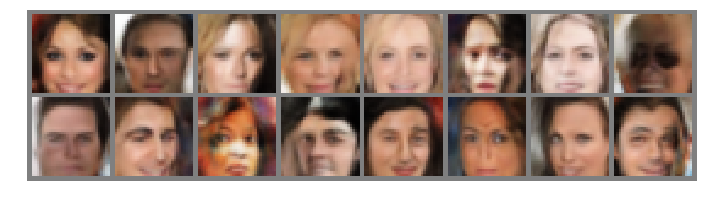

Epoch [  135/  150] | d_loss: 0.3369 | g_loss: 3.3817
Epoch [  135/  150] | d_loss: 0.2981 | g_loss: 2.1043
Epoch [  135/  150] | d_loss: 0.1281 | g_loss: 2.1731
Epoch [  135/  150] | d_loss: 0.3151 | g_loss: 1.9311
Epoch [  135/  150] | d_loss: 0.3203 | g_loss: 2.8276
Epoch [  135/  150] | d_loss: 0.5347 | g_loss: 1.8302
Epoch [  135/  150] | d_loss: 0.4618 | g_loss: 2.9699
Epoch [  135/  150] | d_loss: 0.2901 | g_loss: 1.5403
Epoch [  135/  150] | d_loss: 0.4965 | g_loss: 3.6873
Epoch [  135/  150] | d_loss: 0.7911 | g_loss: 3.3757
Epoch [  135/  150] | d_loss: 0.4154 | g_loss: 2.8570
Epoch [  135/  150] | d_loss: 0.5051 | g_loss: 1.9674
Epoch [  135/  150] | d_loss: 0.9256 | g_loss: 3.8378
Epoch [  135/  150] | d_loss: 0.5633 | g_loss: 2.3132
Epoch [  135/  150] | d_loss: 0.6421 | g_loss: 3.4286


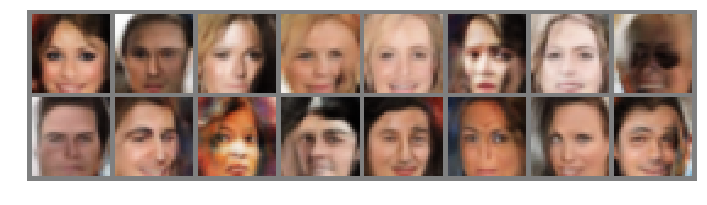

Epoch [  136/  150] | d_loss: 0.5427 | g_loss: 1.9652
Epoch [  136/  150] | d_loss: 0.4500 | g_loss: 2.9277
Epoch [  136/  150] | d_loss: 0.7219 | g_loss: 1.5753
Epoch [  136/  150] | d_loss: 0.2951 | g_loss: 3.7639
Epoch [  136/  150] | d_loss: 0.2245 | g_loss: 1.4495
Epoch [  136/  150] | d_loss: 0.6138 | g_loss: 2.5651
Epoch [  136/  150] | d_loss: 0.6793 | g_loss: 3.4084
Epoch [  136/  150] | d_loss: 0.8038 | g_loss: 2.5666
Epoch [  136/  150] | d_loss: 0.2814 | g_loss: 3.4228
Epoch [  136/  150] | d_loss: 0.6369 | g_loss: 2.9181
Epoch [  136/  150] | d_loss: 0.8768 | g_loss: 3.9847
Epoch [  136/  150] | d_loss: 0.2354 | g_loss: 4.1874
Epoch [  136/  150] | d_loss: 0.6261 | g_loss: 4.6325
Epoch [  136/  150] | d_loss: 0.1540 | g_loss: 3.6911
Epoch [  136/  150] | d_loss: 0.3021 | g_loss: 5.8708


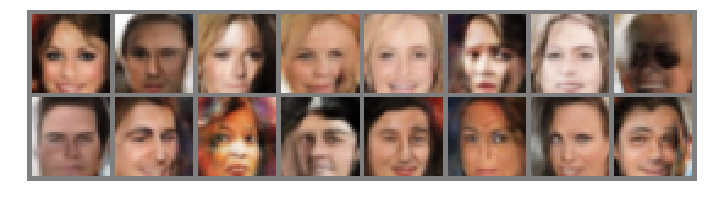

Epoch [  137/  150] | d_loss: 0.4250 | g_loss: 2.6230
Epoch [  137/  150] | d_loss: 0.3689 | g_loss: 2.3688
Epoch [  137/  150] | d_loss: 0.2419 | g_loss: 2.7108
Epoch [  137/  150] | d_loss: 0.7456 | g_loss: 3.1138
Epoch [  137/  150] | d_loss: 0.4195 | g_loss: 3.4966
Epoch [  137/  150] | d_loss: 0.3112 | g_loss: 1.6888
Epoch [  137/  150] | d_loss: 0.2786 | g_loss: 3.5802
Epoch [  137/  150] | d_loss: 0.8107 | g_loss: 2.9790
Epoch [  137/  150] | d_loss: 0.4411 | g_loss: 1.4724
Epoch [  137/  150] | d_loss: 0.3846 | g_loss: 2.2978
Epoch [  137/  150] | d_loss: 0.3037 | g_loss: 2.4809
Epoch [  137/  150] | d_loss: 0.2554 | g_loss: 3.9916
Epoch [  137/  150] | d_loss: 0.9548 | g_loss: 0.8079
Epoch [  137/  150] | d_loss: 0.5707 | g_loss: 1.7922
Epoch [  137/  150] | d_loss: 0.3841 | g_loss: 2.8621


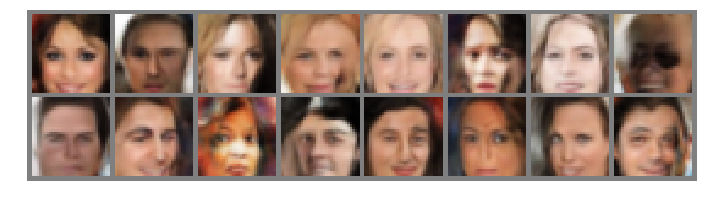

Epoch [  138/  150] | d_loss: 0.2666 | g_loss: 3.6455
Epoch [  138/  150] | d_loss: 0.5562 | g_loss: 2.2983
Epoch [  138/  150] | d_loss: 0.4559 | g_loss: 3.1483
Epoch [  138/  150] | d_loss: 0.6360 | g_loss: 3.6963
Epoch [  138/  150] | d_loss: 0.7607 | g_loss: 3.0947
Epoch [  138/  150] | d_loss: 0.3358 | g_loss: 2.7333
Epoch [  138/  150] | d_loss: 0.3427 | g_loss: 4.2168
Epoch [  138/  150] | d_loss: 0.5639 | g_loss: 3.6031
Epoch [  138/  150] | d_loss: 0.4044 | g_loss: 2.5721
Epoch [  138/  150] | d_loss: 0.6786 | g_loss: 3.0436
Epoch [  138/  150] | d_loss: 0.5727 | g_loss: 2.3042
Epoch [  138/  150] | d_loss: 0.6871 | g_loss: 2.5643
Epoch [  138/  150] | d_loss: 0.4978 | g_loss: 2.2723
Epoch [  138/  150] | d_loss: 0.3637 | g_loss: 2.9340
Epoch [  138/  150] | d_loss: 0.1963 | g_loss: 1.4272


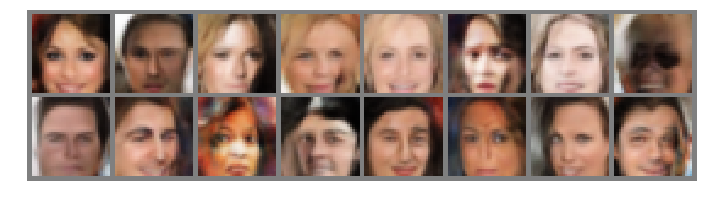

Epoch [  139/  150] | d_loss: 0.2850 | g_loss: 4.0541
Epoch [  139/  150] | d_loss: 0.4138 | g_loss: 1.8211
Epoch [  139/  150] | d_loss: 0.7250 | g_loss: 2.4532
Epoch [  139/  150] | d_loss: 0.4110 | g_loss: 2.0947
Epoch [  139/  150] | d_loss: 0.2561 | g_loss: 3.2675
Epoch [  139/  150] | d_loss: 0.6500 | g_loss: 2.1333
Epoch [  139/  150] | d_loss: 0.3724 | g_loss: 2.0156
Epoch [  139/  150] | d_loss: 0.2283 | g_loss: 1.9617
Epoch [  139/  150] | d_loss: 0.3286 | g_loss: 4.2558
Epoch [  139/  150] | d_loss: 0.1208 | g_loss: 1.3614
Epoch [  139/  150] | d_loss: 0.4869 | g_loss: 0.9343
Epoch [  139/  150] | d_loss: 0.4534 | g_loss: 1.8256
Epoch [  139/  150] | d_loss: 0.3137 | g_loss: 2.8878
Epoch [  139/  150] | d_loss: 0.4257 | g_loss: 3.5559
Epoch [  139/  150] | d_loss: 0.4864 | g_loss: 3.4040


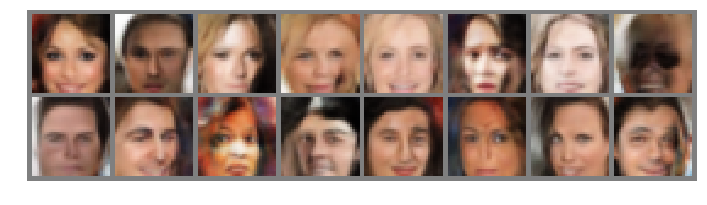

Epoch [  140/  150] | d_loss: 0.8094 | g_loss: 4.7583
Epoch [  140/  150] | d_loss: 1.7561 | g_loss: 1.9964
Epoch [  140/  150] | d_loss: 0.1862 | g_loss: 1.8775
Epoch [  140/  150] | d_loss: 0.7752 | g_loss: 3.3516
Epoch [  140/  150] | d_loss: 0.4236 | g_loss: 4.1780
Epoch [  140/  150] | d_loss: 0.3321 | g_loss: 4.2245
Epoch [  140/  150] | d_loss: 0.6615 | g_loss: 1.6564
Epoch [  140/  150] | d_loss: 0.4107 | g_loss: 2.2022
Epoch [  140/  150] | d_loss: 0.3440 | g_loss: 2.4792
Epoch [  140/  150] | d_loss: 0.3513 | g_loss: 1.8553
Epoch [  140/  150] | d_loss: 0.6775 | g_loss: 3.8292
Epoch [  140/  150] | d_loss: 0.3855 | g_loss: 2.8946
Epoch [  140/  150] | d_loss: 0.1371 | g_loss: 2.3264
Epoch [  140/  150] | d_loss: 0.1236 | g_loss: 2.9647
Epoch [  140/  150] | d_loss: 0.2520 | g_loss: 3.3916


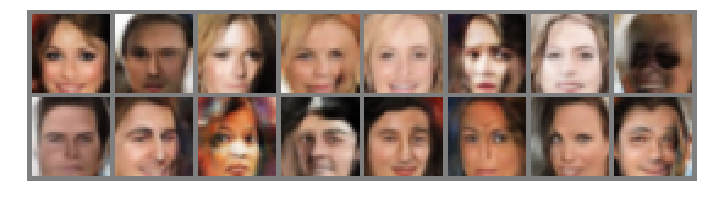

Epoch [  141/  150] | d_loss: 0.3964 | g_loss: 4.5293
Epoch [  141/  150] | d_loss: 0.4787 | g_loss: 3.9802
Epoch [  141/  150] | d_loss: 0.3391 | g_loss: 3.5614
Epoch [  141/  150] | d_loss: 0.2500 | g_loss: 3.5630
Epoch [  141/  150] | d_loss: 0.1802 | g_loss: 4.0722
Epoch [  142/  150] | d_loss: 0.7783 | g_loss: 1.9070
Epoch [  142/  150] | d_loss: 0.8067 | g_loss: 3.4887
Epoch [  142/  150] | d_loss: 0.6932 | g_loss: 4.1246
Epoch [  142/  150] | d_loss: 0.3380 | g_loss: 2.6403
Epoch [  142/  150] | d_loss: 0.4062 | g_loss: 4.8084
Epoch [  142/  150] | d_loss: 0.5484 | g_loss: 2.9169
Epoch [  142/  150] | d_loss: 0.2860 | g_loss: 5.0474
Epoch [  142/  150] | d_loss: 0.9958 | g_loss: 4.5980
Epoch [  142/  150] | d_loss: 1.6798 | g_loss: 4.1869


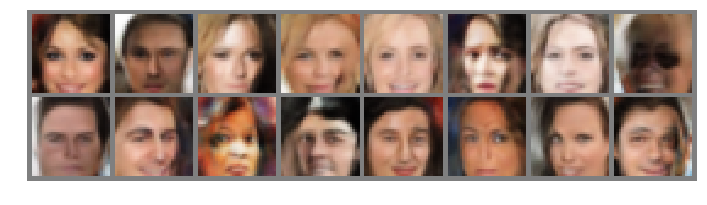

Epoch [  143/  150] | d_loss: 0.2590 | g_loss: 5.3551
Epoch [  143/  150] | d_loss: 0.5340 | g_loss: 1.5288
Epoch [  143/  150] | d_loss: 0.1313 | g_loss: 3.7336
Epoch [  143/  150] | d_loss: 0.2541 | g_loss: 3.5890
Epoch [  143/  150] | d_loss: 0.1683 | g_loss: 3.6815
Epoch [  143/  150] | d_loss: 0.4524 | g_loss: 2.4846
Epoch [  143/  150] | d_loss: 0.5670 | g_loss: 3.0803
Epoch [  143/  150] | d_loss: 0.2848 | g_loss: 3.1371
Epoch [  143/  150] | d_loss: 0.7613 | g_loss: 3.3245
Epoch [  143/  150] | d_loss: 0.5145 | g_loss: 2.9194
Epoch [  143/  150] | d_loss: 0.4281 | g_loss: 2.5677
Epoch [  143/  150] | d_loss: 0.5612 | g_loss: 2.2692
Epoch [  143/  150] | d_loss: 0.4368 | g_loss: 3.4911
Epoch [  143/  150] | d_loss: 0.7356 | g_loss: 4.5753
Epoch [  143/  150] | d_loss: 0.4208 | g_loss: 5.1288


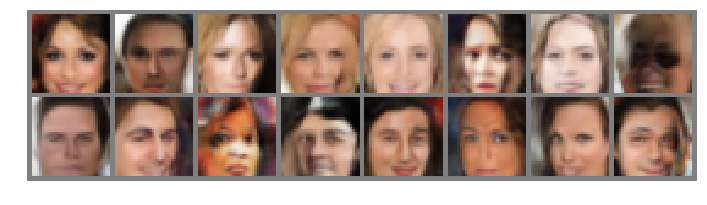

Epoch [  144/  150] | d_loss: 0.1202 | g_loss: 5.5951
Epoch [  144/  150] | d_loss: 1.3118 | g_loss: 3.9103
Epoch [  144/  150] | d_loss: 0.5855 | g_loss: 3.9058
Epoch [  144/  150] | d_loss: 0.6688 | g_loss: 4.0334
Epoch [  144/  150] | d_loss: 0.2677 | g_loss: 3.2053
Epoch [  144/  150] | d_loss: 0.5537 | g_loss: 2.5257
Epoch [  144/  150] | d_loss: 0.4438 | g_loss: 1.8882
Epoch [  144/  150] | d_loss: 0.5269 | g_loss: 3.9170
Epoch [  144/  150] | d_loss: 0.1382 | g_loss: 5.7514
Epoch [  144/  150] | d_loss: 0.4063 | g_loss: 2.7648
Epoch [  144/  150] | d_loss: 1.3015 | g_loss: 3.4759
Epoch [  144/  150] | d_loss: 0.5699 | g_loss: 3.4152
Epoch [  144/  150] | d_loss: 0.5043 | g_loss: 2.1745
Epoch [  144/  150] | d_loss: 0.1821 | g_loss: 2.0555
Epoch [  144/  150] | d_loss: 0.4725 | g_loss: 2.2093


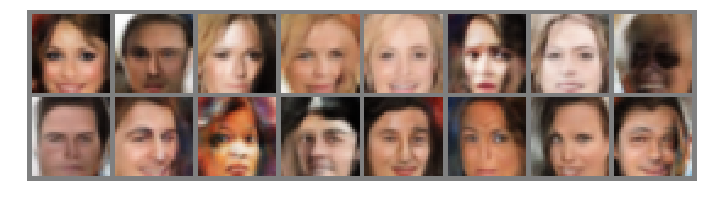

Epoch [  145/  150] | d_loss: 0.4762 | g_loss: 1.2472
Epoch [  145/  150] | d_loss: 0.5632 | g_loss: 3.3504
Epoch [  145/  150] | d_loss: 0.8080 | g_loss: 1.6270
Epoch [  145/  150] | d_loss: 0.2474 | g_loss: 3.1564
Epoch [  145/  150] | d_loss: 0.6400 | g_loss: 2.3174
Epoch [  145/  150] | d_loss: 1.2190 | g_loss: 3.8517
Epoch [  145/  150] | d_loss: 0.3989 | g_loss: 1.6250
Epoch [  145/  150] | d_loss: 0.3326 | g_loss: 1.8618
Epoch [  145/  150] | d_loss: 0.6258 | g_loss: 1.0252
Epoch [  145/  150] | d_loss: 0.5316 | g_loss: 2.3275
Epoch [  145/  150] | d_loss: 0.3856 | g_loss: 1.6669
Epoch [  145/  150] | d_loss: 0.6476 | g_loss: 3.0504
Epoch [  145/  150] | d_loss: 0.4175 | g_loss: 3.0752
Epoch [  145/  150] | d_loss: 0.2994 | g_loss: 1.7094
Epoch [  145/  150] | d_loss: 1.4706 | g_loss: 1.8767


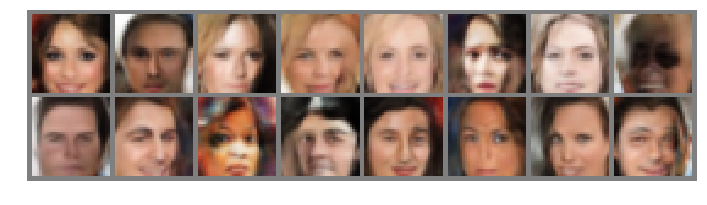

Epoch [  146/  150] | d_loss: 0.9587 | g_loss: 1.5885
Epoch [  146/  150] | d_loss: 0.1522 | g_loss: 2.9644
Epoch [  146/  150] | d_loss: 0.2413 | g_loss: 3.5634
Epoch [  146/  150] | d_loss: 0.2419 | g_loss: 1.8029
Epoch [  146/  150] | d_loss: 0.2601 | g_loss: 3.9280
Epoch [  146/  150] | d_loss: 0.4508 | g_loss: 4.9089
Epoch [  146/  150] | d_loss: 0.5153 | g_loss: 4.1174
Epoch [  146/  150] | d_loss: 0.5771 | g_loss: 3.7037
Epoch [  146/  150] | d_loss: 0.7559 | g_loss: 2.9071
Epoch [  146/  150] | d_loss: 0.5318 | g_loss: 3.5861
Epoch [  146/  150] | d_loss: 0.4706 | g_loss: 2.3245
Epoch [  146/  150] | d_loss: 0.1669 | g_loss: 3.2751
Epoch [  146/  150] | d_loss: 0.9109 | g_loss: 4.5710
Epoch [  146/  150] | d_loss: 0.6647 | g_loss: 3.1379
Epoch [  146/  150] | d_loss: 0.3189 | g_loss: 2.4242


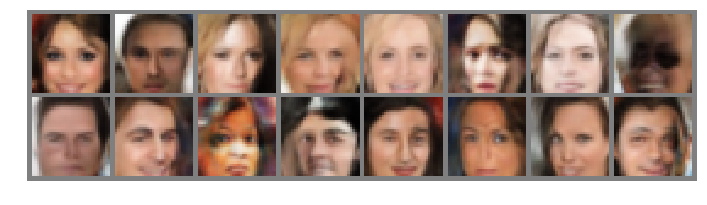

Epoch [  147/  150] | d_loss: 0.3322 | g_loss: 3.4982
Epoch [  147/  150] | d_loss: 0.3483 | g_loss: 4.3767
Epoch [  147/  150] | d_loss: 0.2714 | g_loss: 1.8913
Epoch [  147/  150] | d_loss: 1.1271 | g_loss: 2.8158
Epoch [  147/  150] | d_loss: 0.1602 | g_loss: 2.6319
Epoch [  147/  150] | d_loss: 0.3714 | g_loss: 4.0276
Epoch [  147/  150] | d_loss: 0.1786 | g_loss: 2.3597
Epoch [  147/  150] | d_loss: 0.3823 | g_loss: 4.3100
Epoch [  147/  150] | d_loss: 0.2450 | g_loss: 2.4564
Epoch [  147/  150] | d_loss: 0.2427 | g_loss: 1.3237
Epoch [  147/  150] | d_loss: 0.4936 | g_loss: 3.8786
Epoch [  147/  150] | d_loss: 0.2418 | g_loss: 2.8691
Epoch [  147/  150] | d_loss: 0.6512 | g_loss: 1.5163
Epoch [  147/  150] | d_loss: 0.3473 | g_loss: 2.8300
Epoch [  147/  150] | d_loss: 0.3196 | g_loss: 4.7399


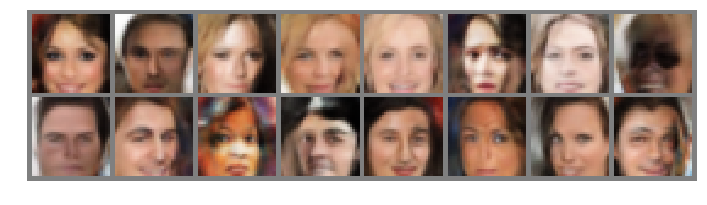

Epoch [  148/  150] | d_loss: 0.9004 | g_loss: 3.8124
Epoch [  148/  150] | d_loss: 0.5492 | g_loss: 2.5326
Epoch [  148/  150] | d_loss: 1.0856 | g_loss: 3.7347
Epoch [  148/  150] | d_loss: 0.5261 | g_loss: 2.4300
Epoch [  148/  150] | d_loss: 0.3019 | g_loss: 3.3777
Epoch [  148/  150] | d_loss: 0.5905 | g_loss: 3.6942
Epoch [  148/  150] | d_loss: 0.2819 | g_loss: 2.9381
Epoch [  148/  150] | d_loss: 0.7730 | g_loss: 4.9445
Epoch [  148/  150] | d_loss: 0.5010 | g_loss: 2.0673
Epoch [  148/  150] | d_loss: 0.4757 | g_loss: 3.0834
Epoch [  148/  150] | d_loss: 0.4394 | g_loss: 3.1913
Epoch [  148/  150] | d_loss: 0.9916 | g_loss: 3.5121
Epoch [  148/  150] | d_loss: 0.4012 | g_loss: 3.1714
Epoch [  148/  150] | d_loss: 0.6103 | g_loss: 3.9380
Epoch [  148/  150] | d_loss: 0.7100 | g_loss: 3.5105


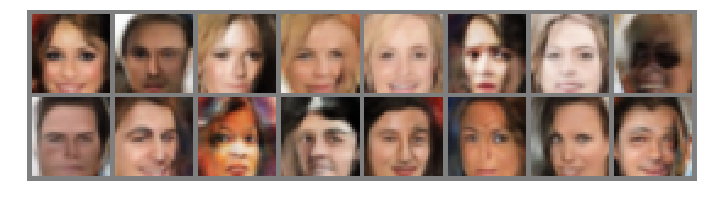

Epoch [  149/  150] | d_loss: 0.5391 | g_loss: 3.4200
Epoch [  149/  150] | d_loss: 0.3086 | g_loss: 2.2042
Epoch [  149/  150] | d_loss: 0.3502 | g_loss: 3.4449
Epoch [  149/  150] | d_loss: 0.3463 | g_loss: 4.7974
Epoch [  149/  150] | d_loss: 0.4555 | g_loss: 1.7521
Epoch [  149/  150] | d_loss: 0.2857 | g_loss: 2.6499
Epoch [  149/  150] | d_loss: 0.1550 | g_loss: 1.9501
Epoch [  149/  150] | d_loss: 0.3880 | g_loss: 1.8638
Epoch [  149/  150] | d_loss: 0.6782 | g_loss: 3.0922
Epoch [  149/  150] | d_loss: 0.5217 | g_loss: 3.8148
Epoch [  149/  150] | d_loss: 0.6903 | g_loss: 2.8444
Epoch [  149/  150] | d_loss: 0.5297 | g_loss: 2.9169
Epoch [  149/  150] | d_loss: 0.5582 | g_loss: 2.3931
Epoch [  149/  150] | d_loss: 0.5346 | g_loss: 5.8512
Epoch [  149/  150] | d_loss: 0.5237 | g_loss: 5.2551


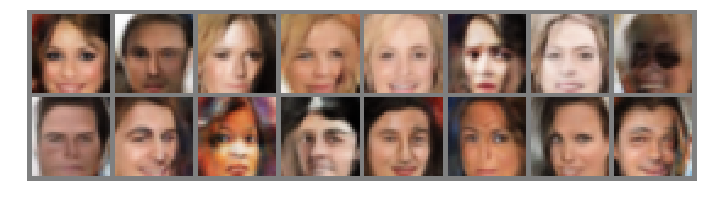

Epoch [  150/  150] | d_loss: 0.2635 | g_loss: 2.1043
Epoch [  150/  150] | d_loss: 0.3118 | g_loss: 2.6660
Epoch [  150/  150] | d_loss: 0.3557 | g_loss: 3.9259
Epoch [  150/  150] | d_loss: 0.5624 | g_loss: 3.7287
Epoch [  150/  150] | d_loss: 0.3841 | g_loss: 2.7795
Epoch [  150/  150] | d_loss: 0.1868 | g_loss: 3.2232
Epoch [  150/  150] | d_loss: 1.9571 | g_loss: 5.4948
Epoch [  150/  150] | d_loss: 0.5312 | g_loss: 1.6675
Epoch [  150/  150] | d_loss: 0.3798 | g_loss: 2.6830
Epoch [  150/  150] | d_loss: 0.2764 | g_loss: 2.6028
Epoch [  150/  150] | d_loss: 0.5278 | g_loss: 0.7117
Epoch [  150/  150] | d_loss: 0.5411 | g_loss: 5.2582
Epoch [  150/  150] | d_loss: 0.3333 | g_loss: 2.1343
Epoch [  150/  150] | d_loss: 0.4030 | g_loss: 3.6390
Epoch [  150/  150] | d_loss: 0.3342 | g_loss: 2.5913


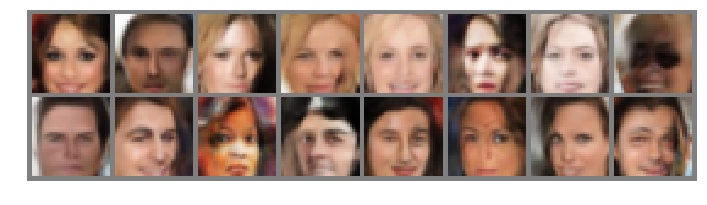

In [19]:
# set number of epochs 
n_epochs = 150


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)

## Training loss

Plot the training losses for the generator and discriminator, recorded after each epoch.

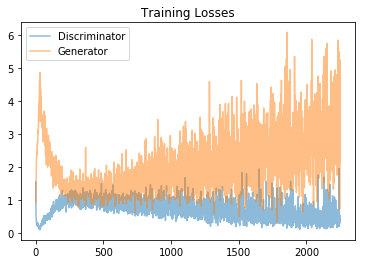

In [20]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

## Generator samples from training

View samples of images from the generator, and answer a question about the strengths and weaknesses of your trained models.

In [21]:
# helper function for viewing a list of passed in sample images
def view_samples(epoch, samples):
    fig, axes = plt.subplots(figsize=(16,4), nrows=2, ncols=8, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = ((img + 1)*255 / (2)).astype(np.uint8)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(img.reshape((32,32,3)))

In [22]:
# Load samples from generator, taken while training
with open('train_samples.pkl', 'rb') as f:
    samples = pkl.load(f)

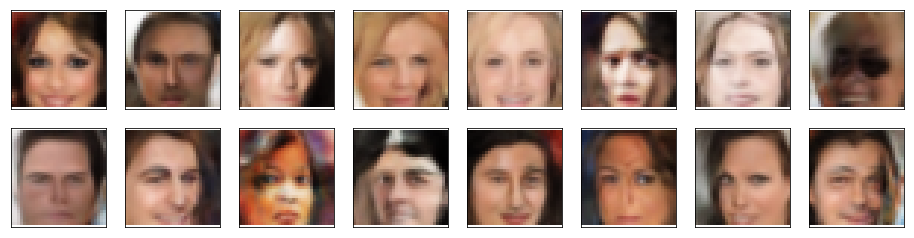

In [23]:
_ = view_samples(-1, samples)

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result


**Answer:** 

The generated samples are:
- White faces
- Low quality images

To improve the model We might:
- Add faces of different races and colors to the dataset
- Train on high resolution datasets
- Try larger models
- Try different optimizer
- Try a smaller batch size

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "problem_unittests.py" files in your submission.